## Imports, Helpful Functions, Plot Settings

In [1]:
import numpy as np
from astropy import units as u, constants as const
from matplotlib import pyplot as plt
from scipy.stats import beta
from scipy.special import beta as betafct
from numba import jit, jitclass
from scipy import interpolate
from scipy.interpolate import interp1d
import logging
import sys
import os
sys.path.insert(1, '/home/jsipple/one_d_spherical_collapse/one-d-spherical-collapse-of-fuzzy-dark-matter/src')
import importlib
import simulation_strategies, collapse, plotting, utils, analtyic_formulas
importlib.reload(simulation_strategies)
importlib.reload(collapse)
importlib.reload(plotting)
importlib.reload(utils)
importlib.reload(analtyic_formulas)
from simulation_strategies import *
from collapse import *
from plotting import *
from utils import *
from analtyic_formulas import *
import cProfile
import pstats

import warnings
warnings.filterwarnings('ignore', category=np.VisibleDeprecationWarning)



t_i = 1
G = 1
rho_H = 1/(6*np.pi*G*t_i**2)
H = 2/(3*t_i)
ss = SelfSimilarSolution(t_i, G, rho_H)

def compute_r0_min(r_min, r_max, N):
    """
    Compute r0_min such that the spacing dR in np.linspace(r0_min, r_max, N)
    satisfies dR = r0_min - r_min. That is, the inner edge of the innermost shell is at r_min.
    
    Parameters:
    - r_min (float): The minimum radius.
    - r_max (float): The maximum radius.
    - N (int): Number of points.
    
    Returns:
    - float: The computed r0_min.
    """
    return (r_max + r_min * (N - 1)) / N

def make_cycloid_config(r_min=1e-2, r_max=1, N=10, t_max=5000, dt_min=1e-9, rho_bar=rho_H, delta_i=1e-2, stepper_strategy='velocity_verlet', timescale_strategy='dyn', save_strategy='vflip', safety_factor=1e-4, reflect_bool=False, save_dt=1e-2, j_coeff=0, softlen=0, thickness_coef=0, irs='r0min_start_equal', mes='overlap_inclusive', pressure_strategy='zero', polytropic_index=-1, polytropic_coef=0, accel_strategy='soft_all', r_th=None, no_pm=False):
    if r_th is None:
        r_th = r_max
    m_pert = rho_bar * delta_i * 4/3 * np.pi * min(r_max, r_th)**3
    if no_pm:
        point_mass = 0
        shell_volume_strategy = 'keep_edges'
    else:
        point_mass = 4/3 * np.pi * r_min**3 * rho_bar * (1+delta_i)
        shell_volume_strategy = 'inner_not_zero'

    r0_min = compute_r0_min(r_min=r_min, r_max=r_max, N=N)
    r_min_strategy = 'reflect' if reflect_bool else 'absorb'
    if j_coeff > 0:
        ang_mom_strategy, r_ta_strategy = 'const', 'r_ta_cycloid'
    else:
        ang_mom_strategy, r_ta_strategy = 'zero', 'r_ta_cycloid'
    return {
        'point_mass': point_mass,
        'initial_radius_strategy': irs,
        'density_strategy': 'background_plus_tophat2',
        'delta': delta_i,
        'tophat_radius': 1,
        'r0_min': r0_min,
        'rho_bar': rho_H,
        't_max': t_max,
        'dt_min': dt_min,
        'N': N,
        'r_min': r_min,
        'r_min_strategy': r_min_strategy,
        'H': H,
        'r_max': r_max,
        'm_pert': m_pert, 
        'stepper_strategy': stepper_strategy,
        'timescale_strategy': timescale_strategy,
        'save_strategy': save_strategy,
        'safety_factor': safety_factor,
        'save_dt': save_dt,
        'j_coef': j_coeff,
        'ang_mom_strategy': ang_mom_strategy,
        'r_ta_strategy': r_ta_strategy,
        'save_strategy': 'vflip',
        'softlen': softlen,
        'thickness_coef': thickness_coef,
        'm_enc_strategy': mes,
        'pressure_strategy': pressure_strategy,
        'polytropic_index': polytropic_index,
        'polytropic_coef': polytropic_coef,
        'accel_strategy': accel_strategy,
        'shell_volume_strategy': shell_volume_strategy,
    }


cycloid_config = make_cycloid_config(t_max=4758,)

cycloid_reflect_config1 = make_cycloid_config(N=1, reflect_bool=True, t_max=25000, r_min=0.5, timescale_strategy='dyn_rmin', dt_min=1e-12, safety_factor=1e-4,)

cycloid_reflect_config1_soft = make_cycloid_config(N=1, reflect_bool=True, t_max=25000, r_min=0.5, timescale_strategy='dyn_rmin', dt_min=1e-12, safety_factor=1e-4, softlen=1e-2)
cycloid_reflect_config1_very_soft = make_cycloid_config(N=1, reflect_bool=True, t_max=25000, r_min=0.5, timescale_strategy='dyn_rmin', dt_min=1e-12, safety_factor=1e-4, softlen=1e-1)
cycloid_reflect_config2_soft = make_cycloid_config(N=2, reflect_bool=True, t_max=5000, r_min=0.5, timescale_strategy='dyn_rmin', dt_min=1e-12, safety_factor=1e-4, softlen=1e-2)
cycloid_reflect_config2_very_soft = make_cycloid_config(N=2, reflect_bool=True, t_max=25_000, r_min=0.5, timescale_strategy='dyn_rmin', dt_min=1e-12, safety_factor=1e-4, softlen=1e-1)

cycloid_reflect_config2_thick = make_cycloid_config(N=2, reflect_bool=True, t_max=5000, r_min=0.5, timescale_strategy='dyn_rmin_thickness', dt_min=1e-12, safety_factor=1e-4, thickness_coef=1e-2)
cycloid_reflect_config2_very_thick = make_cycloid_config(N=2, reflect_bool=True, t_max=5000, r_min=0.5, timescale_strategy='dyn_rmin_thickness', dt_min=1e-12, safety_factor=5e-5, thickness_coef=0.25, save_dt=1e-2)

cycloid_reflect_config2 = make_cycloid_config(N=2, reflect_bool=True, t_max=5000, r_min=0.5, timescale_strategy='dyn_rmin', dt_min=1e-12, safety_factor=1e-4)

cycloid_reflect_config2_large = make_cycloid_config(N=2, reflect_bool=True, t_max=50, r_min=0.5, timescale_strategy='dyn_rmin', dt_min=1e-12, safety_factor=1e-4, delta_i=1)
cycloid_reflect_config2_minus2 = make_cycloid_config(N=2, reflect_bool=True, t_max=5000, r_min=1e-2, timescale_strategy='dyn_rmin', dt_min=1e-12, safety_factor=1e-4)

cycloid_j_config1 = make_cycloid_config(N=1, reflect_bool=False, t_max=25000, r_min=1e-6, timescale_strategy='dyn_rmin', dt_min=1e-12, safety_factor=1e-4, j_coeff=1e-3)
cycloid_j_config2 = make_cycloid_config(N=2, reflect_bool=False, t_max=25000, r_min=1e-6, timescale_strategy='dyn_rmin', dt_min=1e-12, safety_factor=1e-4, j_coeff=1e-3)
cycloid_j_config2_large = make_cycloid_config(N=2, reflect_bool=False, t_max=25000, r_min=1e-6, timescale_strategy='dyn_rmin', dt_min=1e-12, safety_factor=1e-4, j_coeff=1e-1)

In [2]:
equal_mass_config1 = make_cycloid_config(N=1, reflect_bool=True, t_max=25000, r_min=0.5, timescale_strategy='dyn_rmin', dt_min=1e-12, safety_factor=1e-4, irs='equal_mass')
equal_mass_config2 = make_cycloid_config(N=2, reflect_bool=True, t_max=5000, r_min=0.5, timescale_strategy='dyn_rmin', dt_min=1e-12, safety_factor=1e-4, irs='equal_mass')
equal_mass_config17 = make_cycloid_config(N=17, reflect_bool=True, t_max=2000, r_min=0.5, timescale_strategy='dyn_rmin', dt_min=1e-12, safety_factor=1e-4, irs='equal_mass')

In [3]:
neighbor_config2 = make_cycloid_config(N=2, reflect_bool=True, t_max=5000, r_min=0.5, timescale_strategy='dyn_rmin', dt_min=1e-12, safety_factor=1e-4, irs='equal_mass', mes='neighbor')
neighbor_config2000 = make_cycloid_config(N=2000, reflect_bool=True, t_max=5000, r_min=0.5, timescale_strategy='dyn_rmin', dt_min=1e-12, safety_factor=1e-4, irs='equal_mass', mes='neighbor', delta_i=1e-2, save_dt=1)

neighbor2_config2 = make_cycloid_config(N=2, reflect_bool=True, t_max=25000, r_min=0.5, timescale_strategy='dyn_rmin', dt_min=5e-17, safety_factor=1e-4, irs='equal_mass', mes='neighbor2', no_pm=True)
neighbor2_config2_save = make_cycloid_config(N=2, reflect_bool=True, t_max=1000, r_min=0.5, timescale_strategy='dyn_rmin', dt_min=1e-12, safety_factor=1e-4, irs='equal_mass', mes='neighbor2', save_dt=1e-4, no_pm=True)
neighbor2_config10 = make_cycloid_config(N=10, reflect_bool=True, t_max=3000, r_min=0.5, timescale_strategy='dyn_rmin', dt_min=1e-12, safety_factor=1e-4, irs='equal_mass', mes='neighbor2', delta_i=1e-2, save_dt=1, no_pm=True)

neighbor2_config50 = make_cycloid_config(N=50, reflect_bool=True, t_max=5300, r_min=0.9, timescale_strategy='dyn_rmin', dt_min=1e-12, safety_factor=1e-4, irs='equal_mass', mes='neighbor2', delta_i=1e-2, no_pm=True)

neighbor2_config2_small_min = make_cycloid_config(N=2, reflect_bool=True, t_max=5000, r_min=1e-2, timescale_strategy='dyn_rmin', dt_min=1e-12, safety_factor=1e-5, irs='equal_mass', mes='neighbor2')
neighbor2_config10_small_min = make_cycloid_config(N=10, reflect_bool=True, t_max=5000, r_min=1e-2, timescale_strategy='dyn_rmin', dt_min=1e-12, safety_factor=1e-5, irs='equal_mass', mes='neighbor2')

In [4]:
neighbor2_config3 = make_cycloid_config(N=4, reflect_bool=True, t_max=6000, r_min=0.1, timescale_strategy='dyn', dt_min=1e-12, safety_factor=1e-4, mes='const_inclusive', no_pm=True, r_max=1.5, irs='dr_start_equal')

In [5]:
pressure_config2 = make_cycloid_config(N=2, reflect_bool=True, t_max=5000, r_min=0.5, timescale_strategy='dyn_rmin', dt_min=1e-12, safety_factor=1e-4, pressure_strategy='polytrope', polytropic_index=1.5, polytropic_coef=10, r_th=1, r_max=1.1)
print(pressure_config2)

{'point_mass': 0.028055555555555556, 'initial_radius_strategy': 'r0min_start_equal', 'density_strategy': 'background_plus_tophat2', 'delta': 0.01, 'tophat_radius': 1, 'r0_min': 0.8, 'rho_bar': 0.05305164769729845, 't_max': 5000, 'dt_min': 1e-12, 'N': 2, 'r_min': 0.5, 'r_min_strategy': 'reflect', 'H': 0.6666666666666666, 'r_max': 1.1, 'm_pert': 0.0022222222222222222, 'stepper_strategy': 'velocity_verlet', 'timescale_strategy': 'dyn_rmin', 'save_strategy': 'vflip', 'safety_factor': 0.0001, 'save_dt': 0.01, 'j_coef': 0, 'ang_mom_strategy': 'zero', 'r_ta_strategy': 'r_ta_cycloid', 'softlen': 0, 'thickness_coef': 0, 'm_enc_strategy': 'overlap_inclusive', 'pressure_strategy': 'polytrope', 'polytropic_index': 1.5, 'polytropic_coef': 10, 'accel_strategy': 'soft_all', 'shell_volume_strategy': 'inner_not_zero'}


In [6]:
# Default plotting settings
def my_mpl():
    plt.rc('font', family='serif', size=20)
    plt.rc('axes', grid=True)
    plt.rc('lines', lw=3)
    ts = 8
    plt.rc('xtick.minor', size=ts-2)
    plt.rc('ytick.minor', size=ts-2)
    plt.rc('xtick.major', size=ts)
    plt.rc('ytick.major', size=ts)
    plt.rc('figure', figsize=[9, 5])
my_mpl()
logging.basicConfig(level=logging.DEBUG,
                    format='%(asctime)s - %(levelname)s - %(message)s')
logger = logging.getLogger(__name__)
logging.getLogger('matplotlib').setLevel(logging.ERROR)

### Definition of a Shell
I think there are quite a few nuances to this here. My fiducial way is to define a shell as initially running from $r_j$ to $r_j - dR$ with mass $m_j = \frac{4}{3}\pi \rho(r_j) (r_j^3 - (r_j-dR)^3)$. By default for the purposes of reflections, absorptions, crossings, etc. the shell is treated as located entirely at $r_j$. When shell thickness is introduced, for the purpose of crossings ONLY, the shell's mass is spread evenly over the shell's thickness, which is CONSTANT and in general NOT THE SAME AS THE INITIAL SPACING $dR$.


In [9]:
## TODO: Diagram showing shell definition?

### Numerical Integration Strategy (Velocity Verlet)
At time $t_i$, simultaneously for all shells $j$, $r_j$ is updated as follows:
1. Update shell positions according to $r_j(t_i + \Delta t) = r_j(t_i) + v_j(t_i) \Delta t + \frac{1}{2} a_j(t_i) \Delta t^2$
2. Check if $r_j(t_i + \Delta t) < r_{min}$ and handle reflection or absorption by a black hole.
3. Calculate $m_{enc,j}(t_i + \Delta t)$
4. Calculate $a_j(t_i + \Delta t)$
5. Update shell velocities according to $v_j(t_i + \Delta t) = v_j(t_i) + \frac{1}{2} \left(a_j(t_i) + a_j(t_i + \Delta t)\right) \Delta t$
6. Increment time $t_i \rightarrow t_i + \Delta t$

I have Beeman and Leapfrog integrators implemented as well. They seem to work about the same but VV is a little easier to understand in my opinion.

## Cycloid Behavior of A Single Shell

Looking at the equation of a shell under gravity as the only external force (and with no shell crossings):
$$
\frac{d^2 r}{dt^2} = - \frac{Gm_{enc}}{r^2}
$$
 If $\mathcal{E}$ the energy per unit mass, $G$ the gravitational constant, $m_{enc}$ the enclosed mass, and $r$ the radius:
$$\mathcal{E} = \frac{1}{2} \left( \frac{dr}{dt} \right)^2 - \frac{Gm_{enc}}{r}$$
This has a parametric solution for $r(t)$ that is a cycloid (where $\mathcal{E} < 0$).
$$
r(\theta) = \frac{r_{ta}}{2} \left(1 - \cos(\theta) \right),\quad t(\theta) = \frac{t_{ta}}{\pi} \left( \theta - \sin(\theta) \right)
$$
Where $r_{ta}$, $t_{ta}$ are the turnaround radius and time of the shell and are given by:
$$
r_{ta} = \frac{Gm_{enc}}{|\mathcal{E}|},\quad t_{ta} = \frac{\pi Gm_{enc}}{2^{3/2}|\mathcal{E}|^{3/2}}
$$
The trajectories for any shell are self-similar when scaled by the turnaround radius and time.

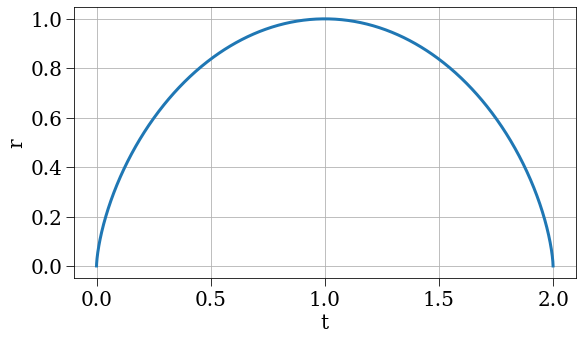

In [6]:
# Analytic Solution
def cycloid_r(theta, r_ta, t_ta):
    return r_ta/2 * (1 - np.cos(theta))
def cycloid_t(theta, r_ta, t_ta):
    return t_ta/np.pi * (theta - np.sin(theta))
theta_vals = np.linspace(0, 2*np.pi, 1000)
r_ta = 1
t_ta = 1
r_vals = cycloid_r(theta_vals, r_ta, t_ta)
t_vals = cycloid_t(theta_vals, r_ta, t_ta)
plt.figure(figsize=(9, 5))
plt.plot(t_vals, r_vals)
plt.xlabel('t')
plt.ylabel('r')
plt.show()

In [7]:
# Numerical Solution
sc = SphericalCollapse(cycloid_config)
results = sc.run()

2025-01-27 17:00:27,577 - collapse - INFO - Simulation setup complete


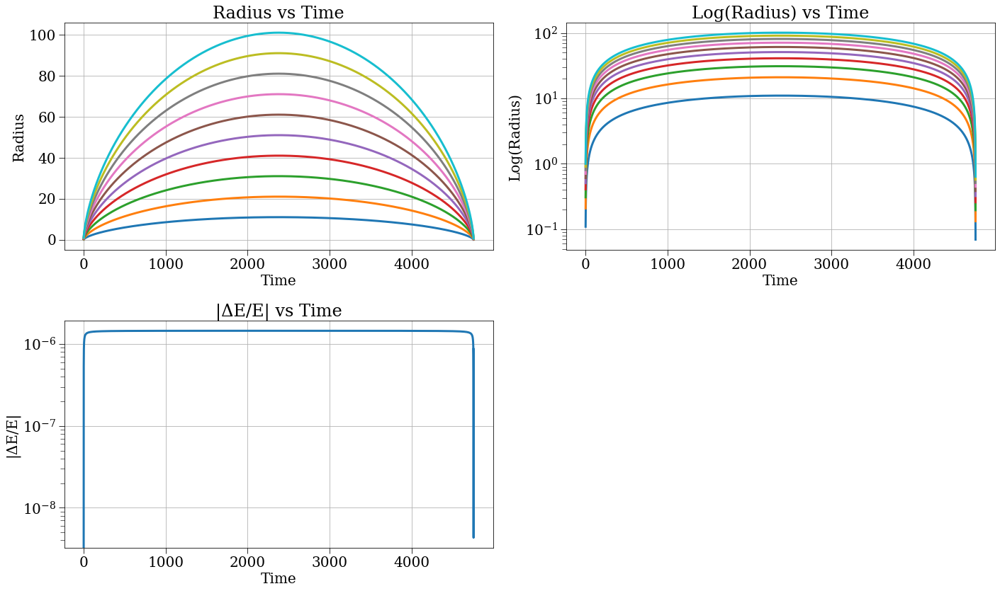

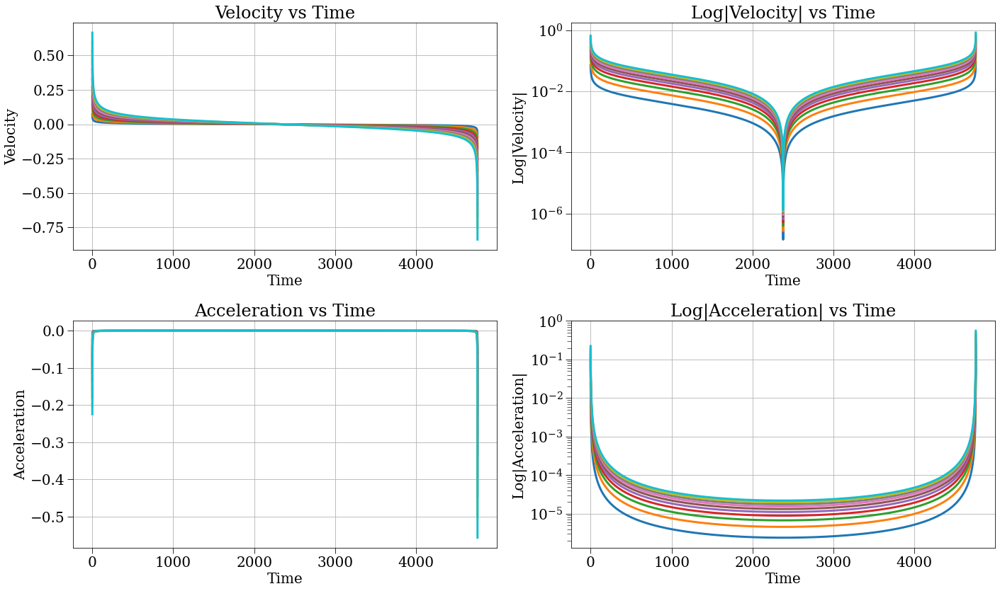

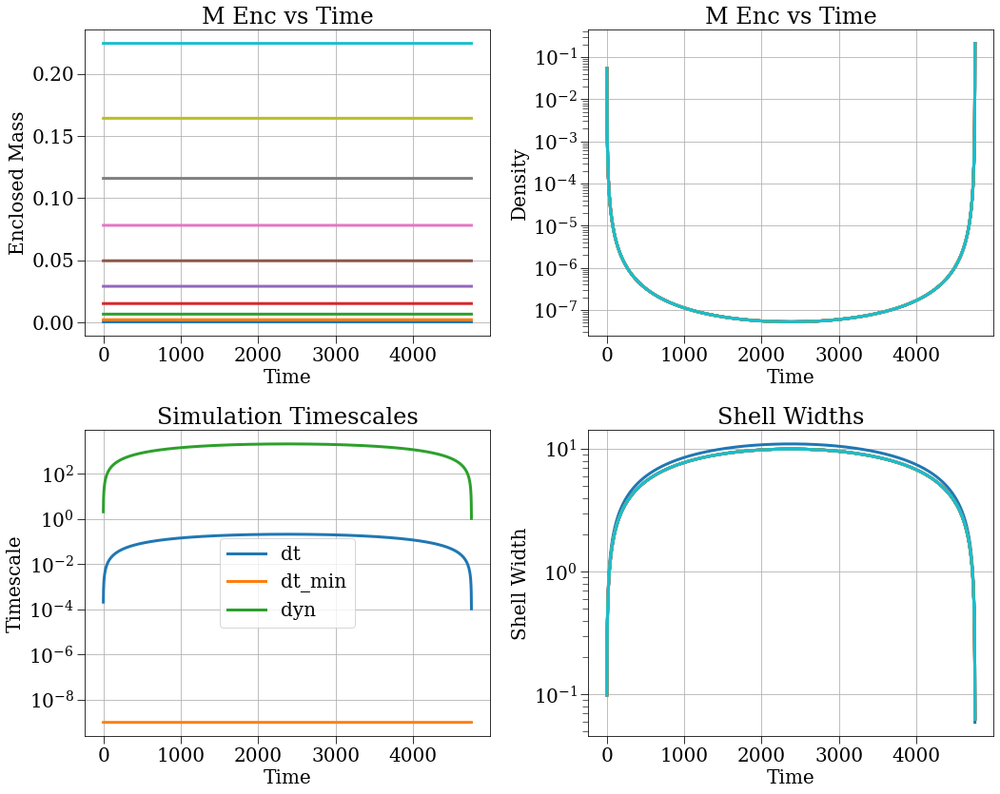

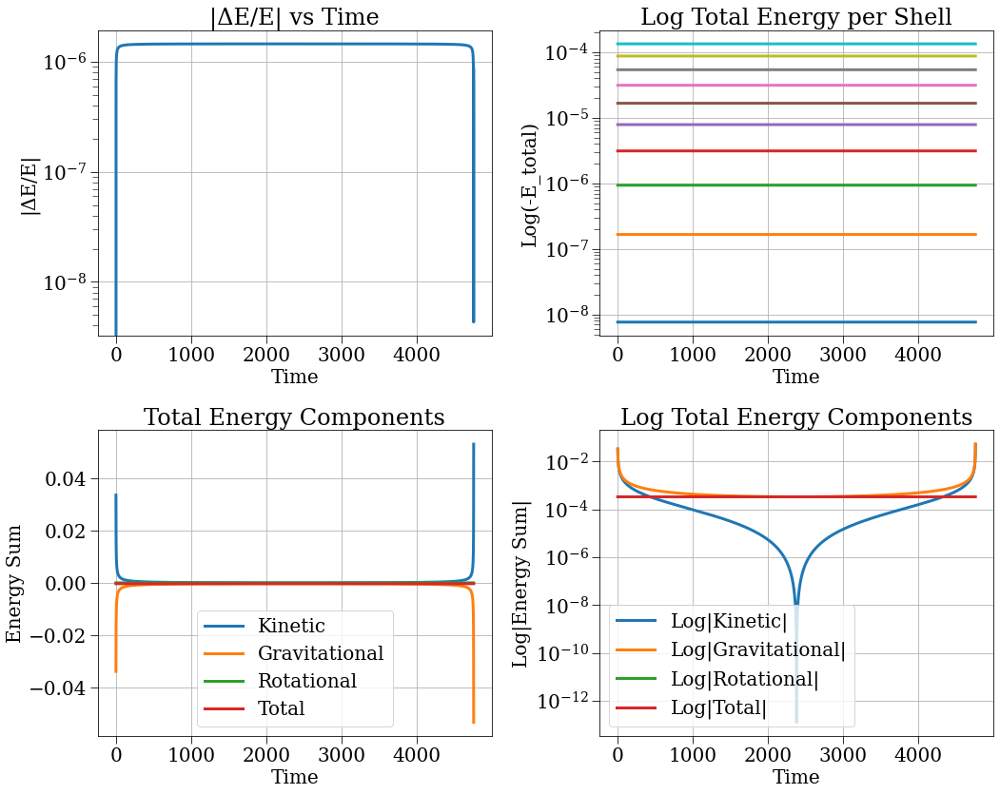

In [8]:
plotter = SimulationPlotter(results, sc)

# Configuration 1: Radius analysis
plotter.plot_radius_analysis()

# Configuration 2: Velocity and acceleration analysis
plotter.plot_velocity_acceleration()

# Configuration 3: Mass, density, and timescales
plotter.plot_mass_density_timescales()

# Configuration 4: Energy analysis
plotter.plot_energy_analysis()

In [10]:
results['m'][0, :].shape


(10,)

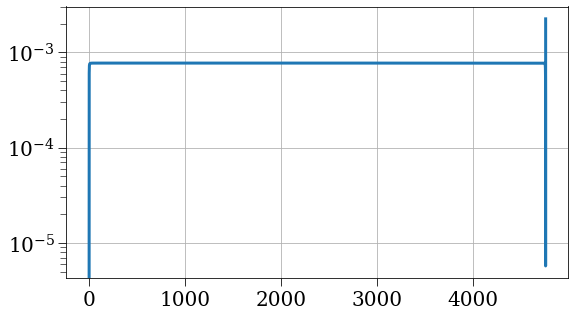

In [18]:
rho_r = results['rho_r']
m = results['m'][0, :]
tvals = results['t']
r_data = results['r']
shell_widths = np.zeros_like(r_data)
shell_vols = np.zeros_like(r_data)

# For each timestep
for t in range(len(tvals)):
    r_t = r_data[t]
    # Sort radii at this timestep
    sorted_indices = np.argsort(r_t)
    sorted_r = r_t[sorted_indices]
    
    # Calculate widths
    widths = np.zeros_like(sorted_r)
    # For lowest shell, use distance to r_min
    widths[0] = sorted_r[0] - sc.r_min
    # For other shells, use distance to next lower shell
    widths[1:] = sorted_r[1:] - sorted_r[:-1]
    
    # Calculate shell volumes
    vols = 4/3 * np.pi * (sorted_r**3 - (sorted_r - widths)**3)
    
    # Put widths and shell volumes back in original order
    shell_widths[t, sorted_indices] = widths
    shell_vols[t, sorted_indices] = vols

calced_rho_r = m / shell_vols
plt.plot(tvals, np.abs(calced_rho_r-rho_r)/rho_r)
plt.yscale('log')

#### Aside: Time Step Size


### With a Hard Reflecting Core

Here's my fiducial routine for handling reflection:
1. Check which shells $j$ are such that $r_j < r_{min}$
2. For those shells, update $r_j \rightarrow 2 r_{min} - r_j$
3. For those shells, update $v_j \rightarrow -v_j$

In [19]:
# Numerical Solution
sc = SphericalCollapse(cycloid_reflect_config1)

profile = True
if profile:
    # Profile the run method
    profiler = cProfile.Profile()
    profiler.enable()
    results = sc.run()
    profiler.disable()

    # Print the profiling results
    stats = pstats.Stats(profiler).sort_stats('cumulative')
    stats.print_stats(20)  # Print top 20 time-consuming functions
else:
    results = sc.run()

NameError: name 'ShellDensityFactory' is not defined

In [18]:
plotter = SimulationPlotter(results, sc)

# Configuration 1: Radius analysis
plotter.plot_radius_analysis()

# Configuration 2: Velocity and acceleration analysis
plotter.plot_velocity_acceleration()

# Configuration 3: Mass, density, and timescales
plotter.plot_mass_density_timescales()

# Configuration 4: Energy analysis
plotter.plot_energy_analysis()

NameError: name 'results' is not defined

#### Shell Crossings

In [22]:
sc = SphericalCollapse(cycloid_reflect_config2)
results = sc.run()

2025-01-15 22:58:11,718 - collapse - INFO - Simulation setup complete


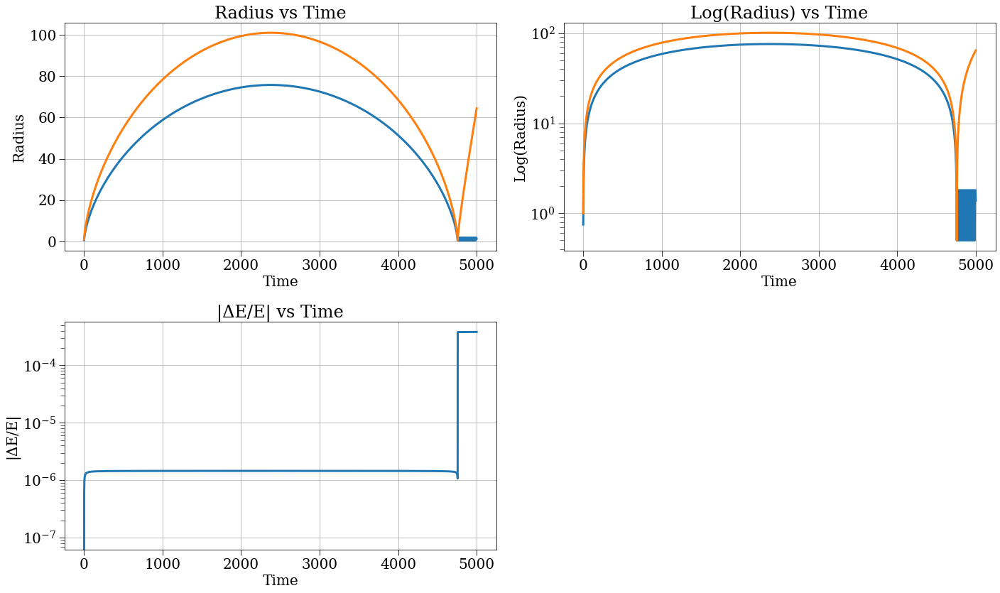

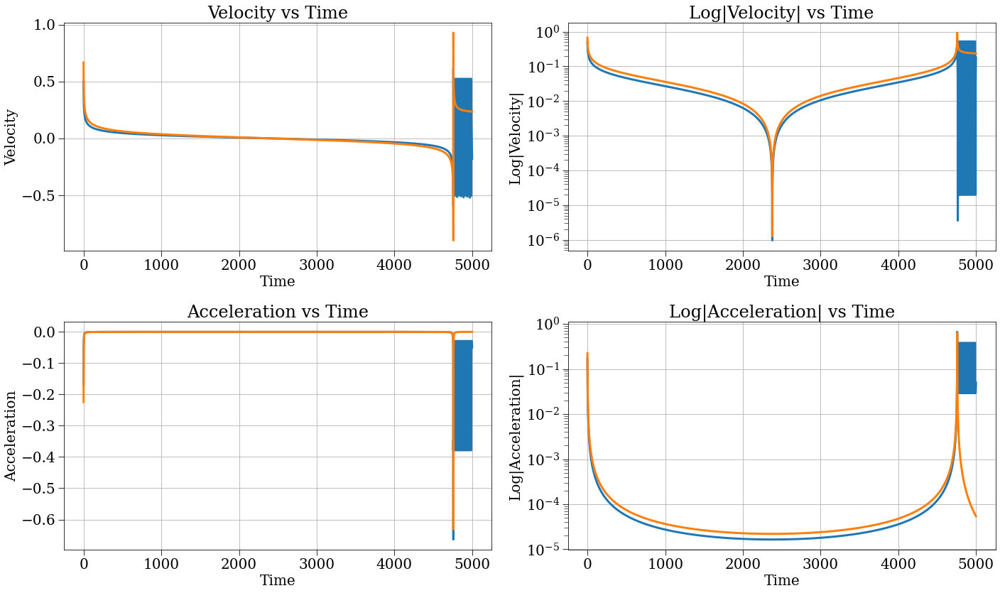

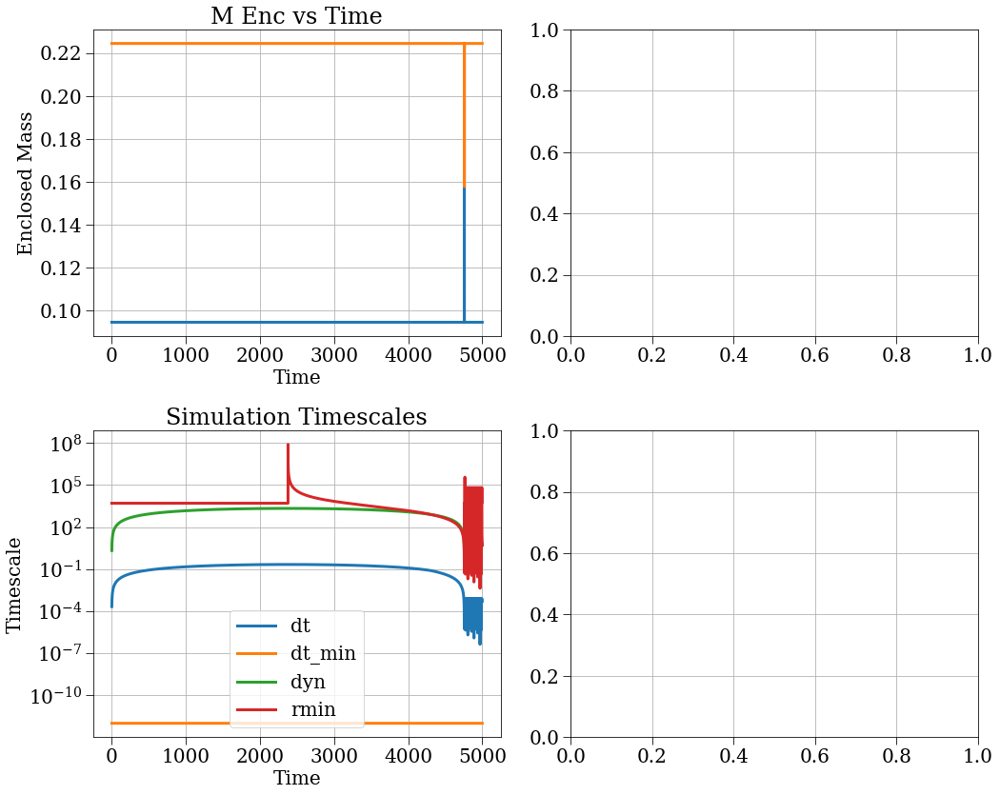

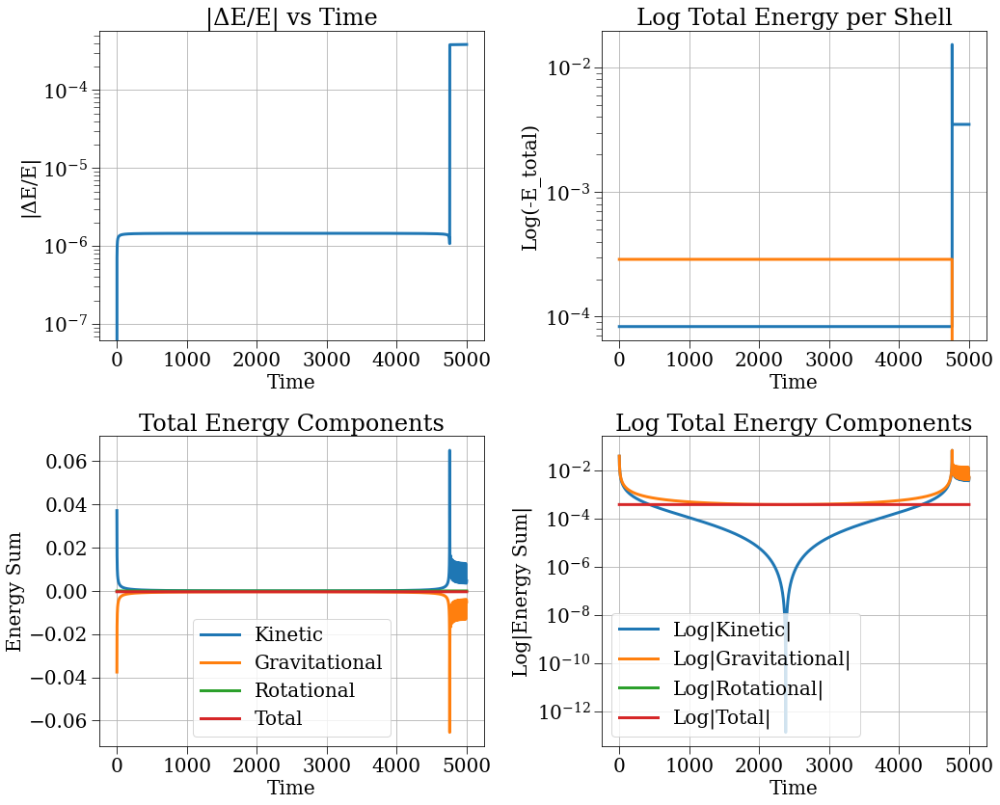

In [66]:
plotter = SimulationPlotter(results, sc)

# Configuration 1: Radius analysis
plotter.plot_radius_analysis()

# Configuration 2: Velocity and acceleration analysis
plotter.plot_velocity_acceleration()

# Configuration 3: Mass, density, and timescales
plotter.plot_mass_density_timescales()

# Configuration 4: Energy analysis
plotter.plot_energy_analysis()

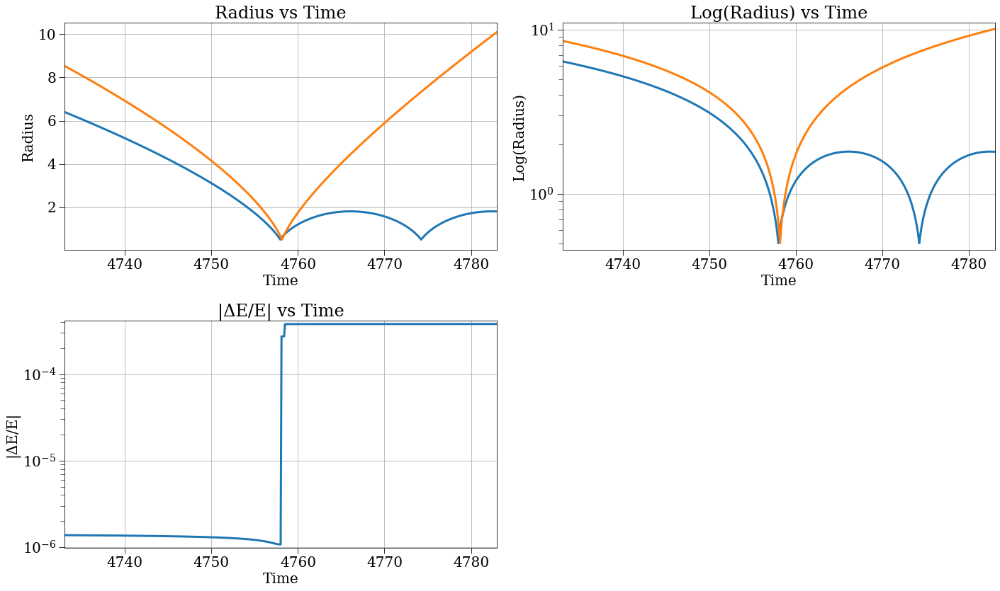

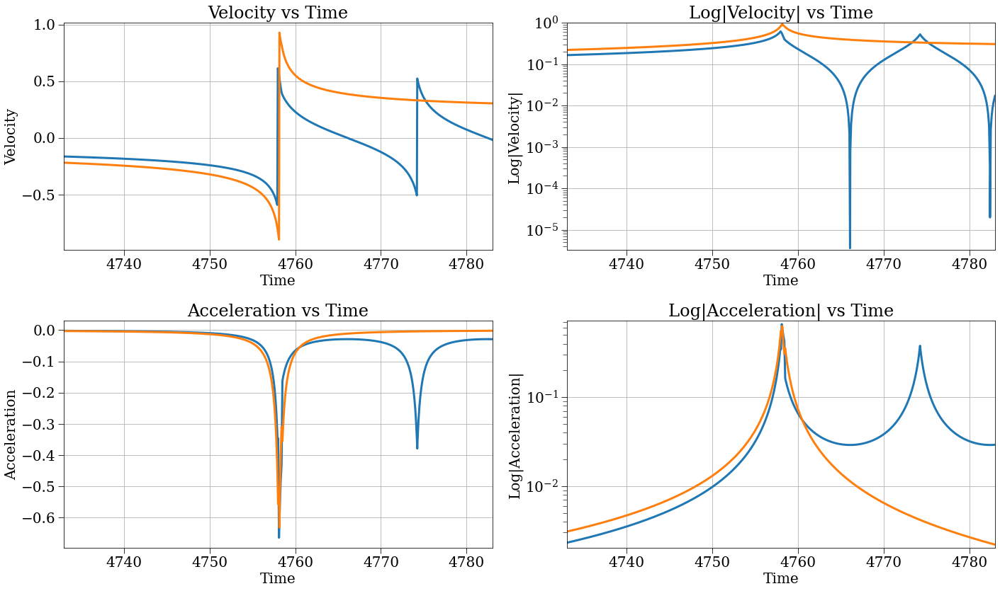

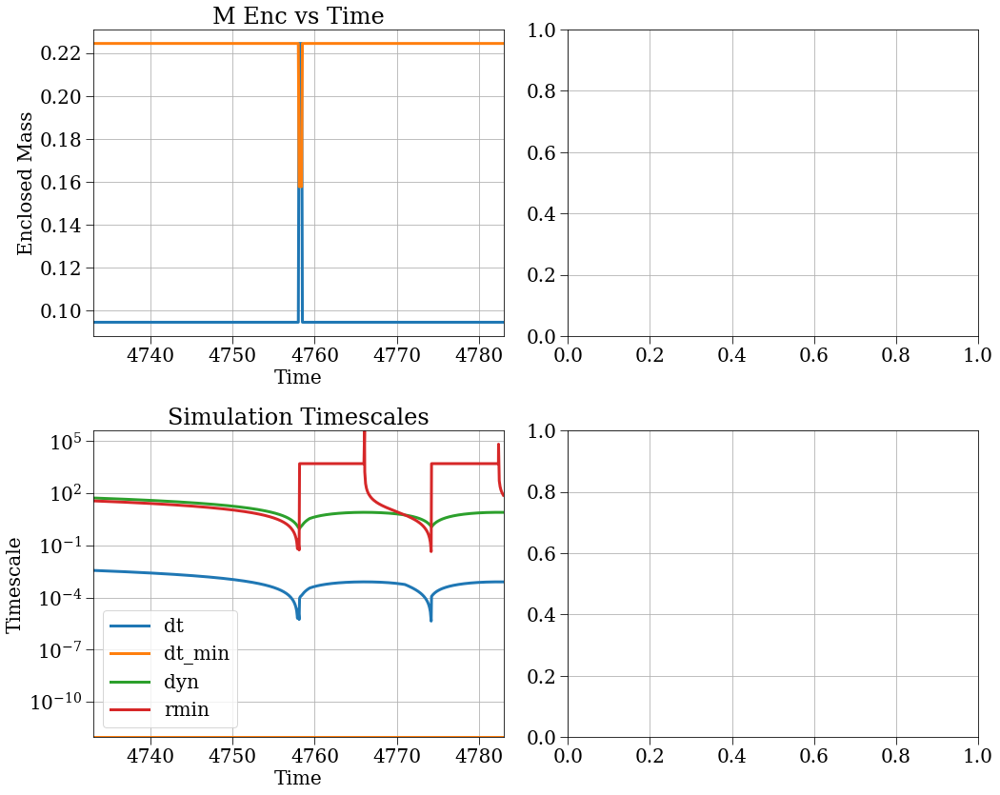

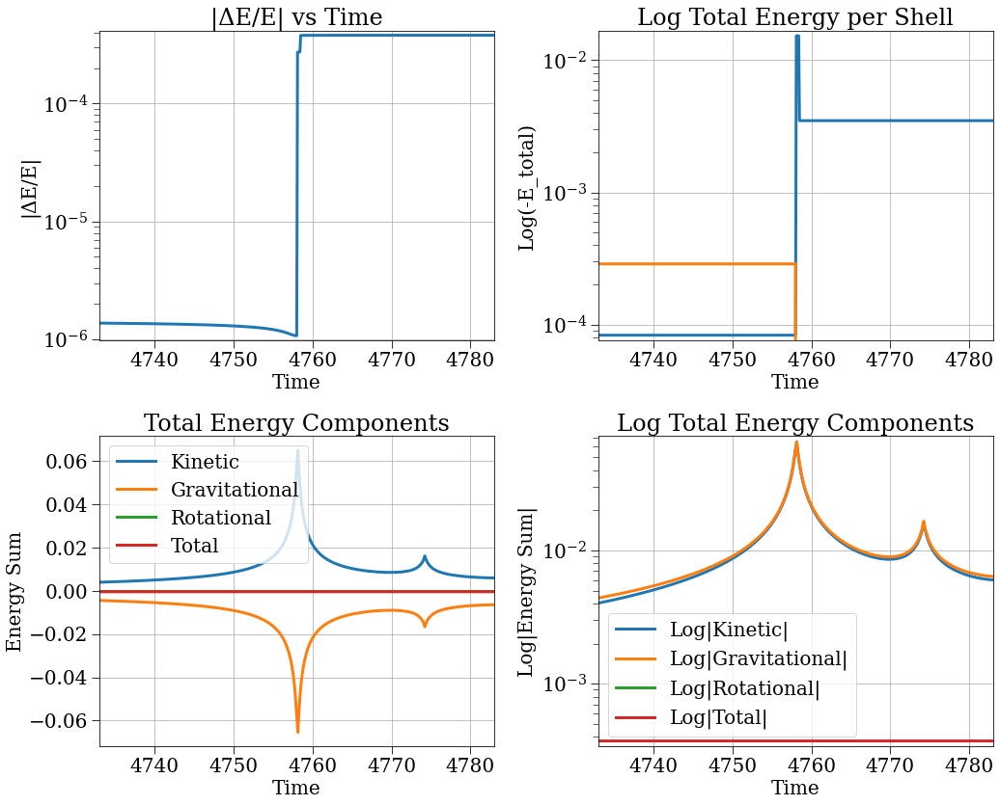

In [69]:
# Define the time window around t=4758
t_center = 4758
window = 25  # Adjust this value to control zoom level
t_min = t_center - window
t_max = t_center + window

# Add time window to all plots using a custom shell configuration
shell_config = PlotConfig(
    property_name='',
    xlim=(t_min, t_max)
)

# Generate all plots with the time window
plotter.plot_radius_analysis(shell_config)
plotter.plot_velocity_acceleration(shell_config)
plotter.plot_mass_density_timescales(shell_config)
plotter.plot_energy_analysis(shell_config)

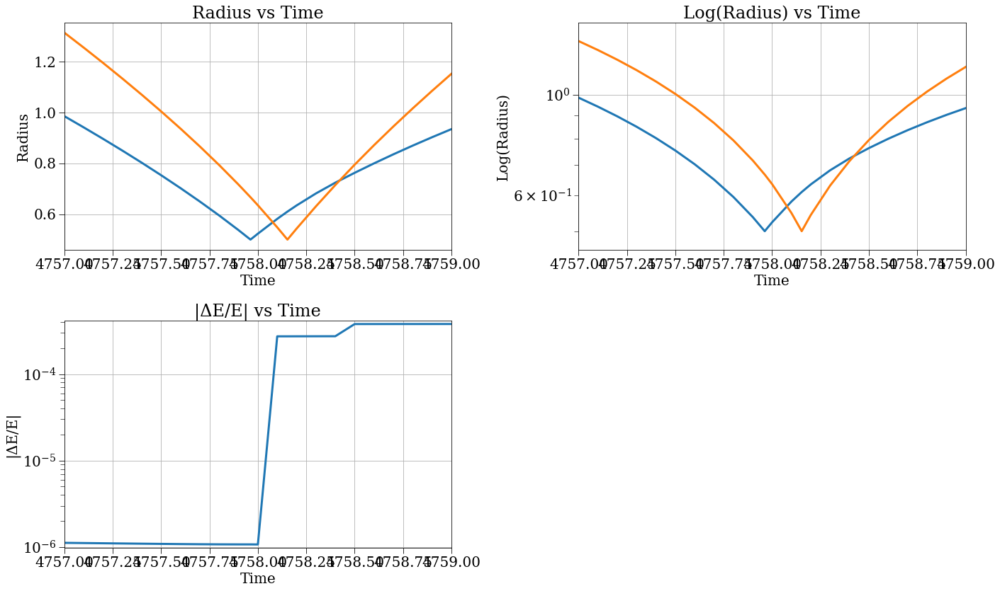

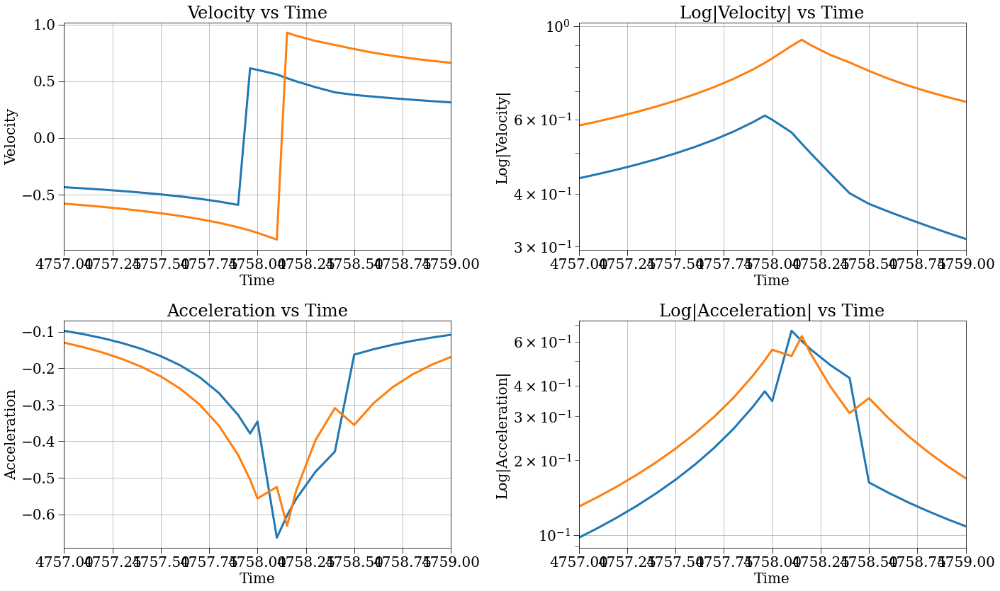

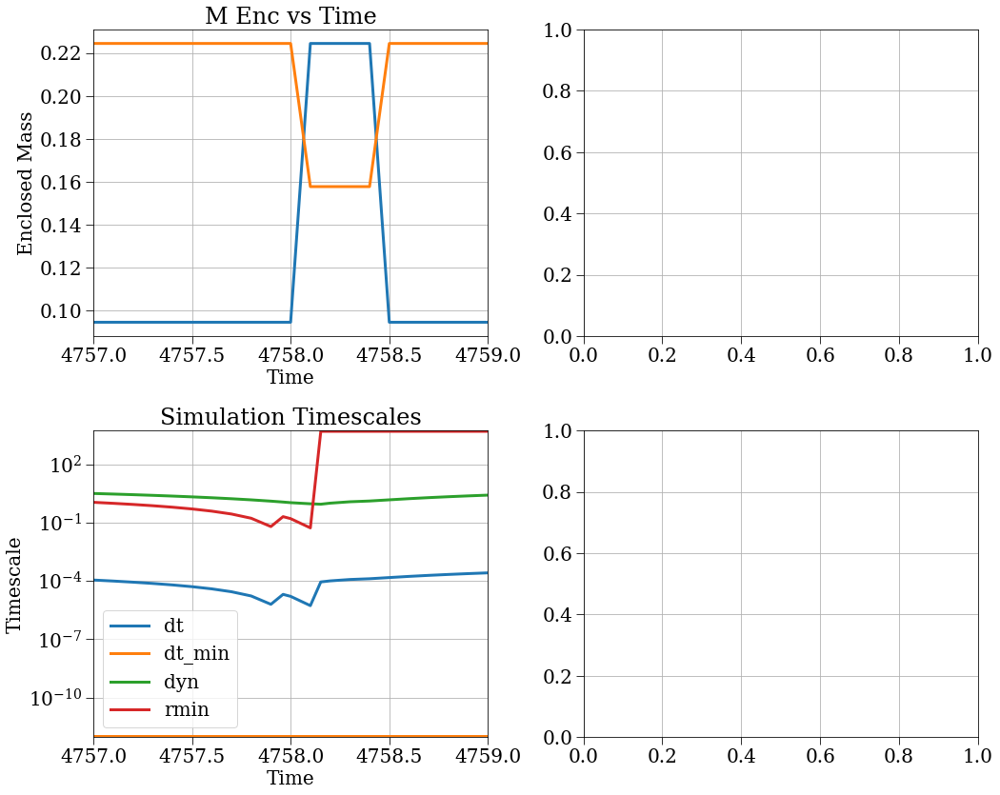

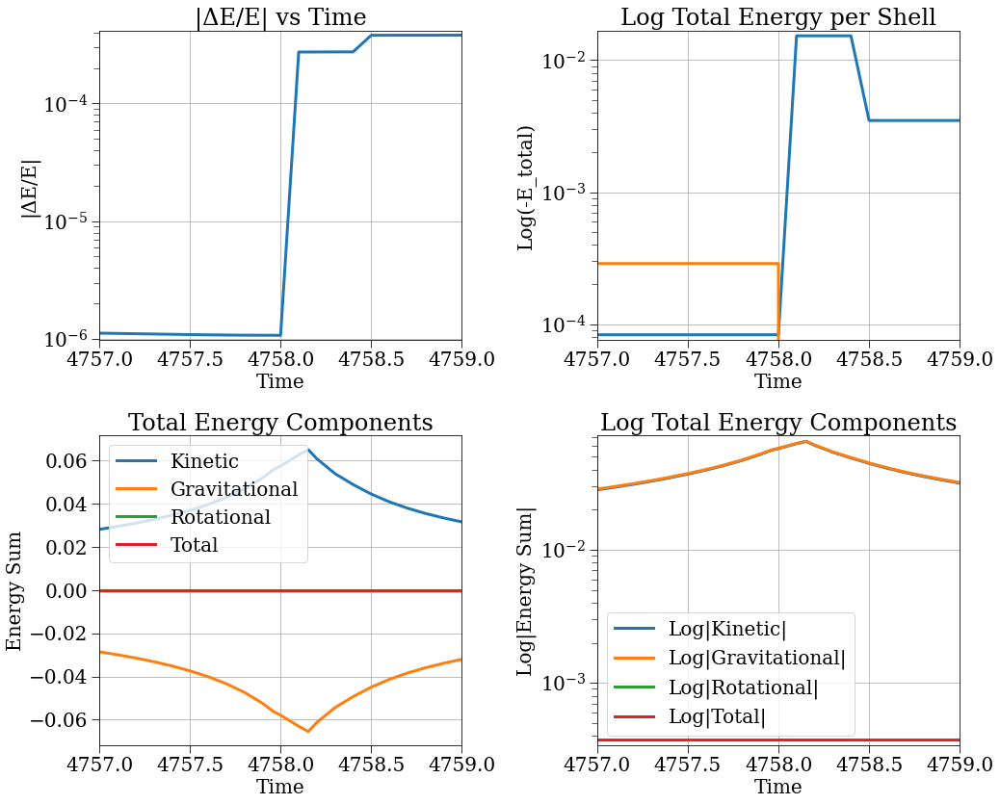

In [67]:
# Define the time window around t=4758
t_center = 4758
window = 1  # Adjust this value to control zoom level
t_min = t_center - window
t_max = t_center + window

# Add time window to all plots using a custom shell configuration
shell_config = PlotConfig(
    property_name='',
    xlim=(t_min, t_max)
)

# Generate all plots with the time window
plotter.plot_radius_analysis(shell_config)
plotter.plot_velocity_acceleration(shell_config)
plotter.plot_mass_density_timescales(shell_config)
plotter.plot_energy_analysis(shell_config)

#### Softening

2025-01-16 09:58:18,189 - collapse - INFO - Simulation setup complete


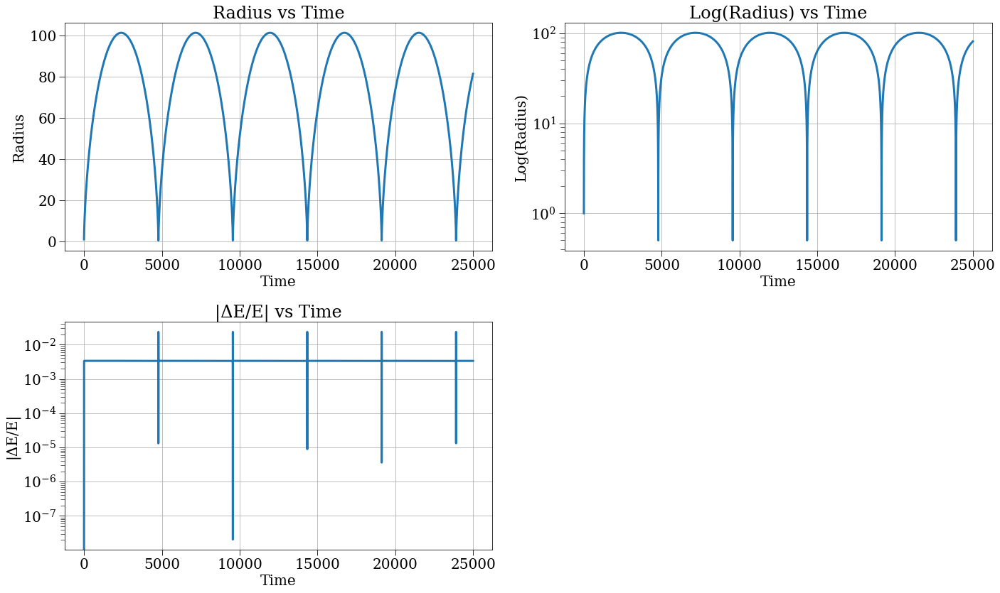

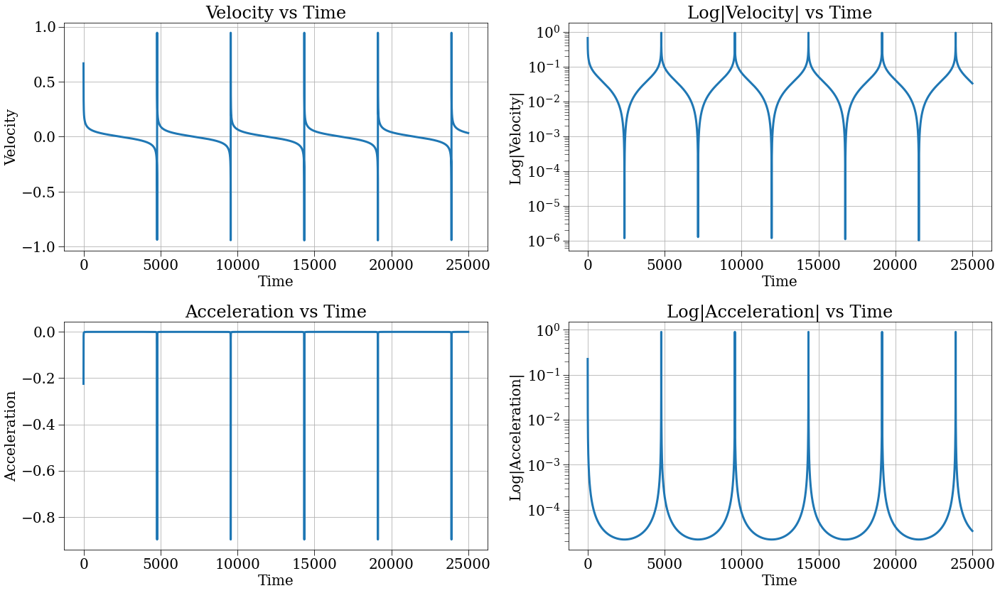

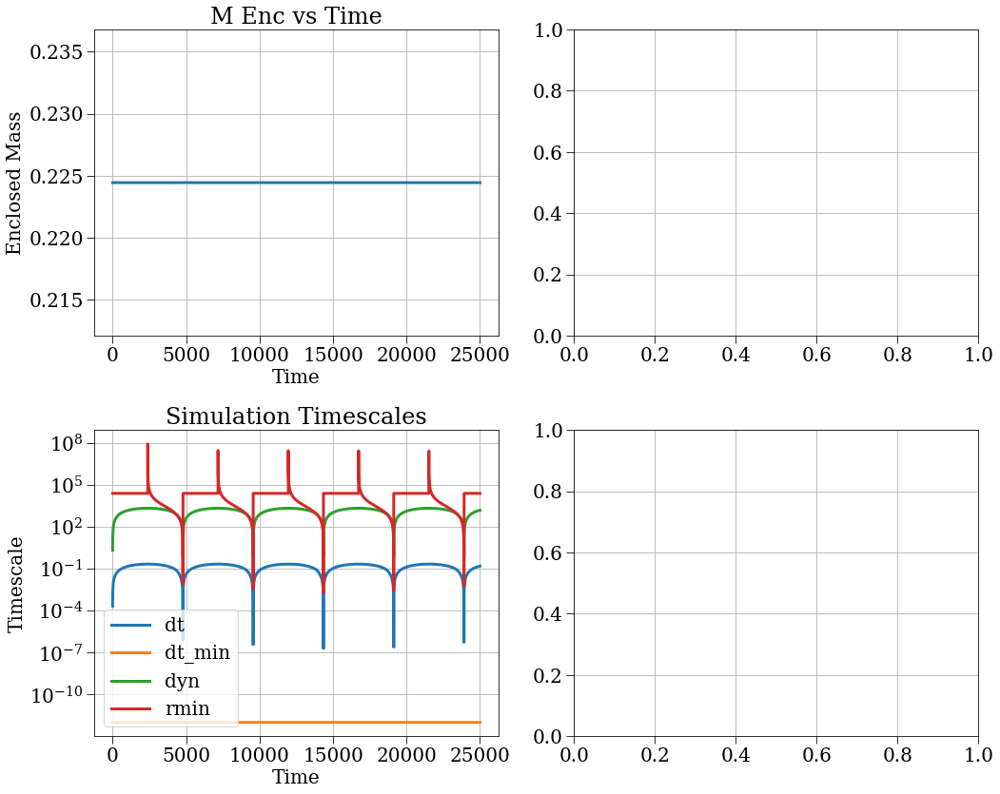

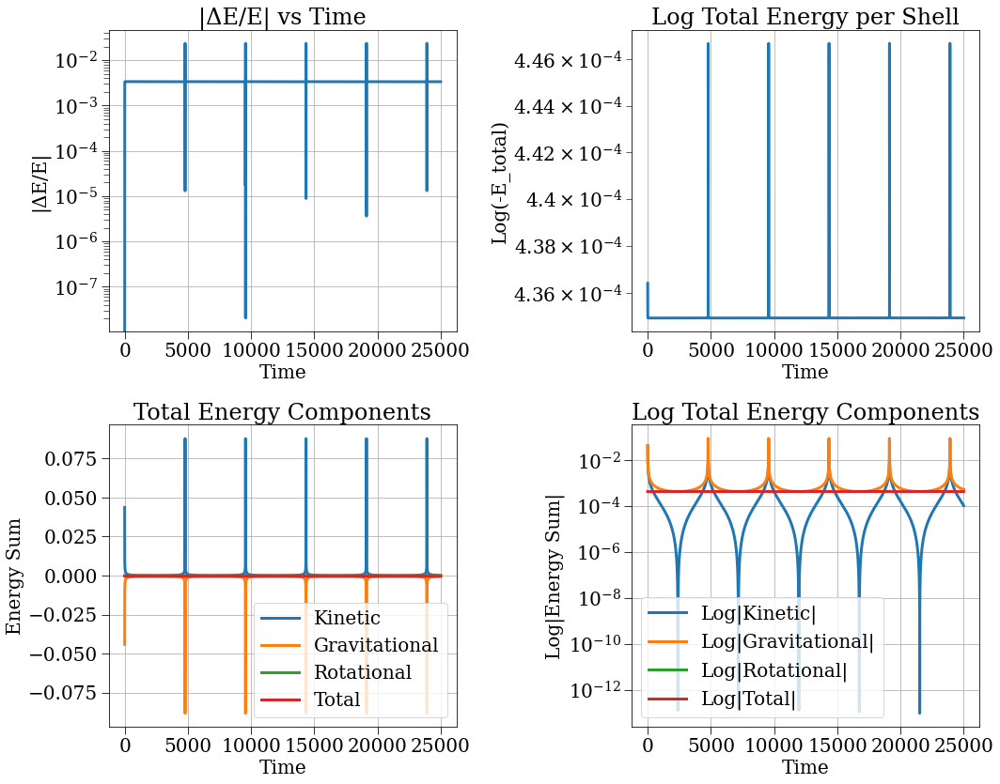

In [9]:
sc = SphericalCollapse(cycloid_reflect_config1_soft)
results = sc.run()
plotter = SimulationPlotter(results, sc)

# Configuration 1: Radius analysis
plotter.plot_radius_analysis()

# Configuration 2: Velocity and acceleration analysis
plotter.plot_velocity_acceleration()

# Configuration 3: Mass, density, and timescales
plotter.plot_mass_density_timescales()

# Configuration 4: Energy analysis
plotter.plot_energy_analysis()

2025-01-16 10:01:02,640 - collapse - INFO - Simulation setup complete


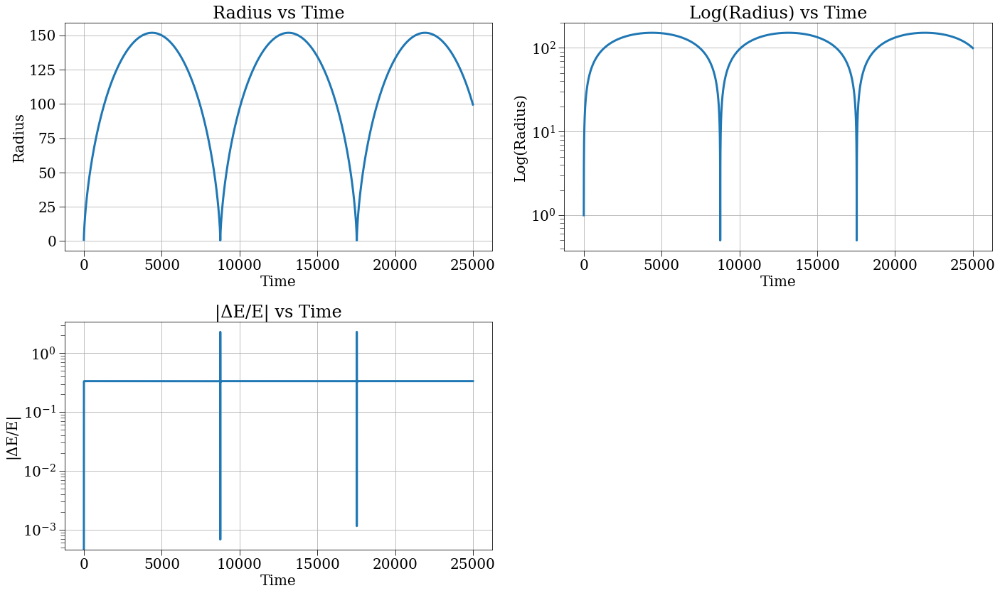

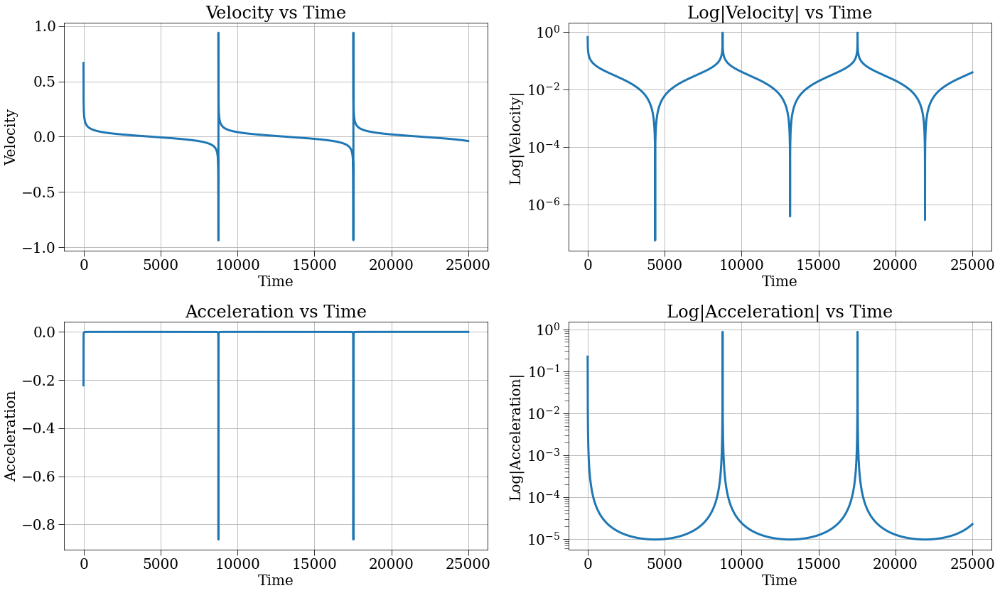

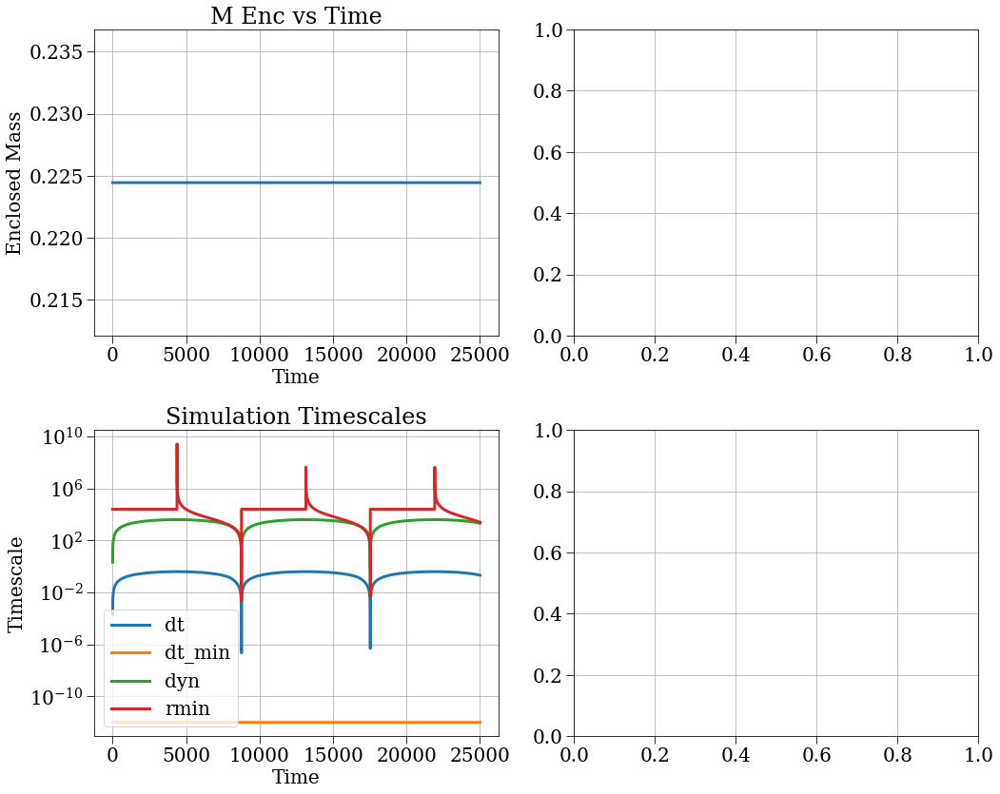

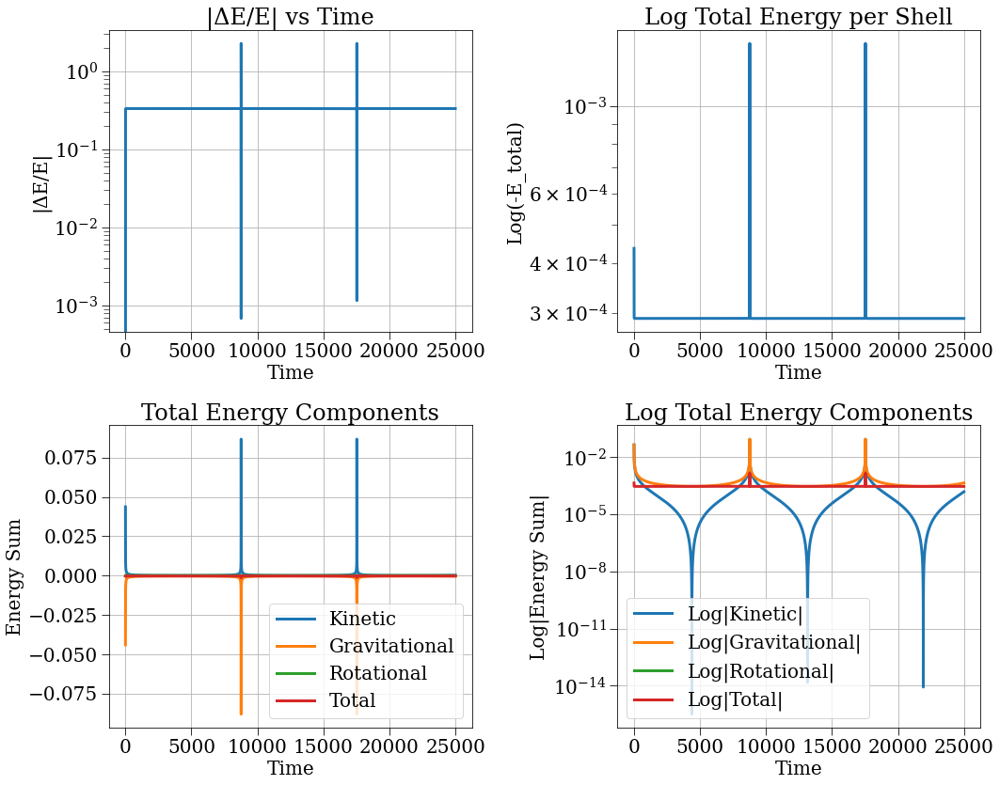

In [10]:
sc = SphericalCollapse(cycloid_reflect_config1_very_soft)
results = sc.run()
plotter = SimulationPlotter(results, sc)

# Configuration 1: Radius analysis
plotter.plot_radius_analysis()

# Configuration 2: Velocity and acceleration analysis
plotter.plot_velocity_acceleration()

# Configuration 3: Mass, density, and timescales
plotter.plot_mass_density_timescales()

# Configuration 4: Energy analysis
plotter.plot_energy_analysis()

2025-01-16 10:02:24,364 - collapse - INFO - Simulation setup complete


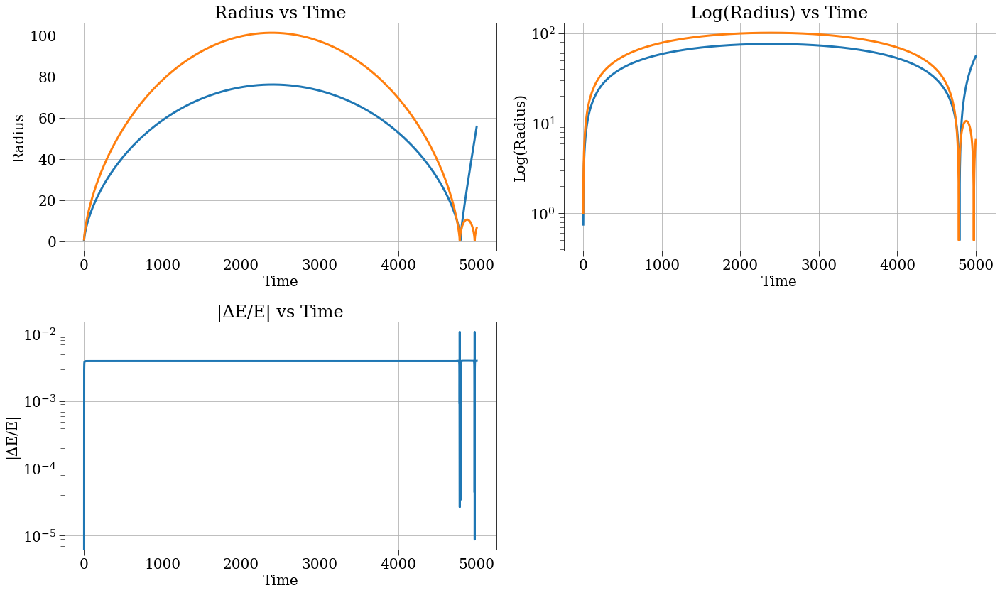

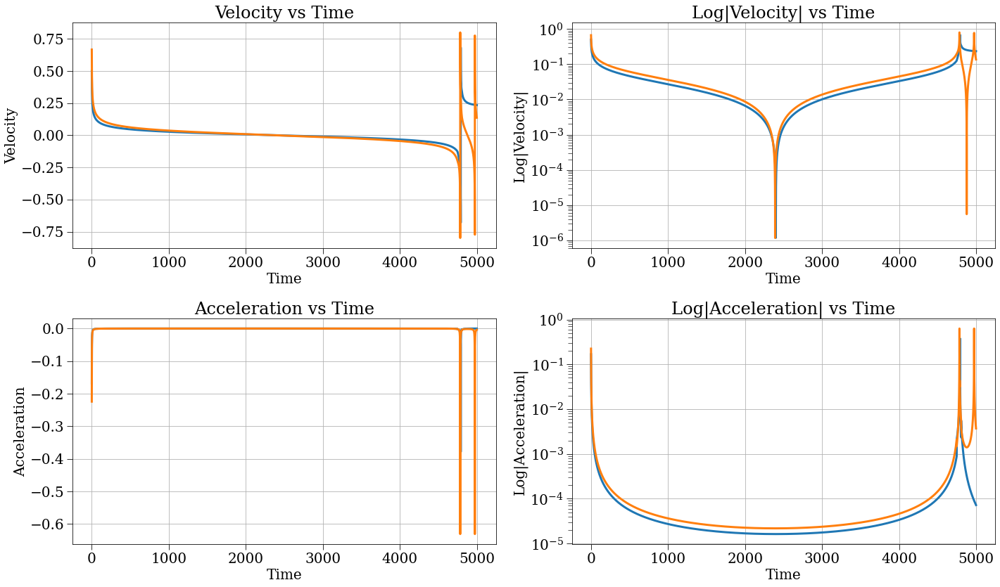

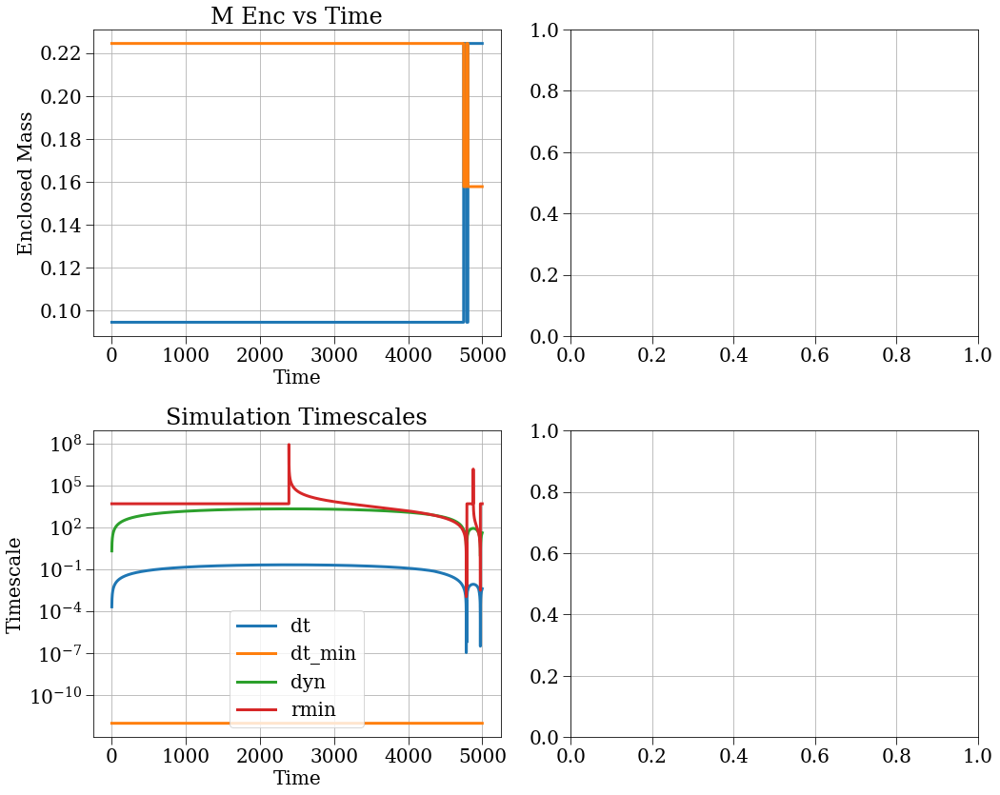

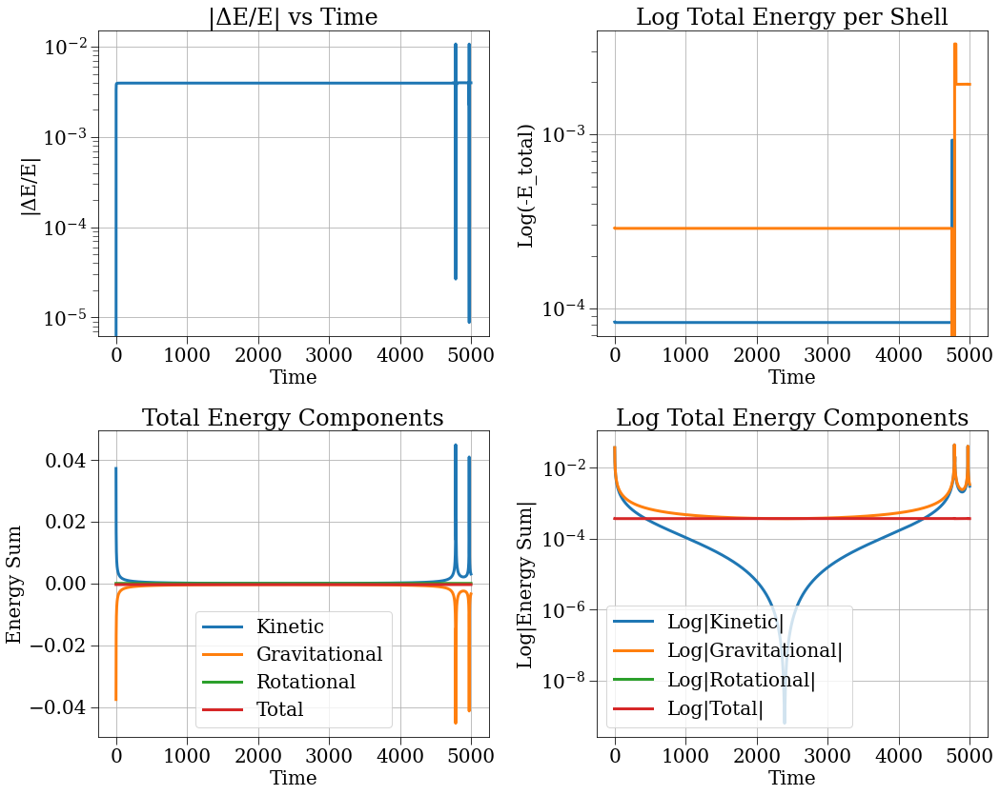

In [11]:
sc = SphericalCollapse(cycloid_reflect_config2_soft)
results = sc.run()
plotter = SimulationPlotter(results, sc)

# Configuration 1: Radius analysis
plotter.plot_radius_analysis()

# Configuration 2: Velocity and acceleration analysis
plotter.plot_velocity_acceleration()

# Configuration 3: Mass, density, and timescales
plotter.plot_mass_density_timescales()

# Configuration 4: Energy analysis
plotter.plot_energy_analysis()

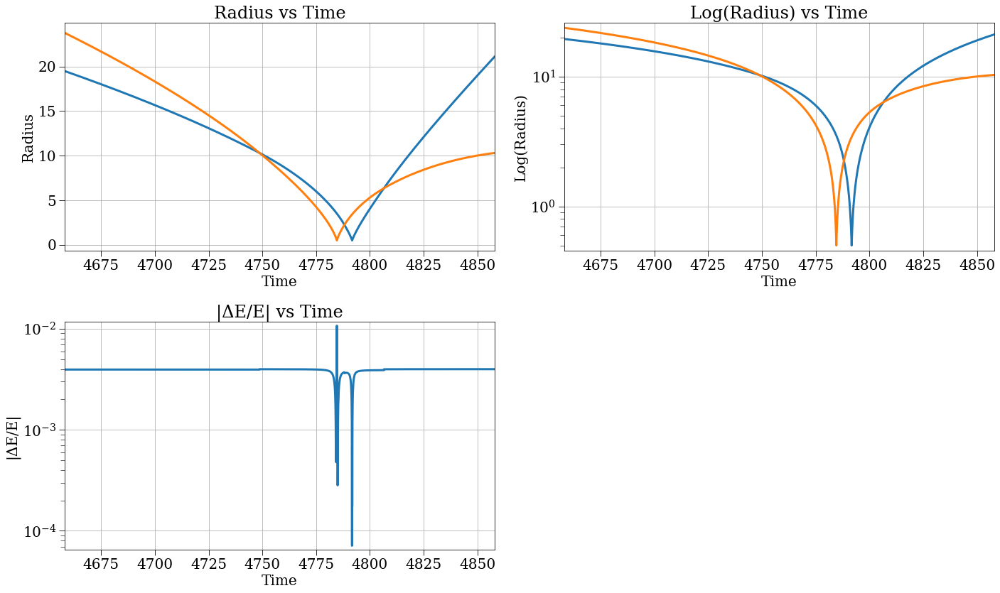

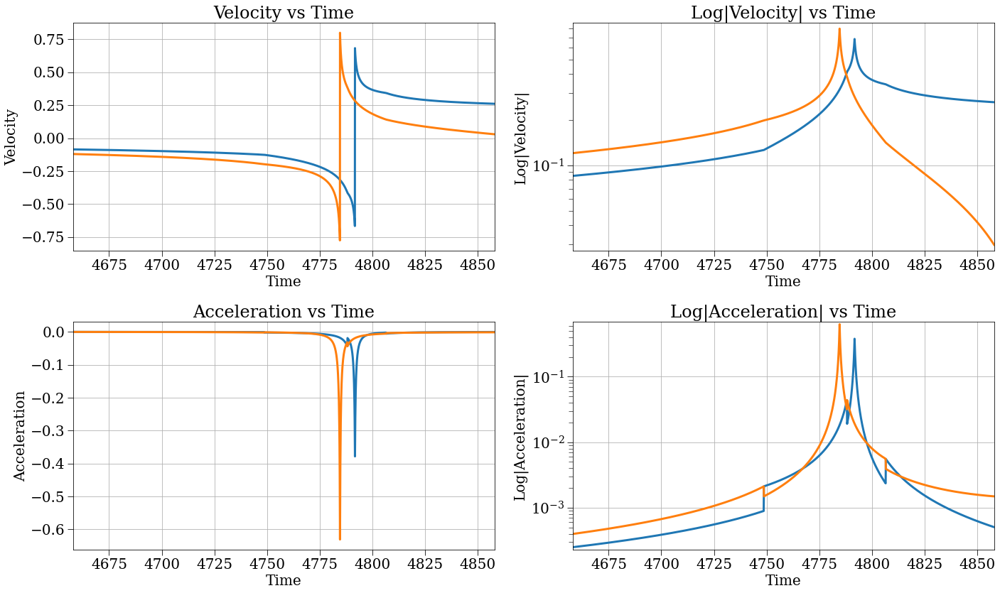

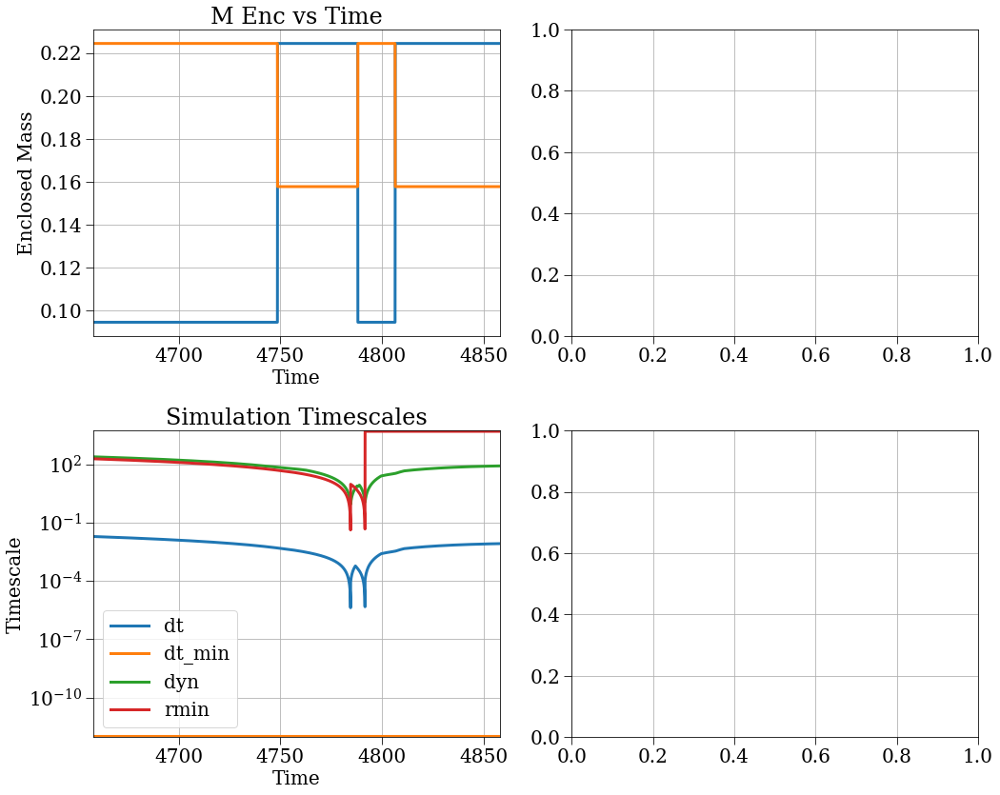

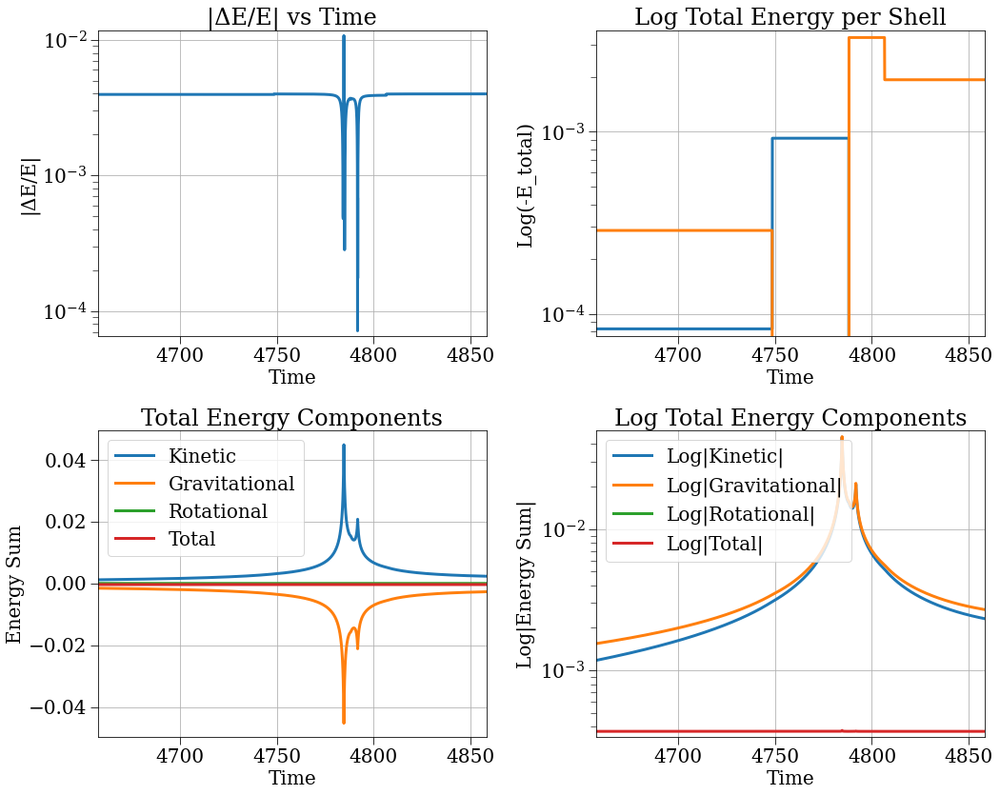

In [83]:
# Define the time window around t=4758
t_center = 4758
window = 100  # Adjust this value to control zoom level
t_min = t_center - window
t_max = t_center + window

# Add time window to all plots using a custom shell configuration
shell_config = PlotConfig(
    property_name='',
    xlim=(t_min, t_max)
)

# Generate all plots with the time window
plotter.plot_radius_analysis(shell_config)
plotter.plot_velocity_acceleration(shell_config)
plotter.plot_mass_density_timescales(shell_config)
plotter.plot_energy_analysis(shell_config)

2025-01-16 00:19:13,913 - collapse - INFO - Simulation setup complete


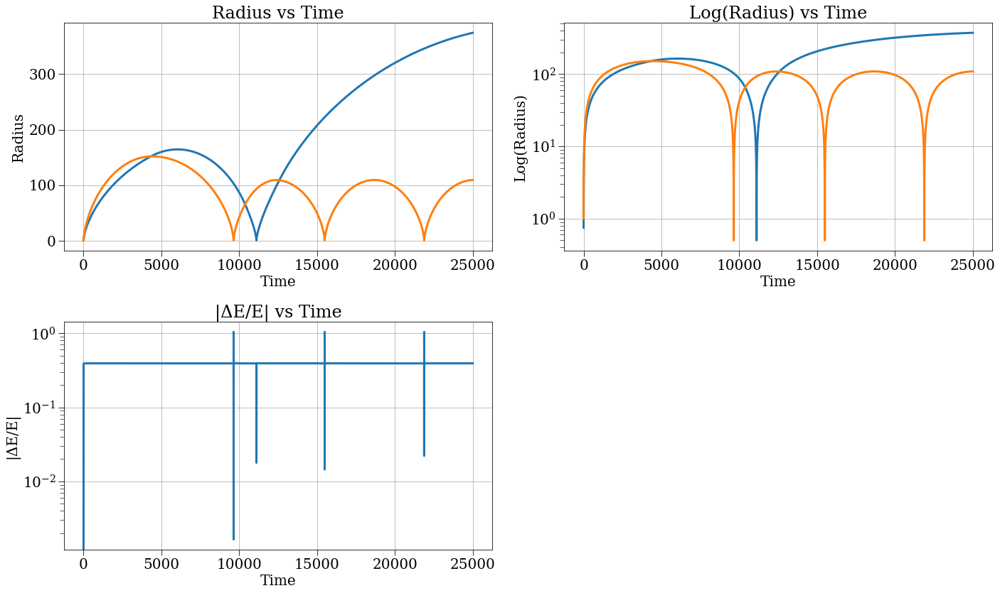

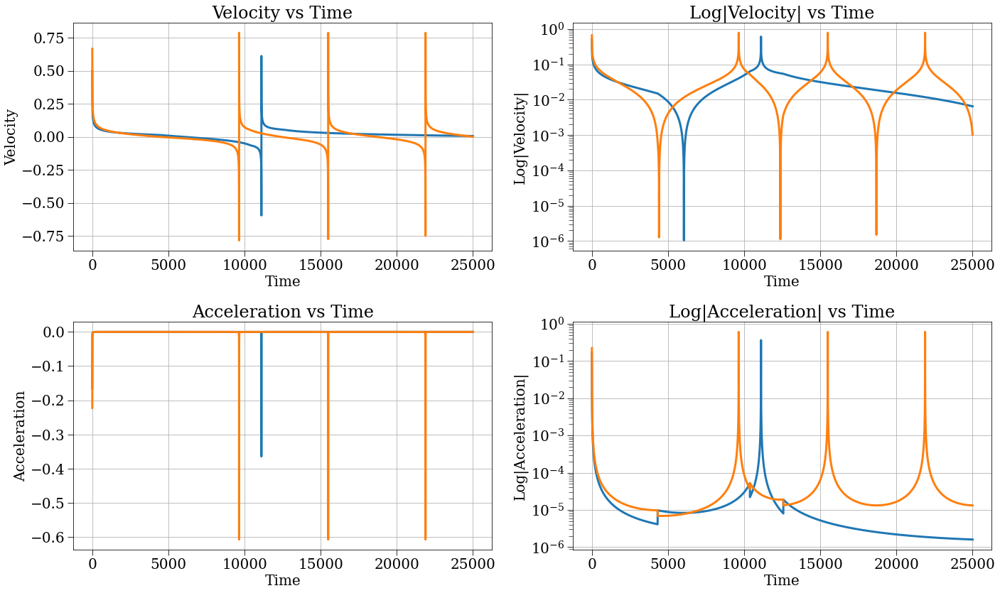

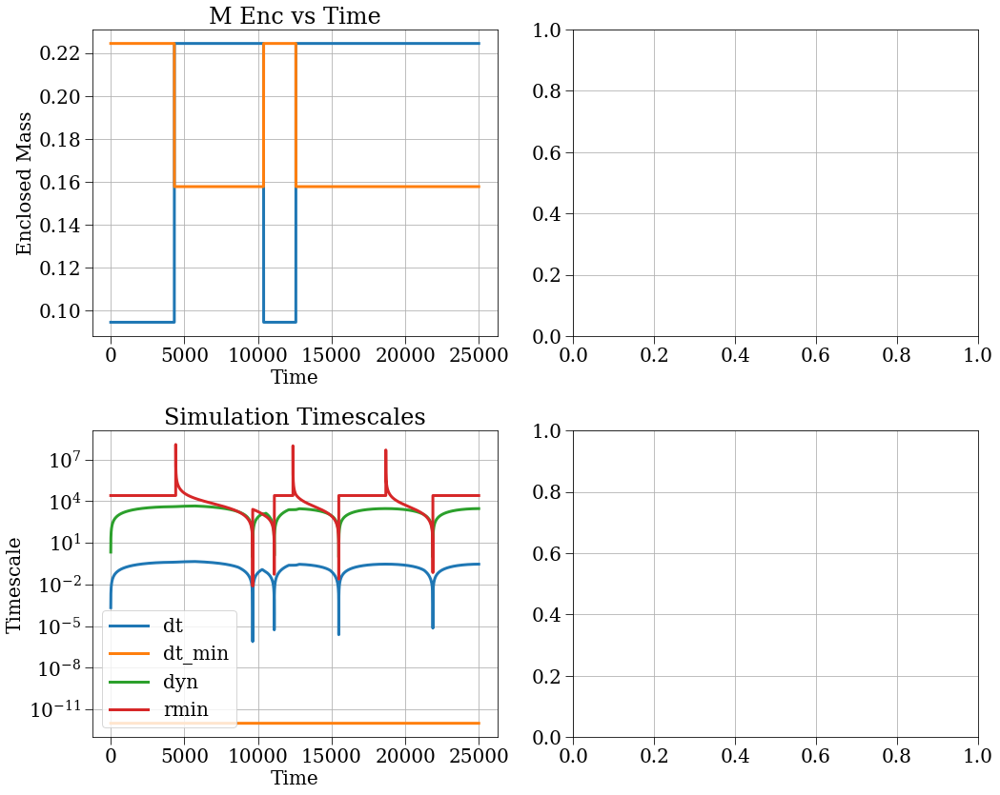

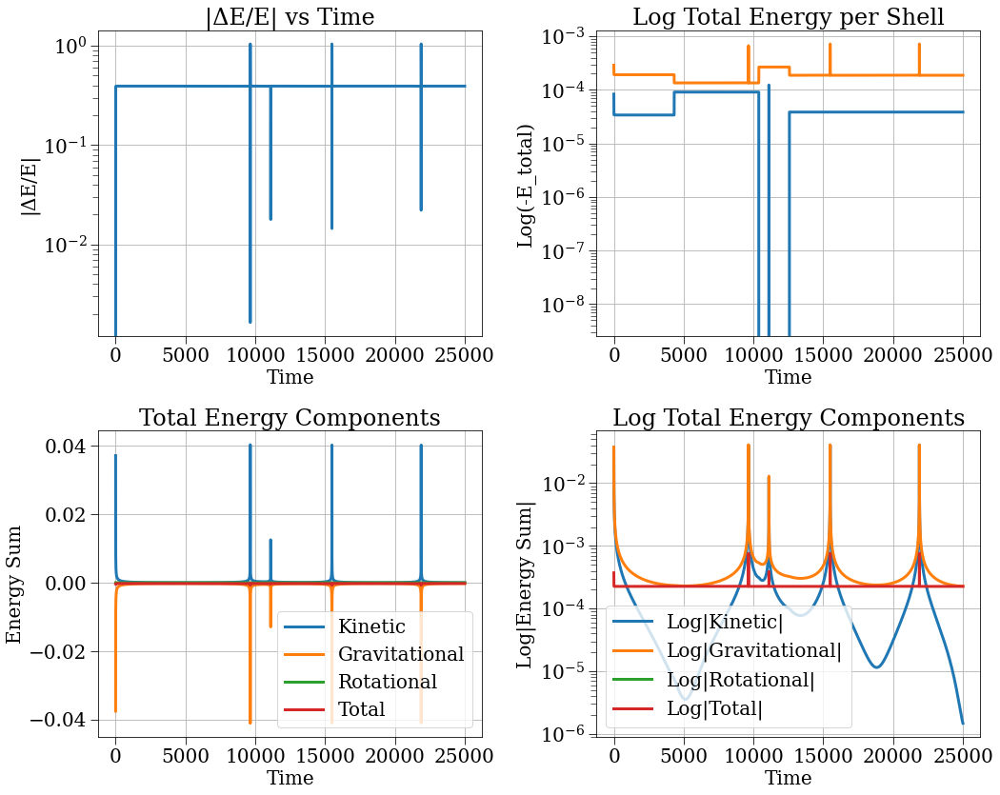

In [85]:
sc = SphericalCollapse(cycloid_reflect_config2_very_soft)
results = sc.run()
plotter = SimulationPlotter(results, sc)

# Configuration 1: Radius analysis
plotter.plot_radius_analysis()

# Configuration 2: Velocity and acceleration analysis
plotter.plot_velocity_acceleration()

# Configuration 3: Mass, density, and timescales
plotter.plot_mass_density_timescales()

# Configuration 4: Energy analysis
plotter.plot_energy_analysis()

#### Thickness

2025-01-16 01:06:40,326 - collapse - INFO - Simulation setup complete


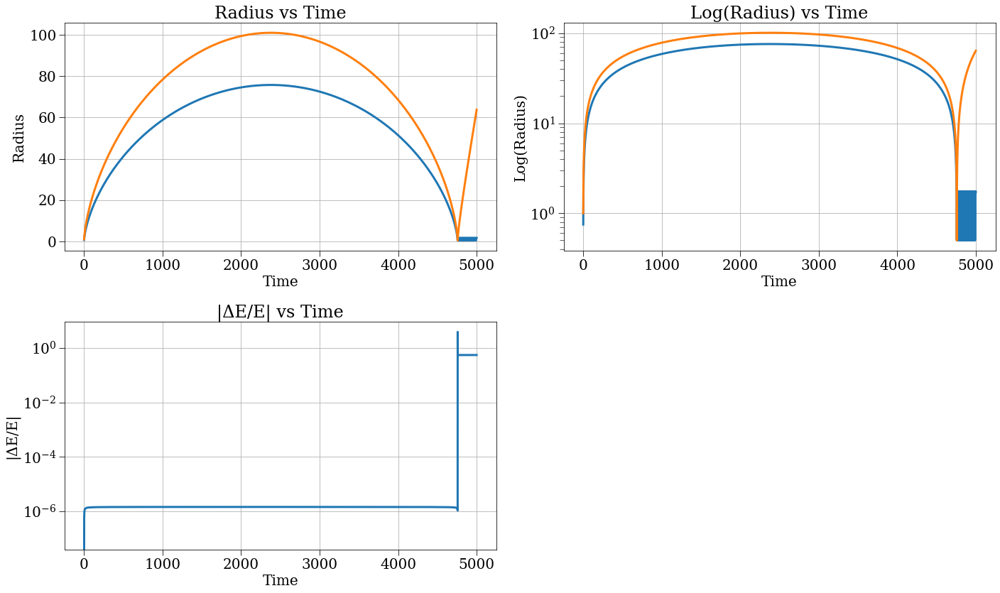

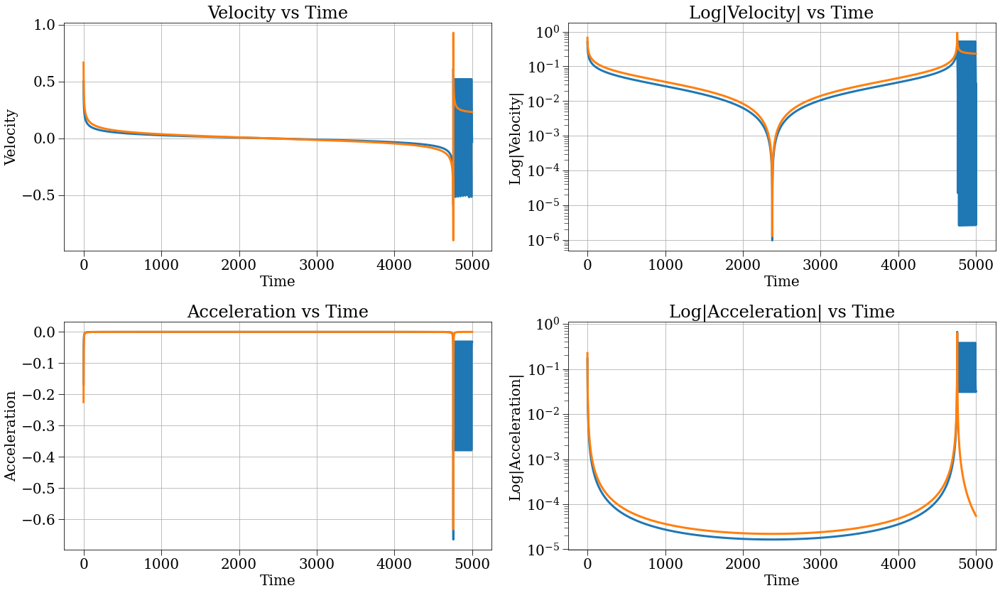

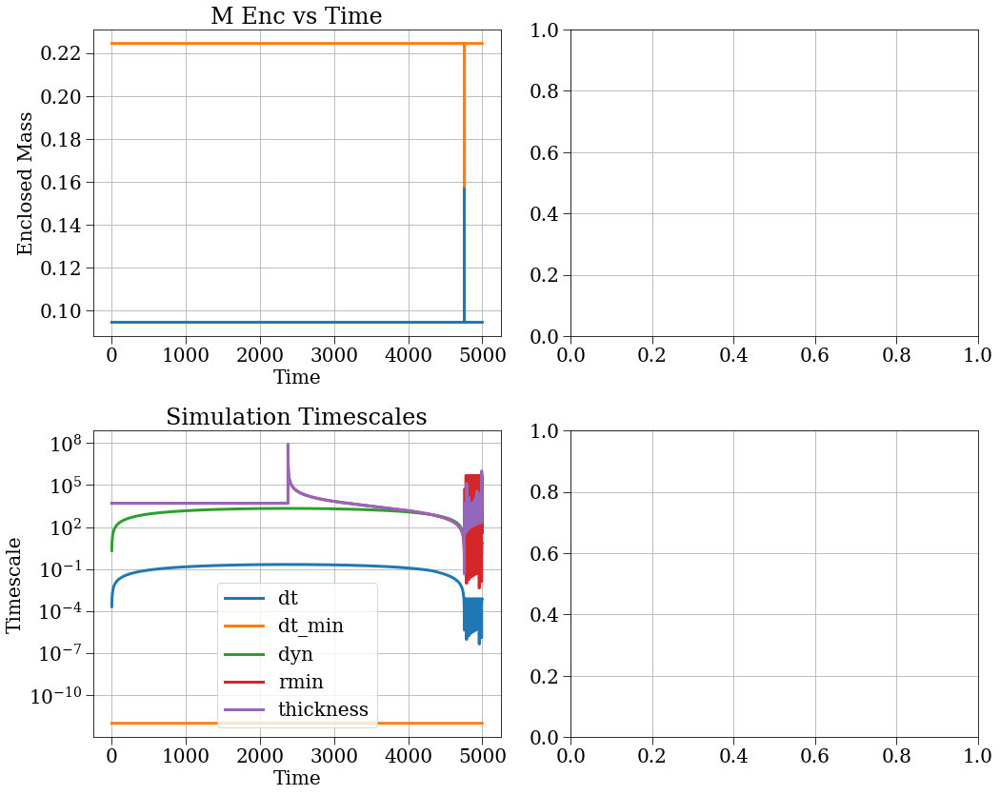

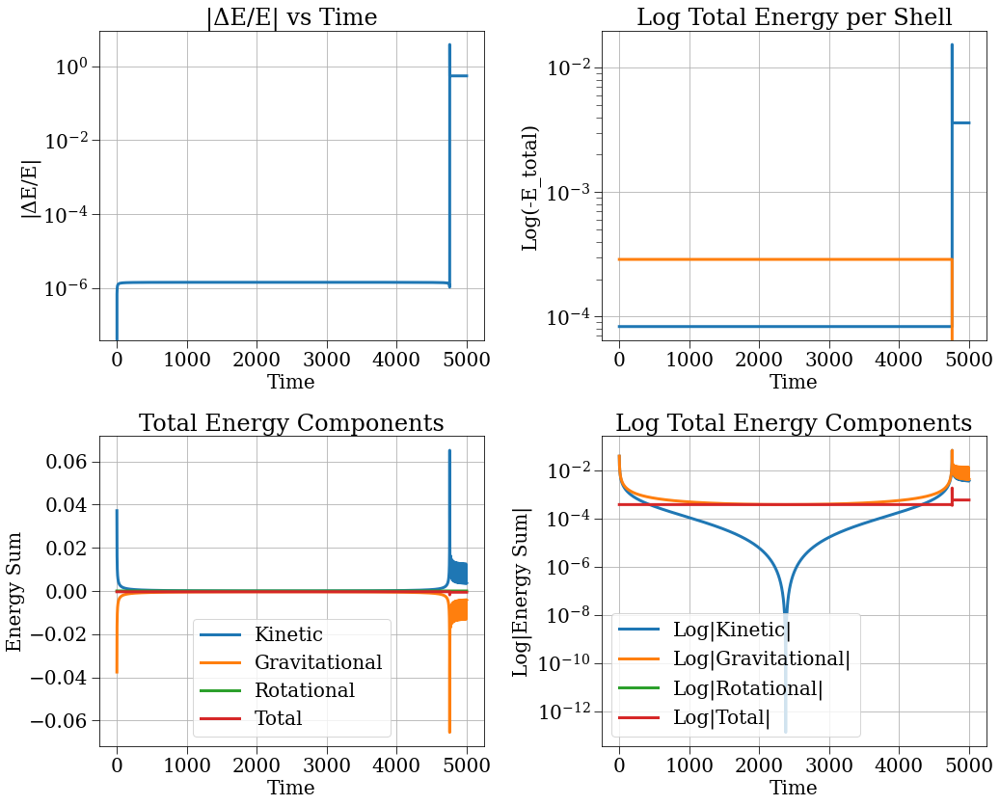

In [92]:
sc = SphericalCollapse(cycloid_reflect_config2_thick)
results = sc.run()
plotter = SimulationPlotter(results, sc)

# Configuration 1: Radius analysis
plotter.plot_radius_analysis()

# Configuration 2: Velocity and acceleration analysis
plotter.plot_velocity_acceleration()

# Configuration 3: Mass, density, and timescales
plotter.plot_mass_density_timescales()

# Configuration 4: Energy analysis
plotter.plot_energy_analysis()

In [ ]:
# Define the time window around t=4758
t_center = 4758
window = 1  # Adjust this value to control zoom level
t_min = t_center - window
t_max = t_center + window

# Add time window to all plots using a custom shell configuration
shell_config = PlotConfig(
    property_name='',
    xlim=(t_min, t_max)
)

# Generate all plots with the time window
plotter.plot_radius_analysis(shell_config)
plotter.plot_velocity_acceleration(shell_config)
plotter.plot_mass_density_timescales(shell_config)
plotter.plot_energy_analysis(shell_config)

2025-01-16 01:24:48,366 - collapse - INFO - Simulation setup complete


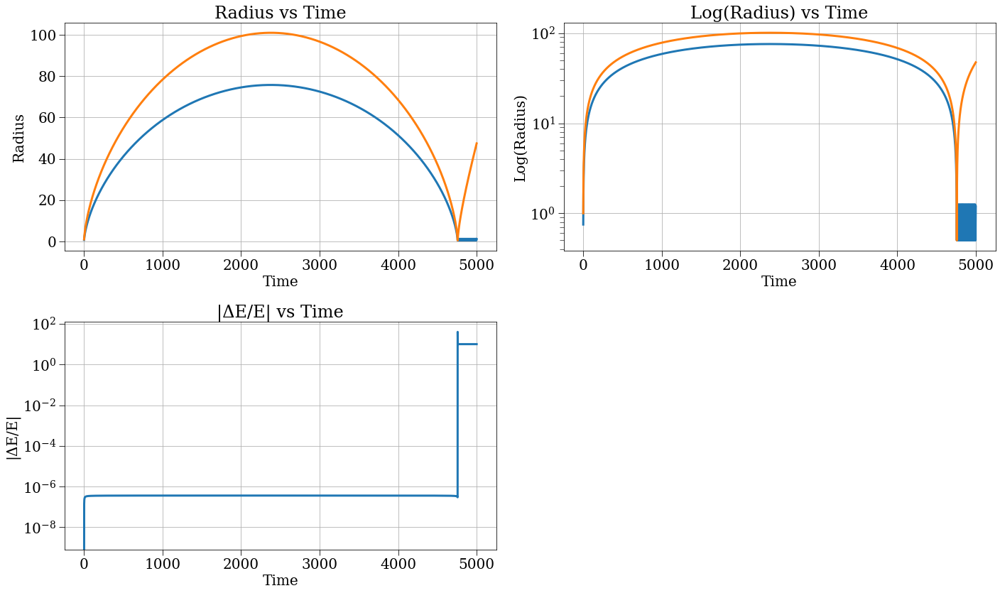

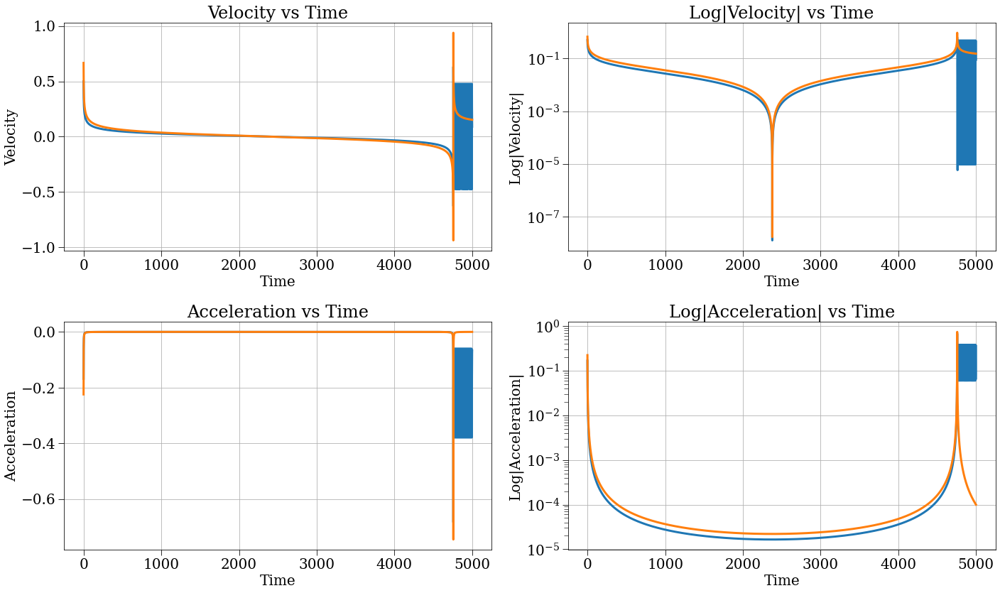

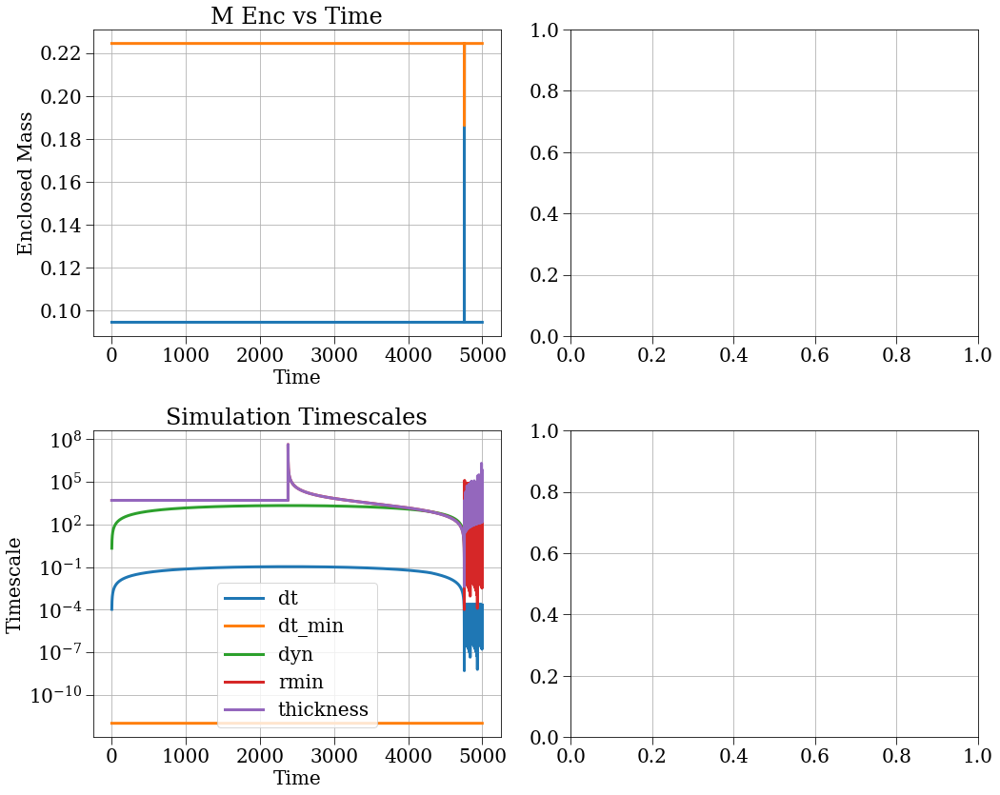

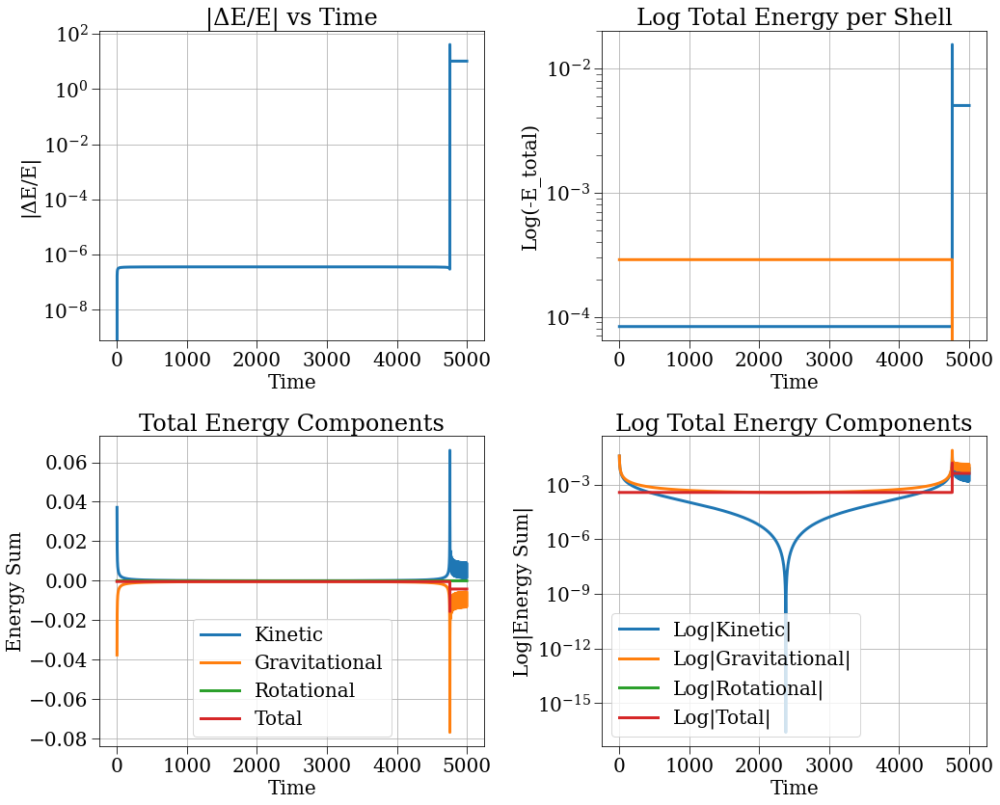

In [96]:
sc = SphericalCollapse(cycloid_reflect_config2_very_thick)
results = sc.run()
plotter = SimulationPlotter(results, sc)

# Configuration 1: Radius analysis
plotter.plot_radius_analysis()

# Configuration 2: Velocity and acceleration analysis
plotter.plot_velocity_acceleration()

# Configuration 3: Mass, density, and timescales
plotter.plot_mass_density_timescales()

# Configuration 4: Energy analysis
plotter.plot_energy_analysis()

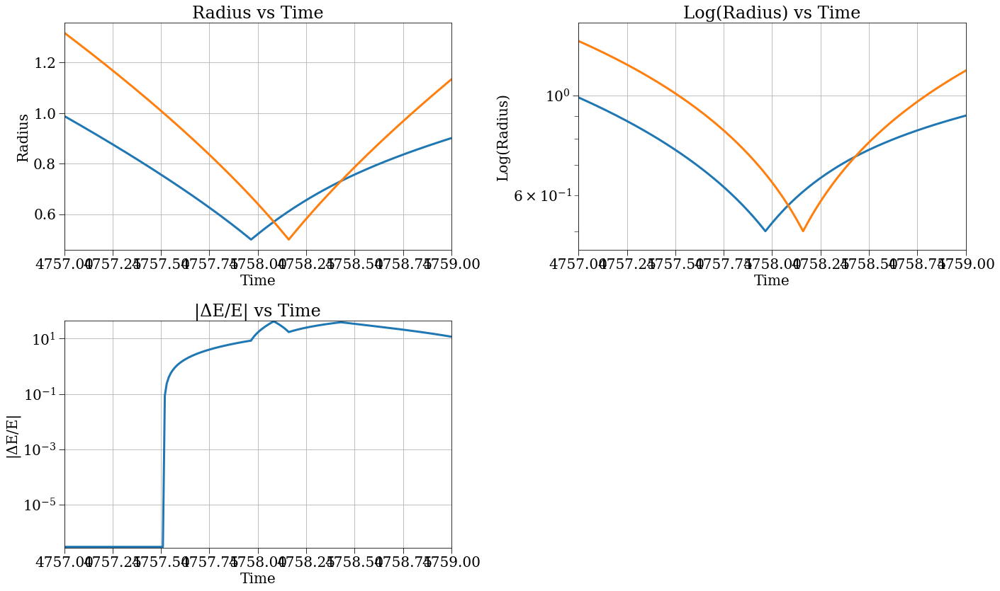

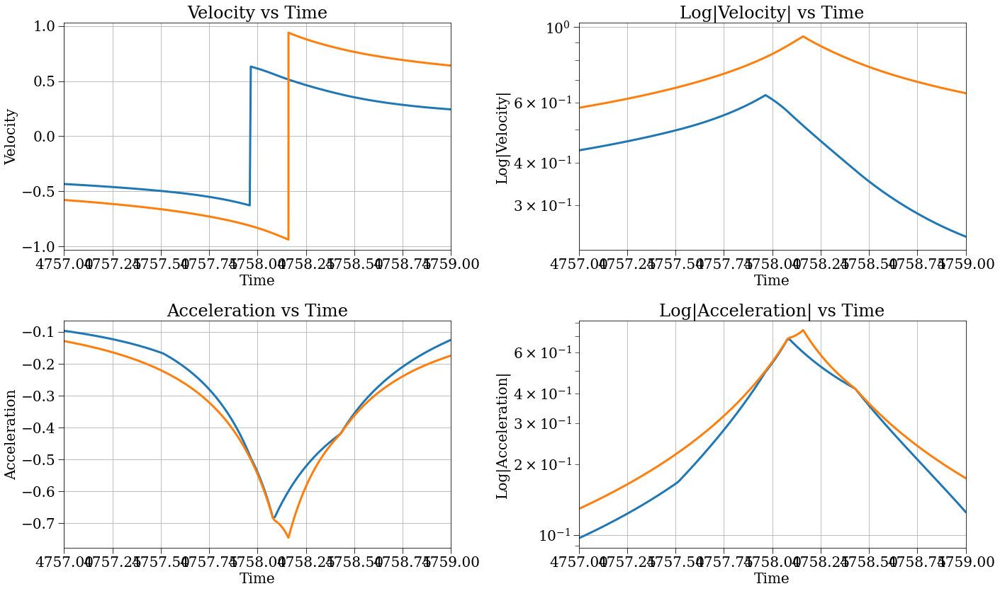

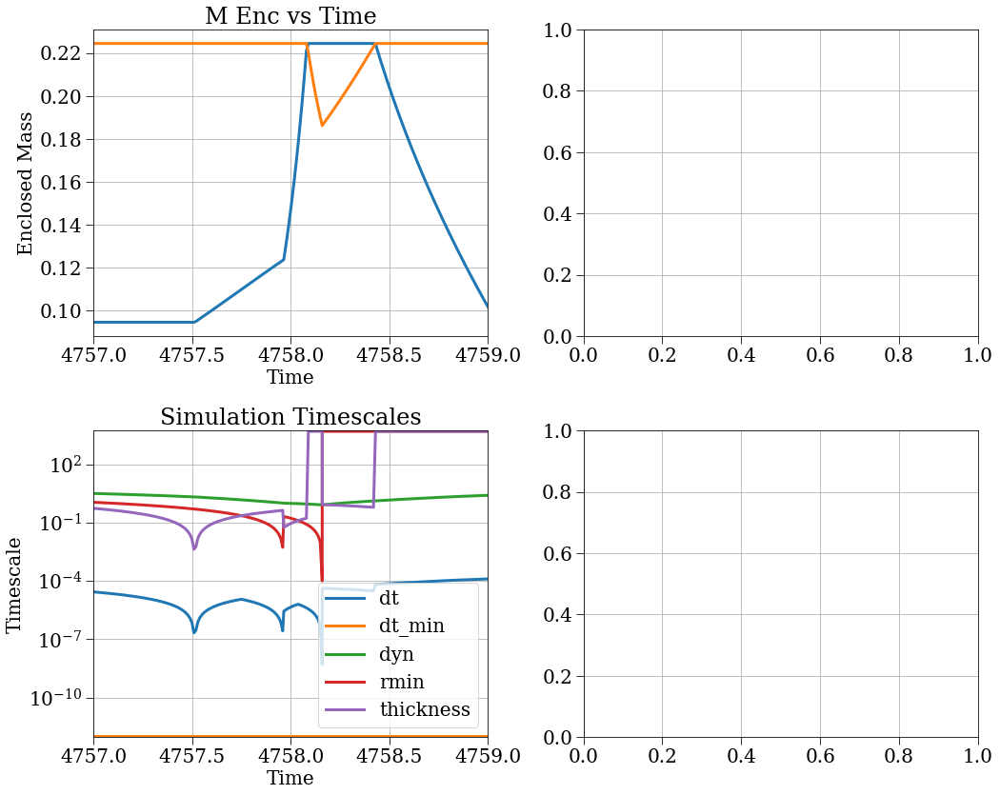

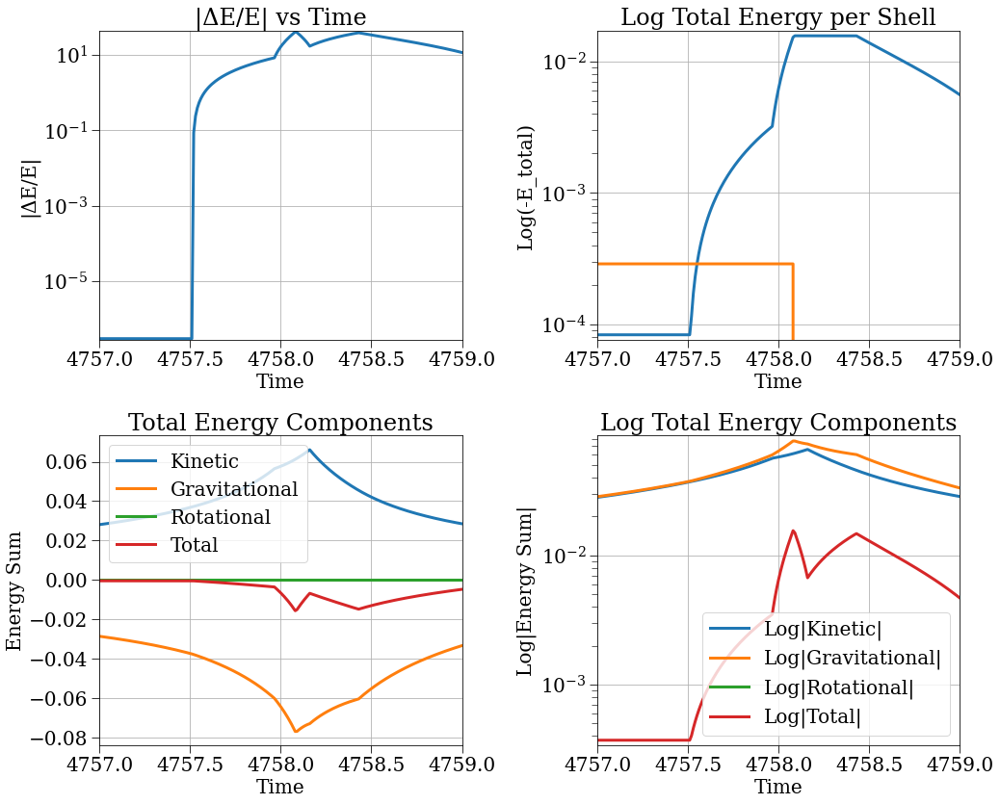

In [97]:
# Define the time window around t=4758
t_center = 4758
window = 1  # Adjust this value to control zoom level
t_min = t_center - window
t_max = t_center + window

# Add time window to all plots using a custom shell configuration
shell_config = PlotConfig(
    property_name='',
    xlim=(t_min, t_max)
)

# Generate all plots with the time window
plotter.plot_radius_analysis(shell_config)
plotter.plot_velocity_acceleration(shell_config)
plotter.plot_mass_density_timescales(shell_config)
plotter.plot_energy_analysis(shell_config)

2025-01-16 01:52:57,008 - collapse - INFO - Simulation setup complete


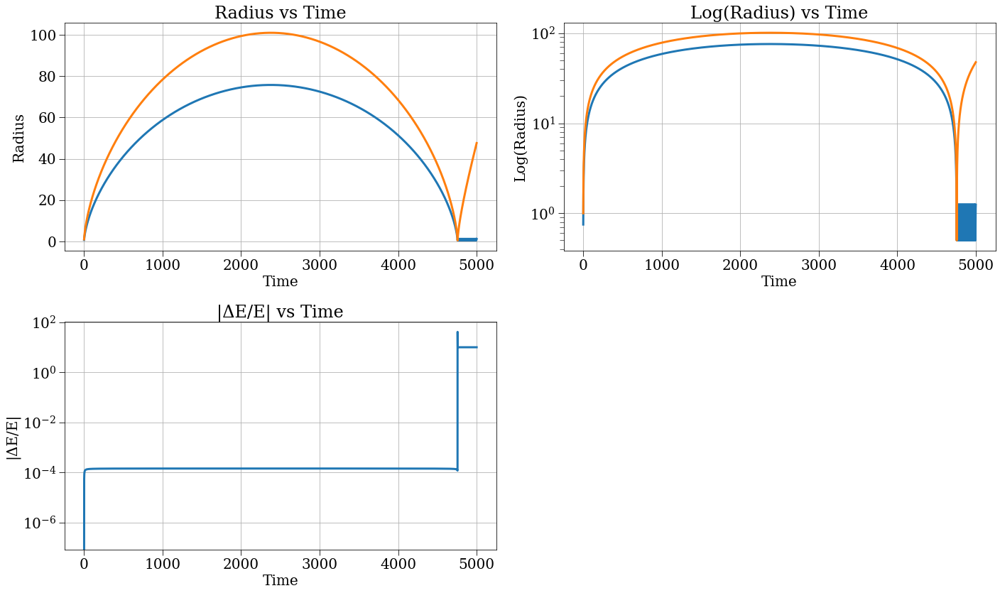

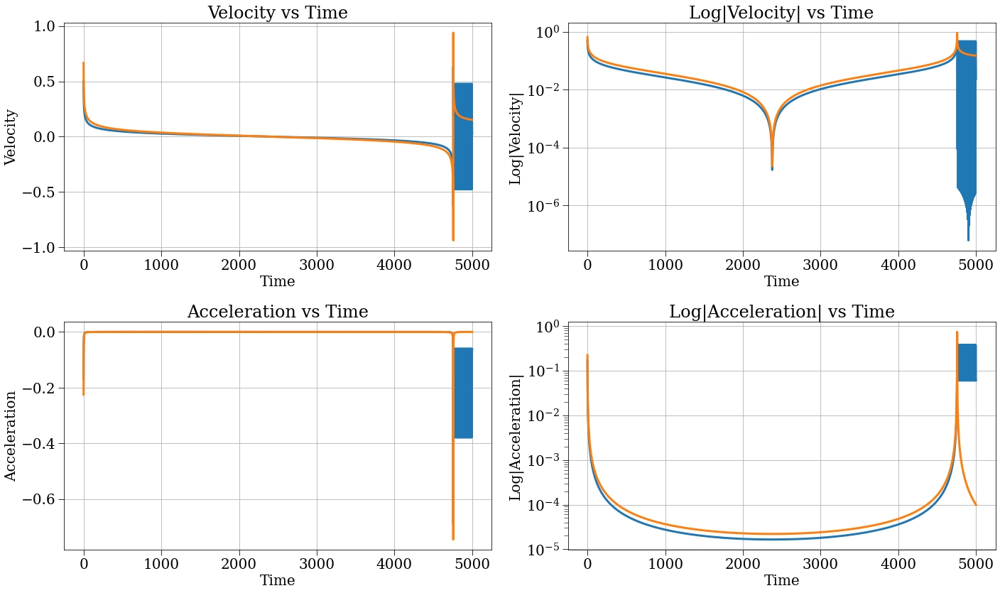

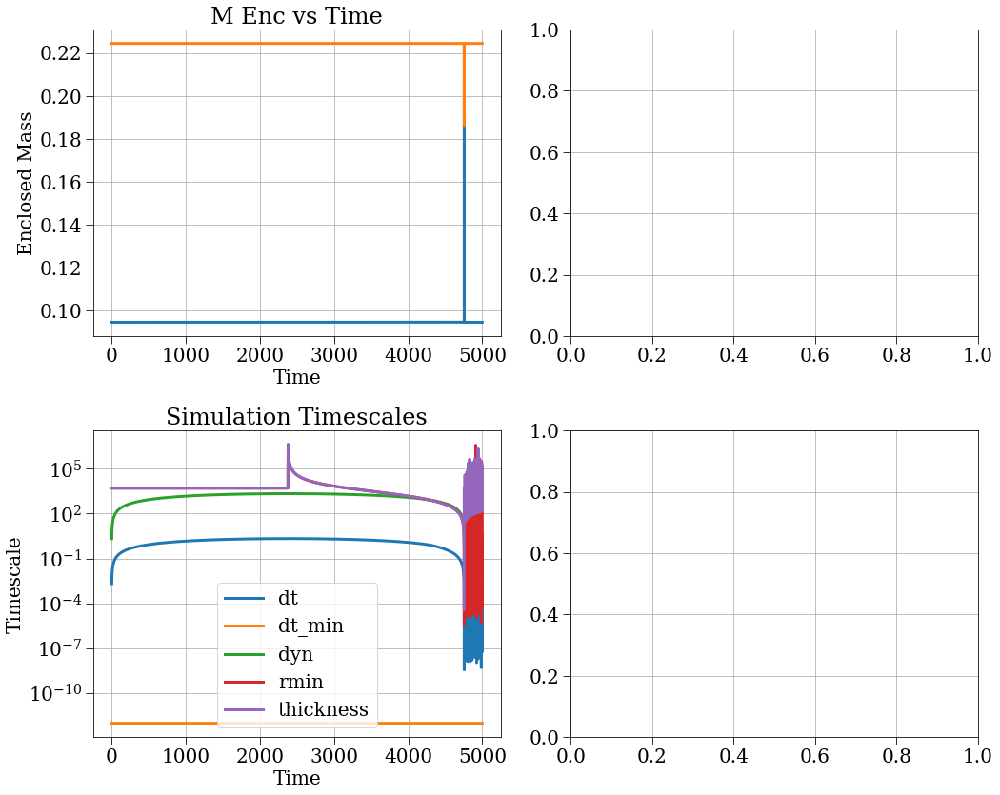

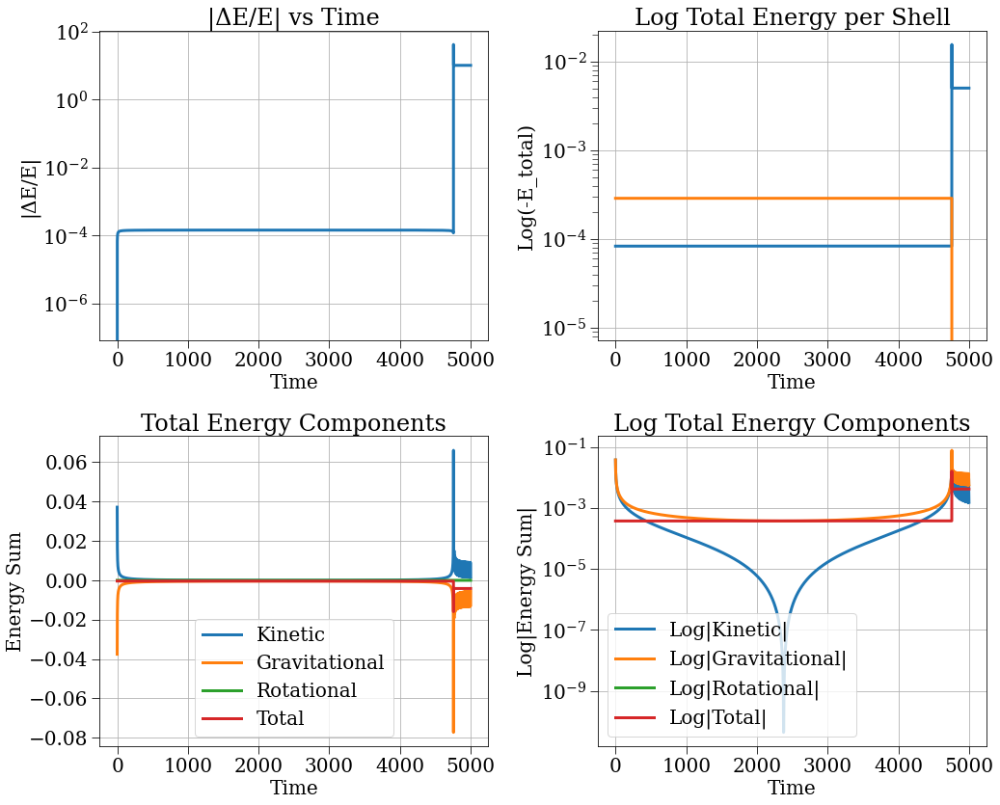

In [102]:
cycloid_reflect_config2_very_thick_test = make_cycloid_config(N=2, reflect_bool=True, t_max=5000, r_min=0.5, timescale_strategy='dyn_rmin_thickness', dt_min=1e-12, safety_factor=1e-3, thickness_coef=0.25, save_dt=1e-4)
sc = SphericalCollapse(cycloid_reflect_config2_very_thick_test)
results = sc.run()
plotter = SimulationPlotter(results, sc)

# Configuration 1: Radius analysis
plotter.plot_radius_analysis()

# Configuration 2: Velocity and acceleration analysis
plotter.plot_velocity_acceleration()

# Configuration 3: Mass, density, and timescales
plotter.plot_mass_density_timescales()

# Configuration 4: Energy analysis
plotter.plot_energy_analysis()

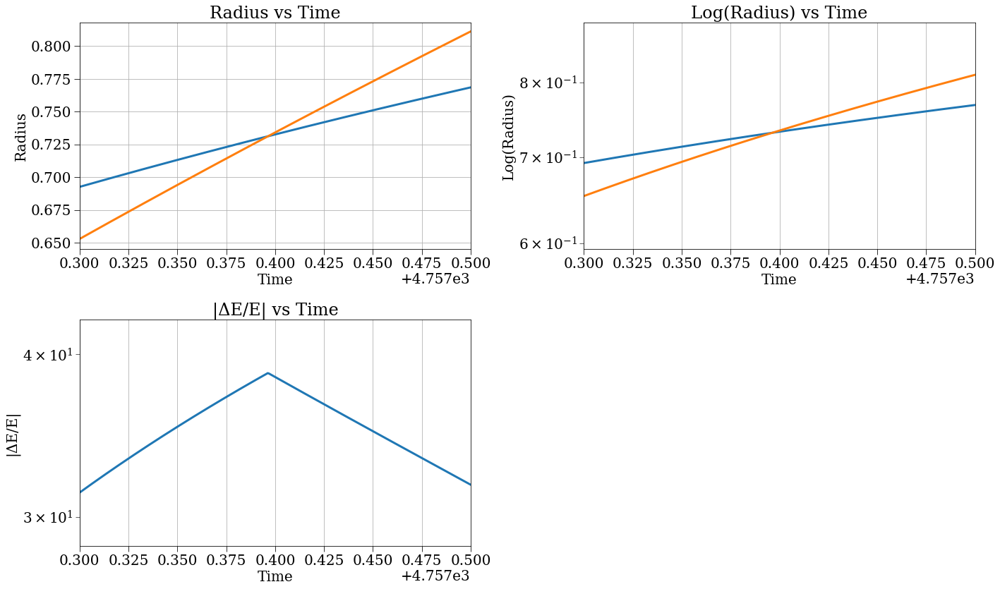

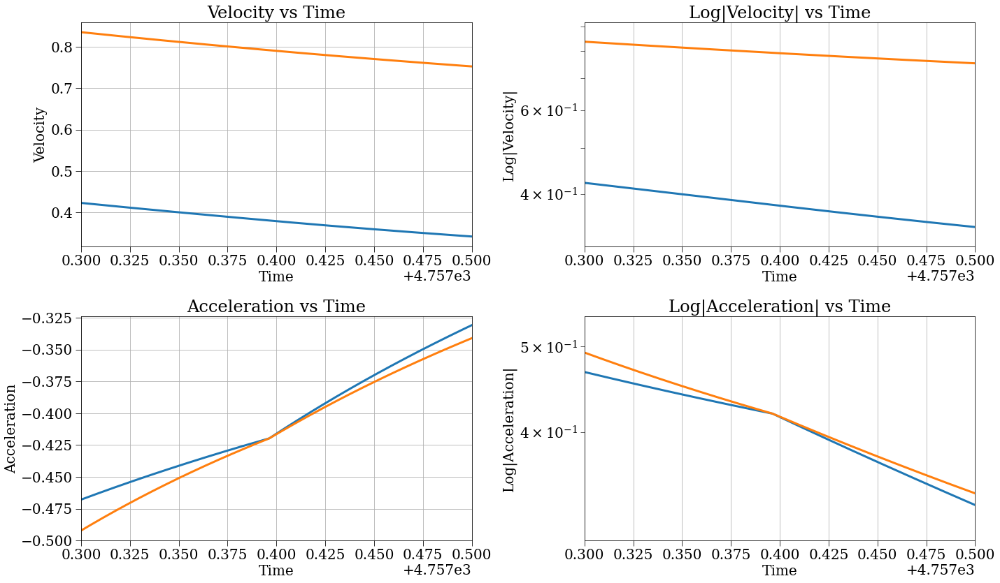

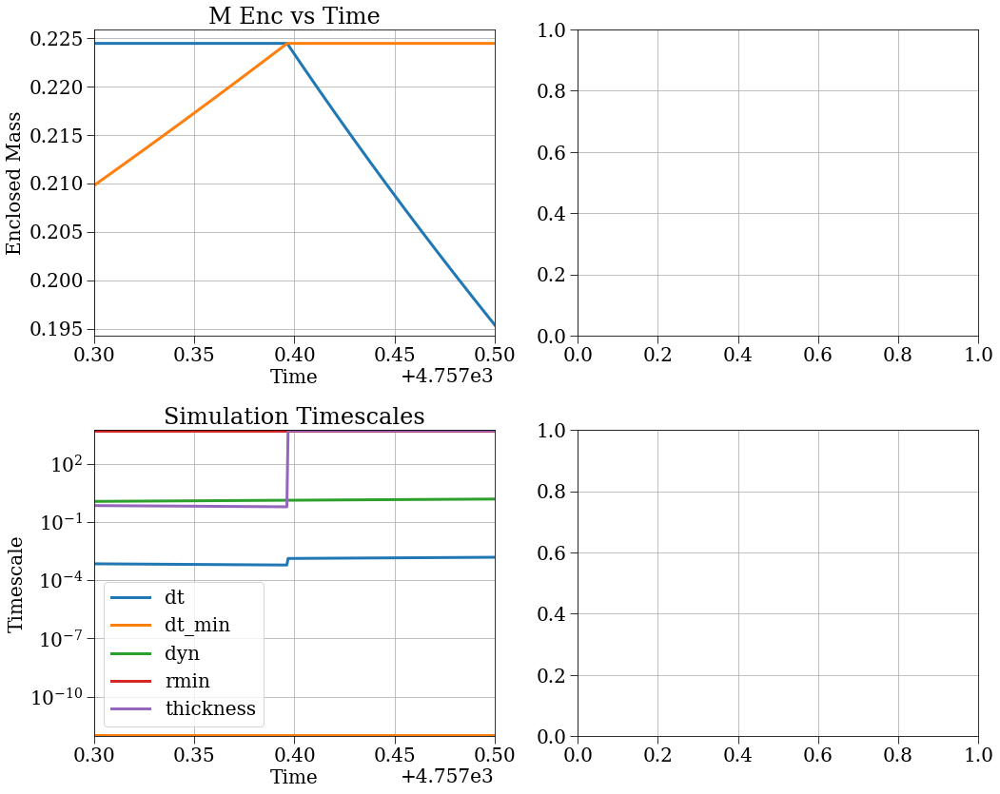

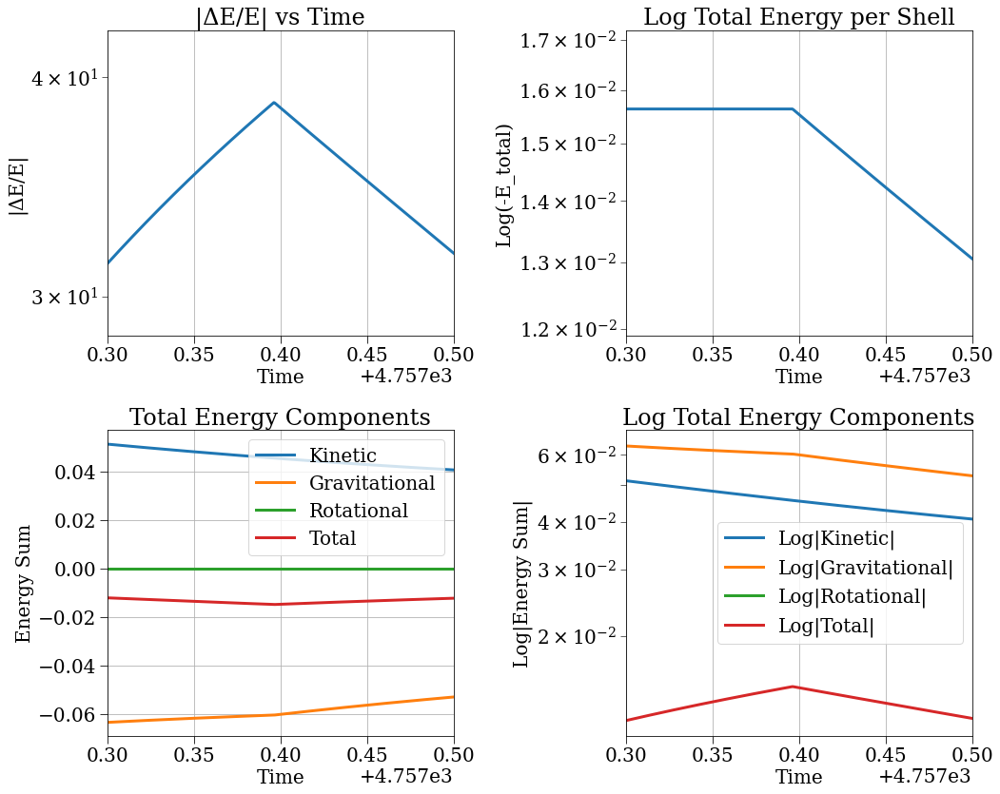

In [109]:
# Define the time window around t=4758
t_center = 4757.4
window = 0.1  # Adjust this value to control zoom level
t_min = t_center - window
t_max = t_center + window

# Add time window to all plots using a custom shell configuration
shell_config = PlotConfig(
    property_name='',
    xlim=(t_min, t_max)
)

# Generate all plots with the time window
plotter.plot_radius_analysis(shell_config)
plotter.plot_velocity_acceleration(shell_config)
plotter.plot_mass_density_timescales(shell_config)
plotter.plot_energy_analysis(shell_config)

### With Angular Momentum

Now if there is a small angular momentum term, we have a centrifugal force:
$$
\frac{d^2 r}{dt^2} = -\frac{Gm_{enc}}{r^2} + \frac{j^2}{r^3}
$$
$$\mathcal{E} = \frac{1}{2} \left( \frac{dr}{dt} \right)^2 - \frac{Gm_{enc}}{r} + \frac{j^2}{2r^2}$$
There is not really a closed form solution for this, but in the limit of small $j$ the solution approaches the cycloid solution + we can determine what the periapsis and apoapsis are.
In both cases the radial velocity is zero so:
$$
\mathcal{E} = -\frac{Gm_{enc}}{r'} + \frac{j^2}{2r'^2}
$$
Where $r'$ is the periapsis or apoapsis radius.
$$
\mathcal{E}r'^2 + Gm_{enc}r' - \frac{j^2}{2} = 0
$$
This is a quadratic equation for $r'$ which has solutions:
$$
r' = \frac{-Gm_{enc} \pm \sqrt{G^2m_{enc}^2 + 2\mathcal{E}j^2}}{2\mathcal{E}}
$$
Factoring out and only looking at the case $\mathcal{E} < 0$ (which is the case for a bound orbit):
$$
r' = \frac{Gm_{enc} \pm Gm_{enc}\sqrt{1 - 2|\mathcal{E}|j^2/G^2m_{enc}^2}}{2|\mathcal{E}|}
$$
$$
r' = \frac{Gm_{enc}}{2|\mathcal{E}|} \left( 1 \pm \sqrt{1 - 2|\mathcal{E}|j^2/G^2m_{enc}^2} \right)
$$
$$
r' = \frac{Gm_{enc}}{2|\mathcal{E}|} \left( 1 \pm \sqrt{1 - 2|\mathcal{E}|j^2/G^2m_{enc}^2} \right)
$$
Now in the limit of small $j$, ($j^2 \ll G^2m_{enc}^2/2|\mathcal{E}|$), we have:
$$
r' = \frac{Gm_{enc}}{2|\mathcal{E}|} \left( 1 \pm (1 - |\mathcal{E}| j^2/G^2m_{enc}^2) \right)
$$
$$
r_{peri} = \frac{Gm_{enc}}{2|\mathcal{E}|} \left( |\mathcal{E}| j^2/G^2m_{enc}^2 \right)
$$
$$
r_{peri} = \frac{j^2}{2Gm_{enc}}
$$
$$
r_{apo} = \frac{Gm_{enc}}{2|\mathcal{E}|} \left( 2 - |\mathcal{E}| j^2/G^2m_{enc}^2 \right)
$$
$$
r_{apo} = \frac{Gm_{enc}}{|\mathcal{E}|} \left( 1 - |\mathcal{E}| j^2/2G^2m_{enc}^2 \right)
$$
$$
r_{apo} = r_{ta,cycloid} \left( 1 - \frac{|\mathcal{E}| j^2}{2G^2m_{enc}^2} \right)
$$

In [3]:
# Numerical Solution
sc = SphericalCollapse(cycloid_j_config1)
results = sc.run()

2025-01-16 09:33:52,104 - collapse - INFO - Simulation setup complete


In [34]:
print(min(results['r'][:, 0]), max(results['r'][:, 0]))
def predicted_min(results, sc):
    e = results['e_tot'][:, 0] / results['m'][0,0]
    j = sc.config['j_coef']
    m_enc = results['m_enc'][0, 0]
    r_peri = j**2 / (2 * m_enc)
    return r_peri
print(predicted_min(results, sc))

5.050002514551958e-05


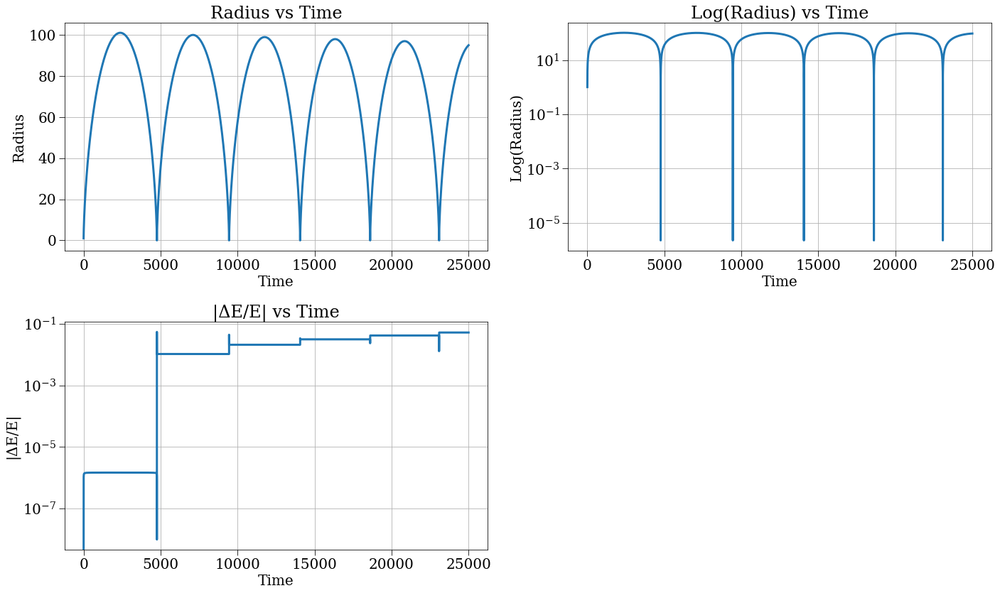

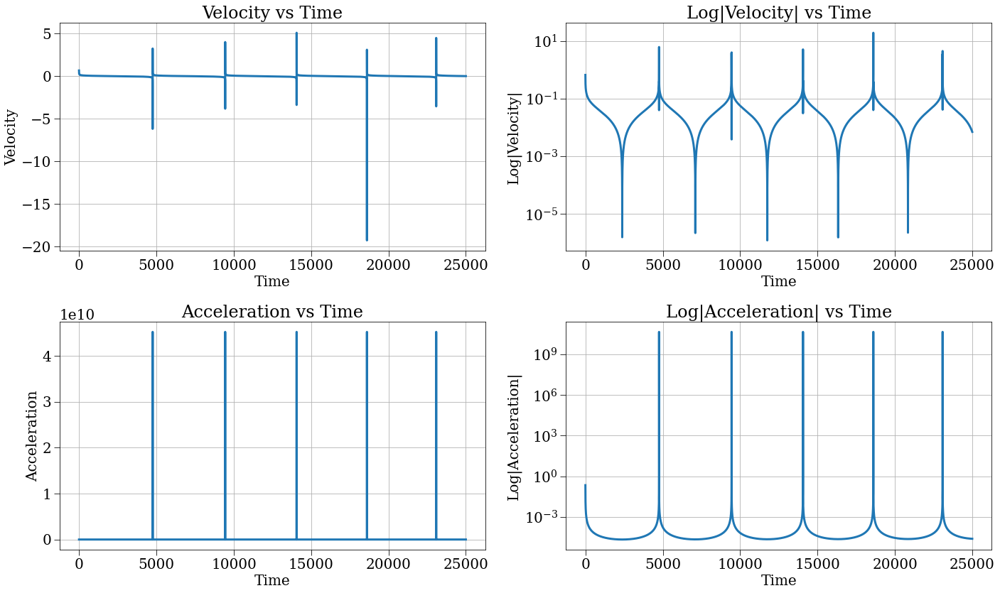

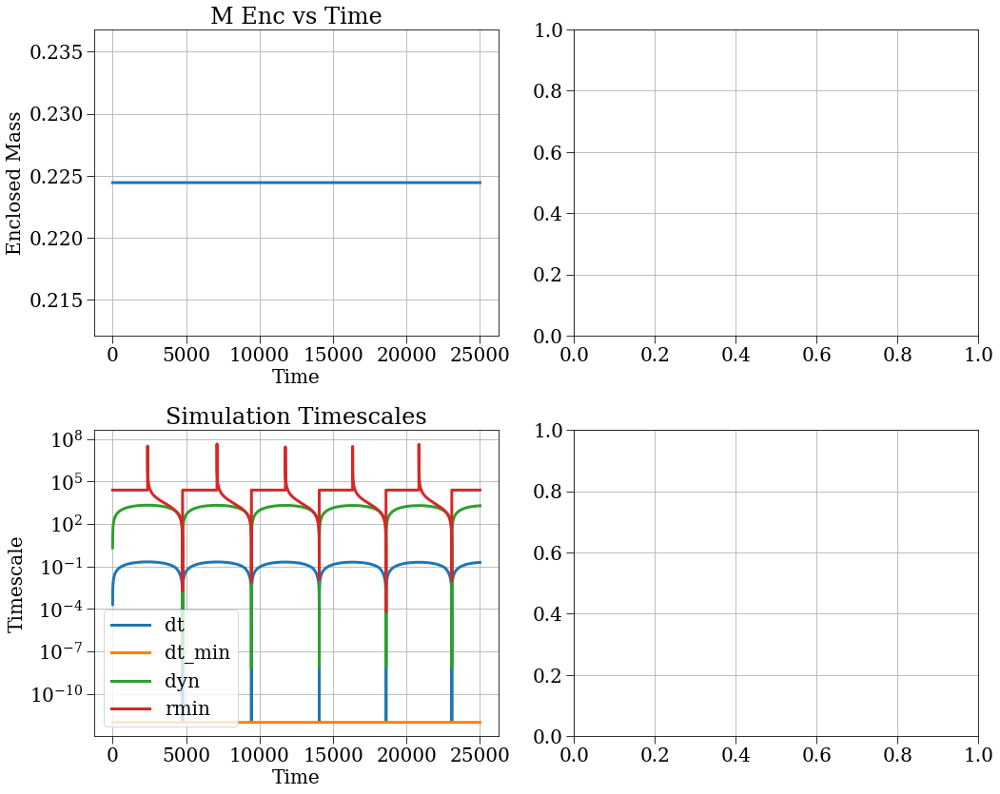

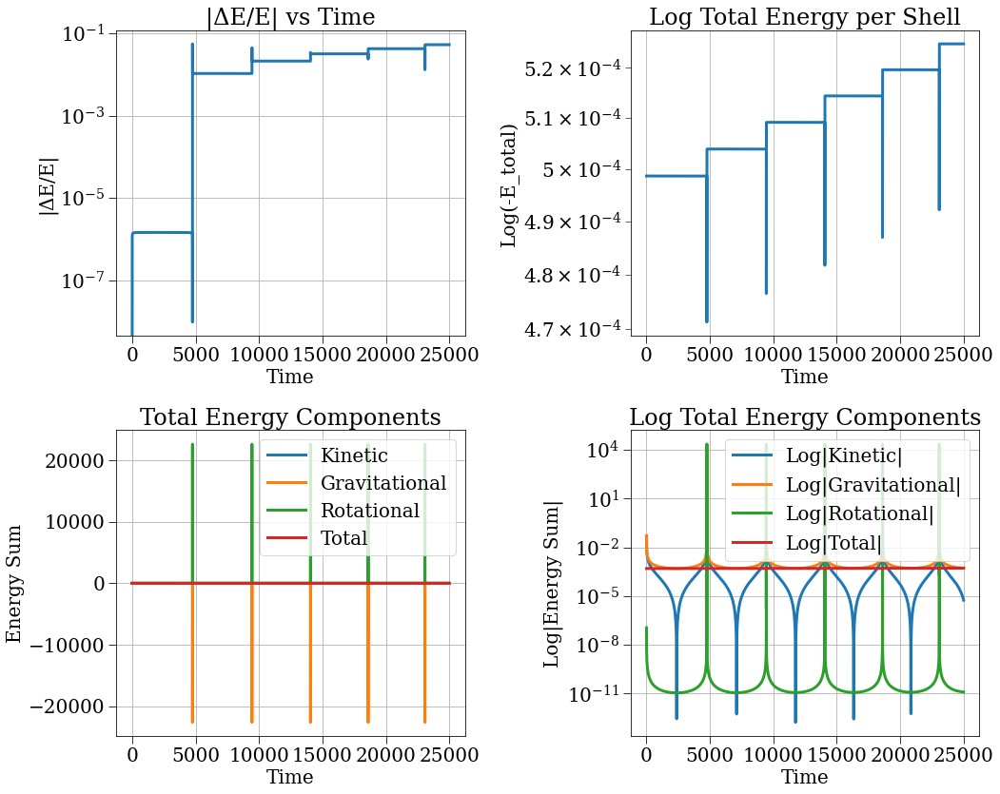

In [4]:
plotter = SimulationPlotter(results, sc)

# Configuration 1: Radius analysis
plotter.plot_radius_analysis()

# Configuration 2: Velocity and acceleration analysis
plotter.plot_velocity_acceleration()

# Configuration 3: Mass, density, and timescales
plotter.plot_mass_density_timescales()

# Configuration 4: Energy analysis
plotter.plot_energy_analysis()

#### Shell Crossings

In [5]:
# Numerical Solution
sc = SphericalCollapse(cycloid_j_config2)
results = sc.run()

2025-01-16 09:36:47,950 - collapse - INFO - Simulation setup complete


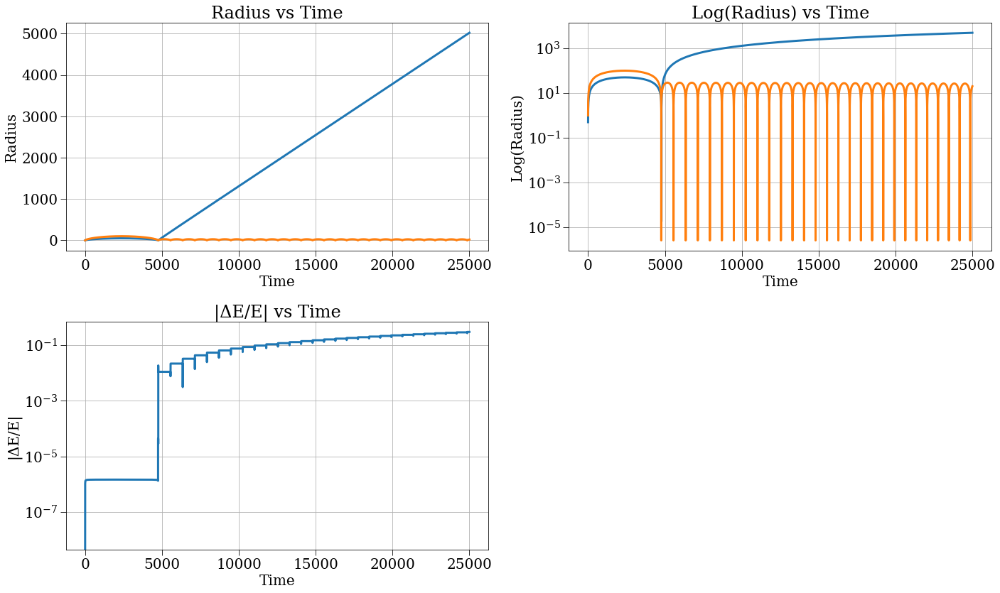

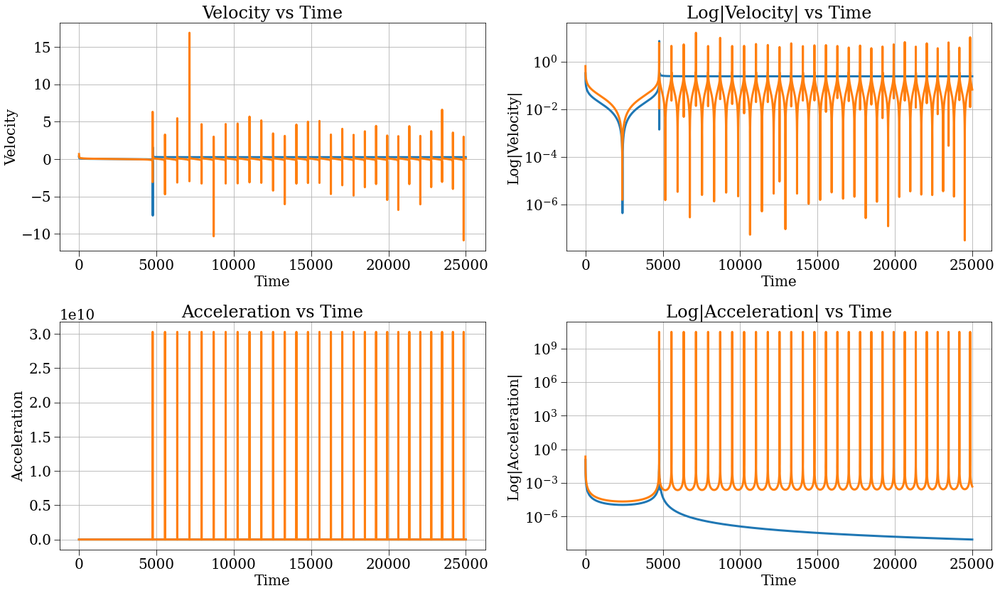

/home/jsipple/one_d_spherical_collapse/one-d-spherical-collapse-of-fuzzy-dark-matter/src/plotting.py:413: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
/home/jsipple/.conda/envs/jsipple/lib/python3.7/site-packages/IPython/core/pylabtools.py:128: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


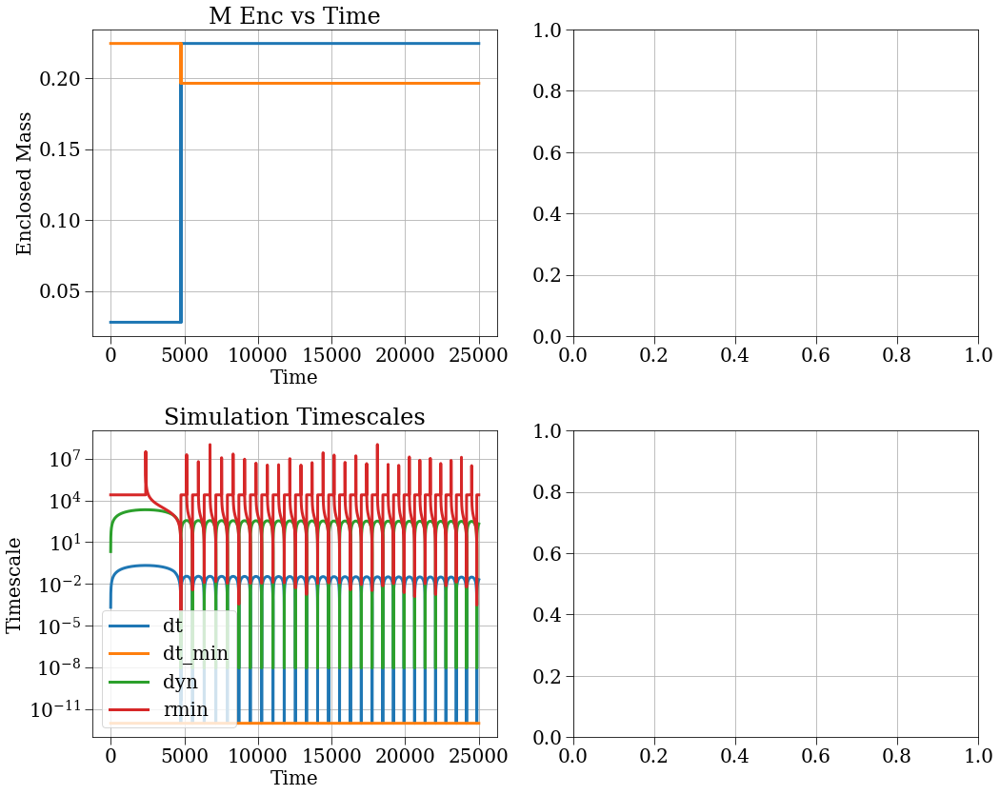

/home/jsipple/one_d_spherical_collapse/one-d-spherical-collapse-of-fuzzy-dark-matter/src/plotting.py:505: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
/home/jsipple/.conda/envs/jsipple/lib/python3.7/site-packages/IPython/core/pylabtools.py:128: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


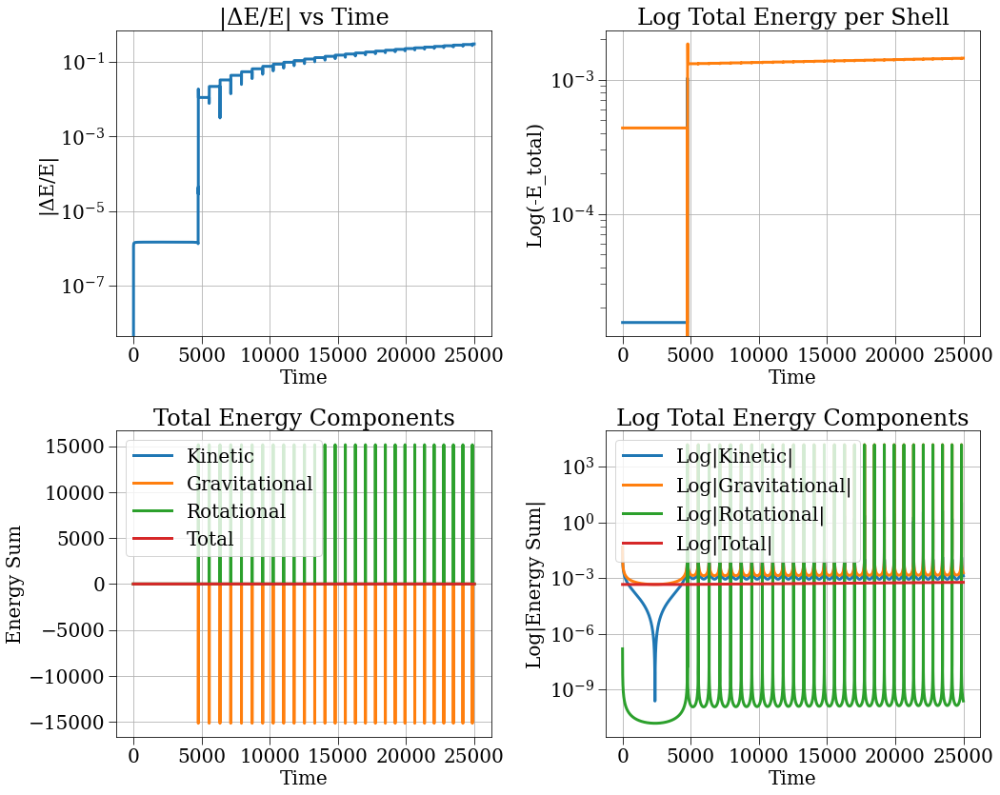

In [6]:
plotter = SimulationPlotter(results, sc)

# Configuration 1: Radius analysis
plotter.plot_radius_analysis()

# Configuration 2: Velocity and acceleration analysis
plotter.plot_velocity_acceleration()

# Configuration 3: Mass, density, and timescales
plotter.plot_mass_density_timescales()

# Configuration 4: Energy analysis
plotter.plot_energy_analysis()

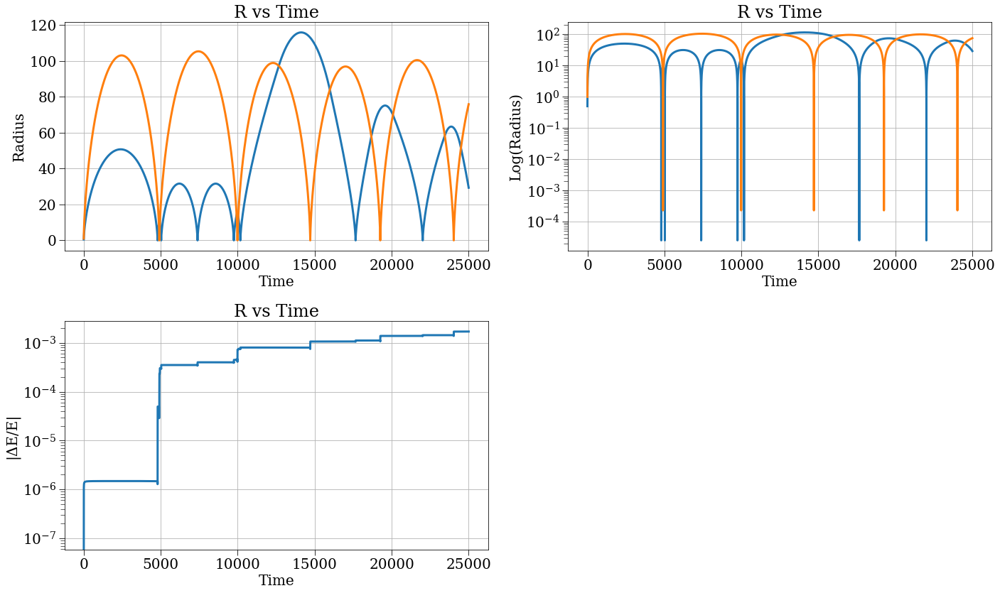

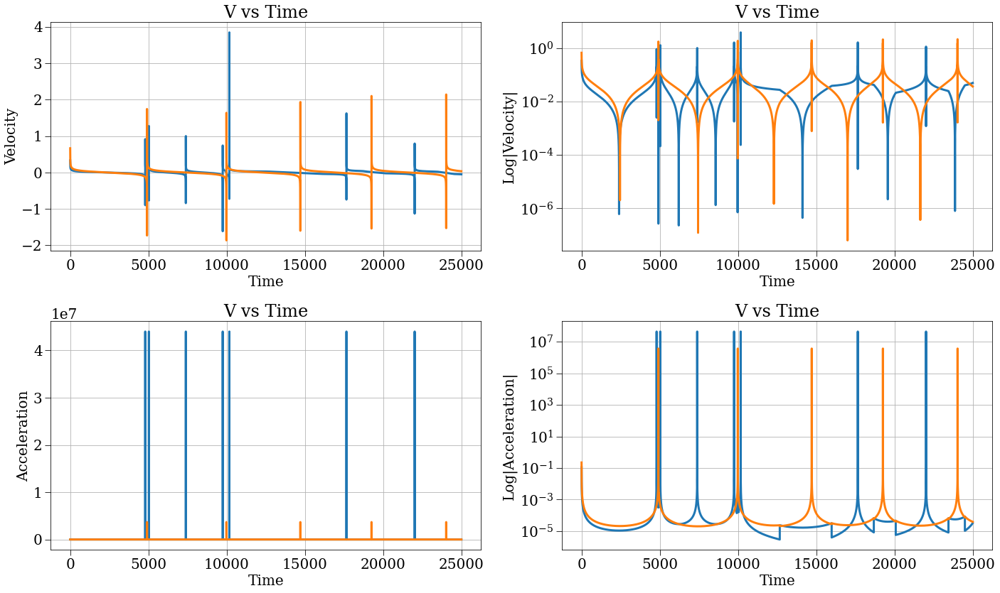

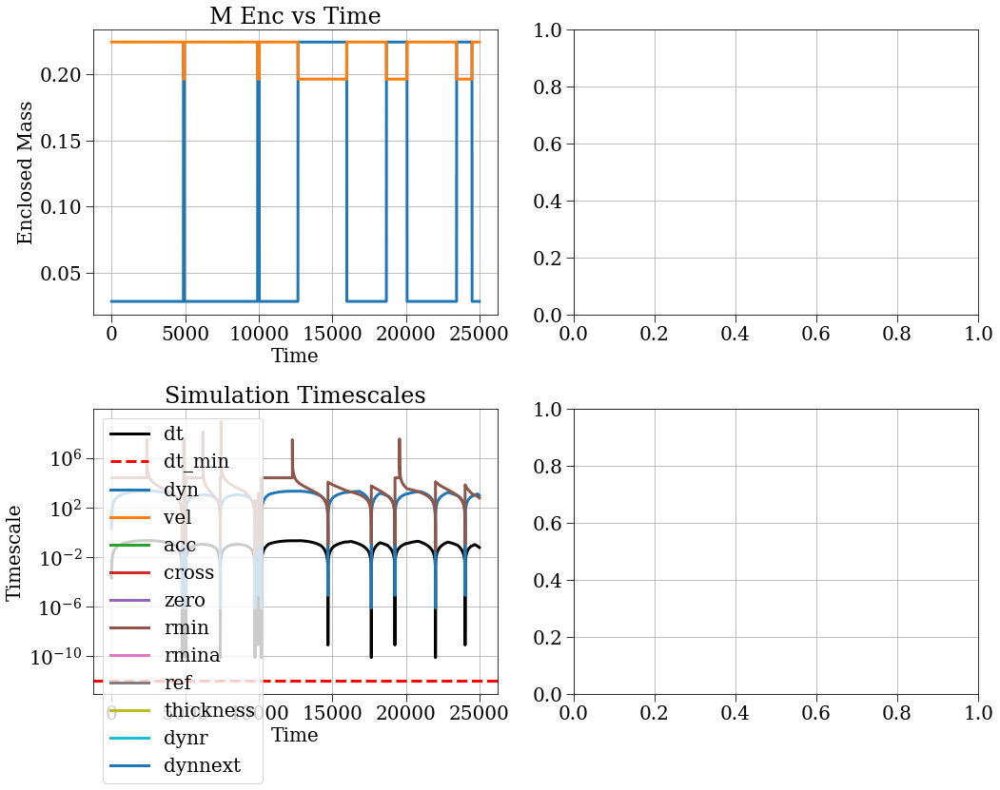

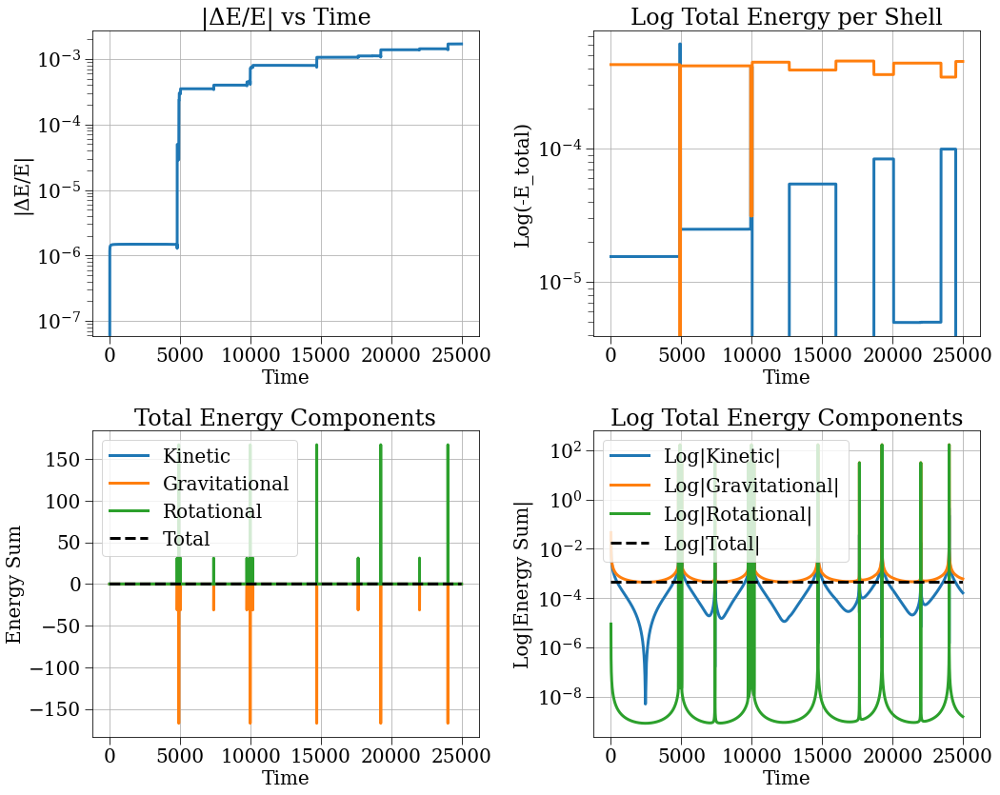

In [45]:
plotter = SimulationPlotter(results, sc)

# Configuration 1: Radius analysis
plotter.plot_radius_analysis()

# Configuration 2: Velocity and acceleration analysis
plotter.plot_velocity_acceleration()

# Configuration 3: Mass, density, and timescales
plotter.plot_mass_density_timescales()

# Configuration 4: Energy analysis
plotter.plot_energy_analysis()

## SCRATCH WORK

In [38]:
sc = SphericalCollapse(cycloid_reflect_config2_minus2)
results = sc.run()
plotter = SimulationPlotter(results, sc)

# Configuration 1: Radius analysis
plotter.plot_radius_analysis()

# Configuration 2: Velocity and acceleration analysis
plotter.plot_velocity_acceleration()

# Configuration 3: Mass, density, and timescales
plotter.plot_mass_density_timescales()

# Configuration 4: Energy analysis
plotter.plot_energy_analysis()

2025-01-14 19:26:35,141 - collapse - INFO - Simulation setup complete


CONDITION MET AT TIME 2378.8118503533883
CONDITION MET AT TIME 4758.501711699873
CONDITION MET AT TIME 4758.503492914616
CONDITION MET AT TIME 4758.510129997875
CONDITION MET AT TIME 4758.520454065923
CONDITION MET AT TIME 4758.530778613417
CONDITION MET AT TIME 4758.541103037439
CONDITION MET AT TIME 4758.551427584907
CONDITION MET AT TIME 4758.56175200878
CONDITION MET AT TIME 4758.572076556215
CONDITION MET AT TIME 4758.582400979939
CONDITION MET AT TIME 4758.592725527336
CONDITION MET AT TIME 4758.6030499509325
CONDITION MET AT TIME 4758.613374498297
CONDITION MET AT TIME 4758.62369892174
CONDITION MET AT TIME 4758.63402346907
CONDITION MET AT TIME 4758.6443478923775
CONDITION MET AT TIME 4758.654672439668
CONDITION MET AT TIME 4758.664996862814
CONDITION MET AT TIME 4758.675321410061
CONDITION MET AT TIME 4758.685645833058
CONDITION MET AT TIME 4758.695970380276
CONDITION MET AT TIME 4758.706294803128
CONDITION MET AT TIME 4758.716619350318
CONDITION MET AT TIME 4758.7269437730265

KeyboardInterrupt: 

2025-01-14 19:32:46,733 - collapse - INFO - Simulation setup complete


CONDITION MET AT TIME 3.856608264759266
CONDITION MET AT TIME 8.13635779197098
CONDITION MET AT TIME 8.29755402069306
CONDITION MET AT TIME 9.854129531013823
CONDITION MET AT TIME 11.632102996571763
CONDITION MET AT TIME 13.410291460551317
CONDITION MET AT TIME 14.419188116818814
CONDITION MET AT TIME 15.18835215937212
CONDITION MET AT TIME 16.966540616128867
CONDITION MET AT TIME 18.744601285666416
CONDITION MET AT TIME 20.285203055990433
CONDITION MET AT TIME 20.555110099530545
CONDITION MET AT TIME 21.53538736294384
CONDITION MET AT TIME 24.0034924777723
CONDITION MET AT TIME 25.893440722391812
CONDITION MET AT TIME 26.471480802483033
CONDITION MET AT TIME 28.939585901814063
CONDITION MET AT TIME 31.224801090827818
CONDITION MET AT TIME 31.35583316791057
CONDITION MET AT TIME 35.13117739926466
CONDITION MET AT TIME 36.59255987206591
CONDITION MET AT TIME 39.62888086756558
CONDITION MET AT TIME 41.160949490935565
CONDITION MET AT TIME 42.411752599956834
CONDITION MET AT TIME 45.57727

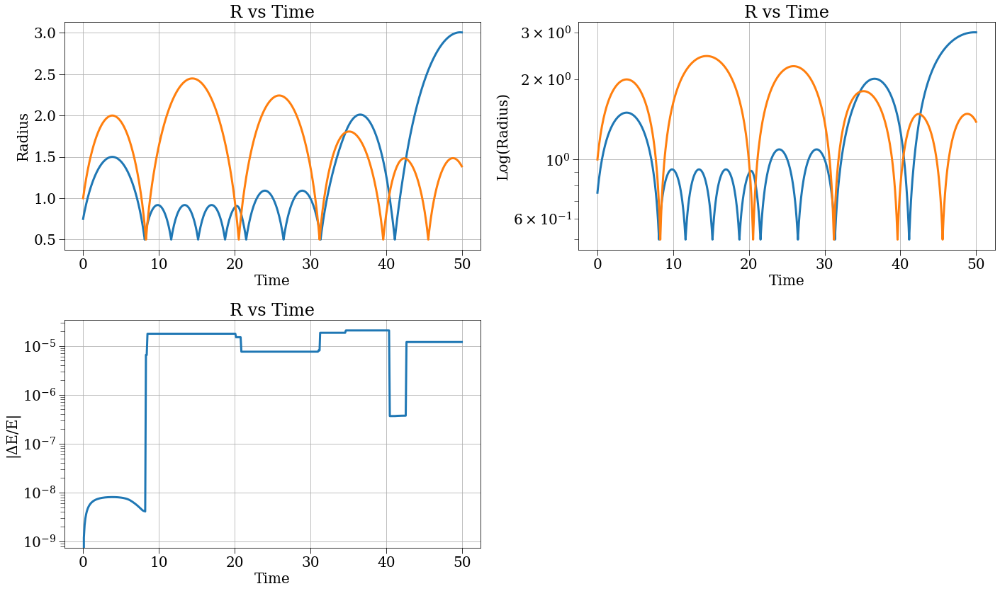

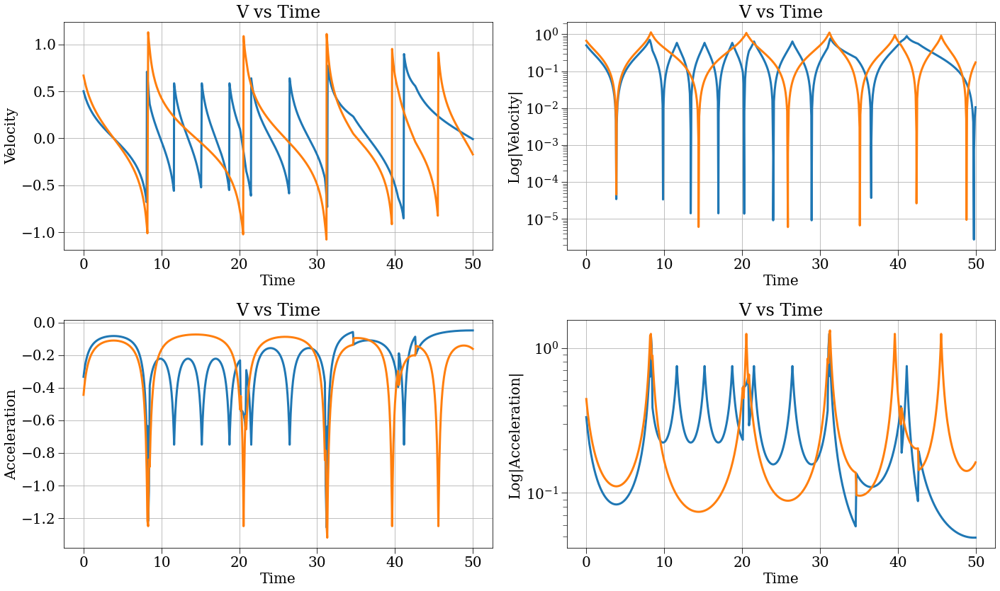

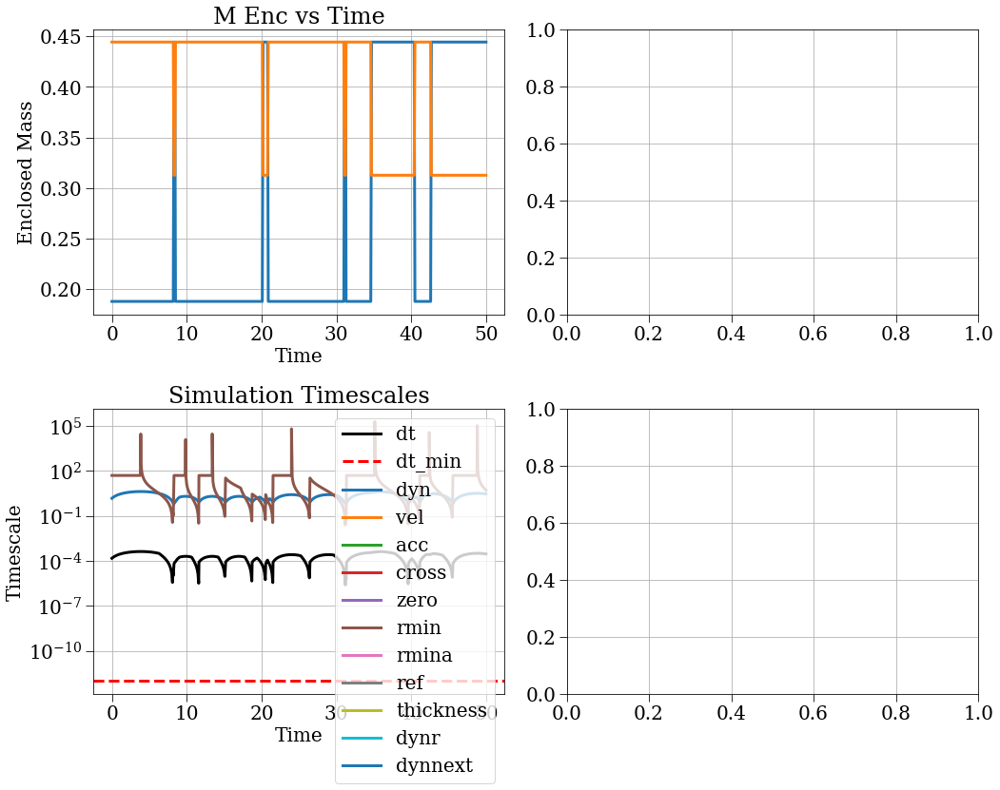

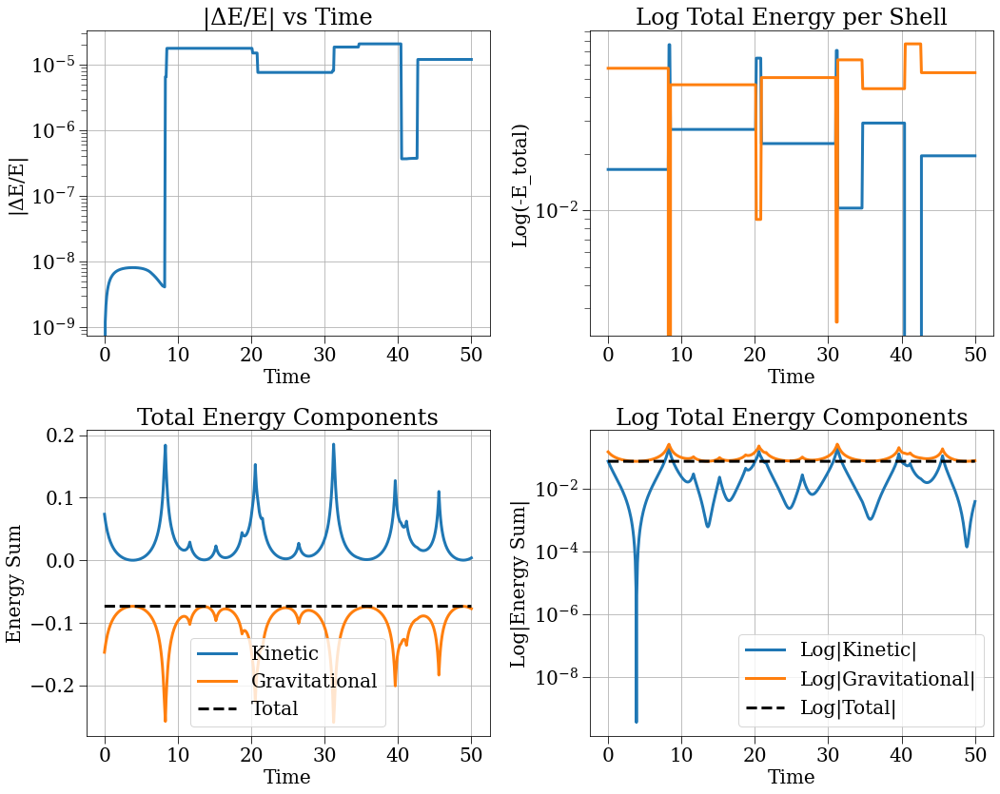

In [43]:
sc = SphericalCollapse(cycloid_reflect_config2_large)
results = sc.run()
plotter = SimulationPlotter(results, sc)

# Configuration 1: Radius analysis
plotter.plot_radius_analysis()

# Configuration 2: Velocity and acceleration analysis
plotter.plot_velocity_acceleration()

# Configuration 3: Mass, density, and timescales
plotter.plot_mass_density_timescales()

# Configuration 4: Energy analysis
plotter.plot_energy_analysis()

2025-01-16 10:03:46,664 - collapse - INFO - Simulation setup complete


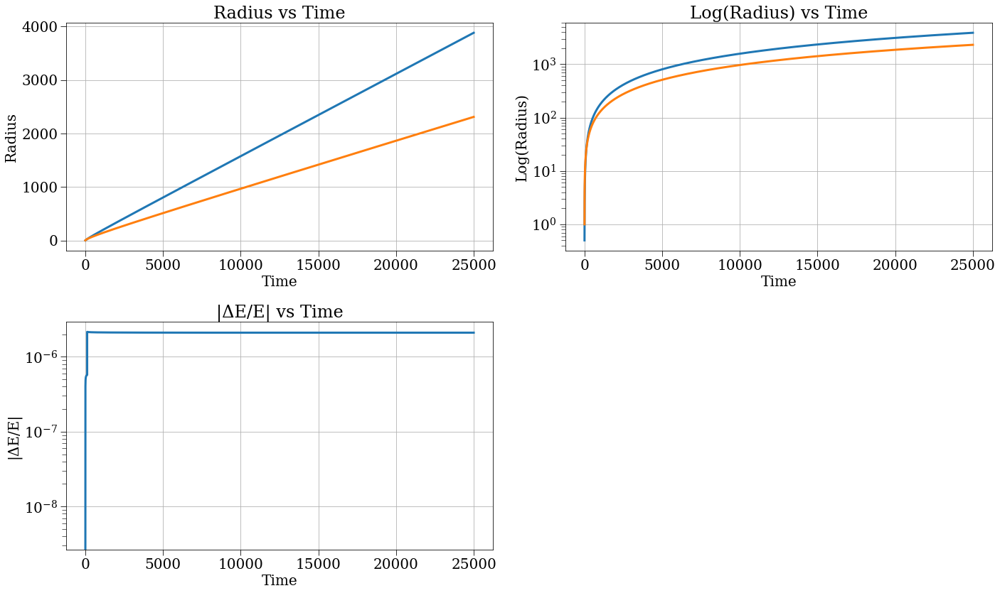

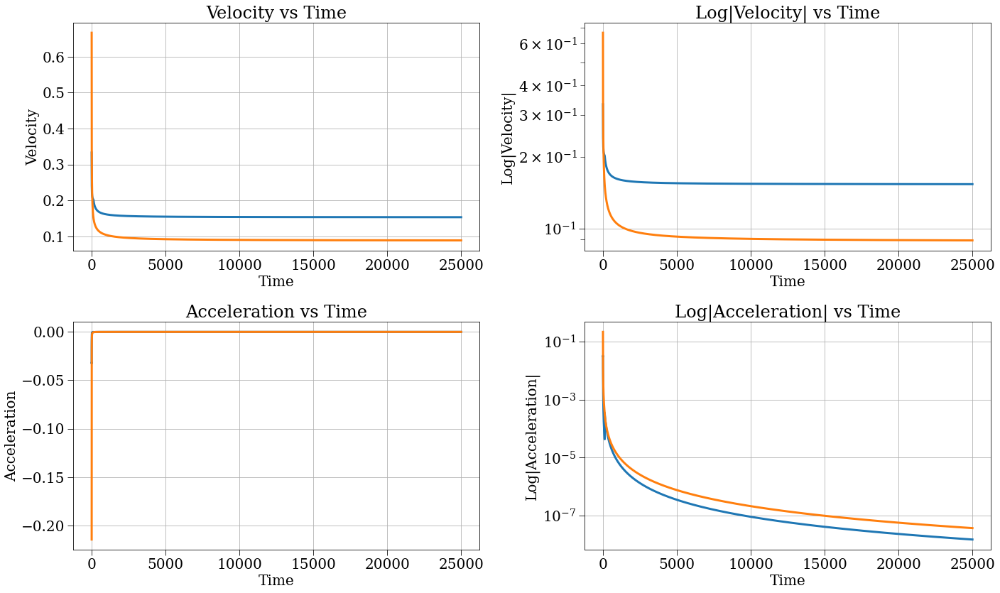

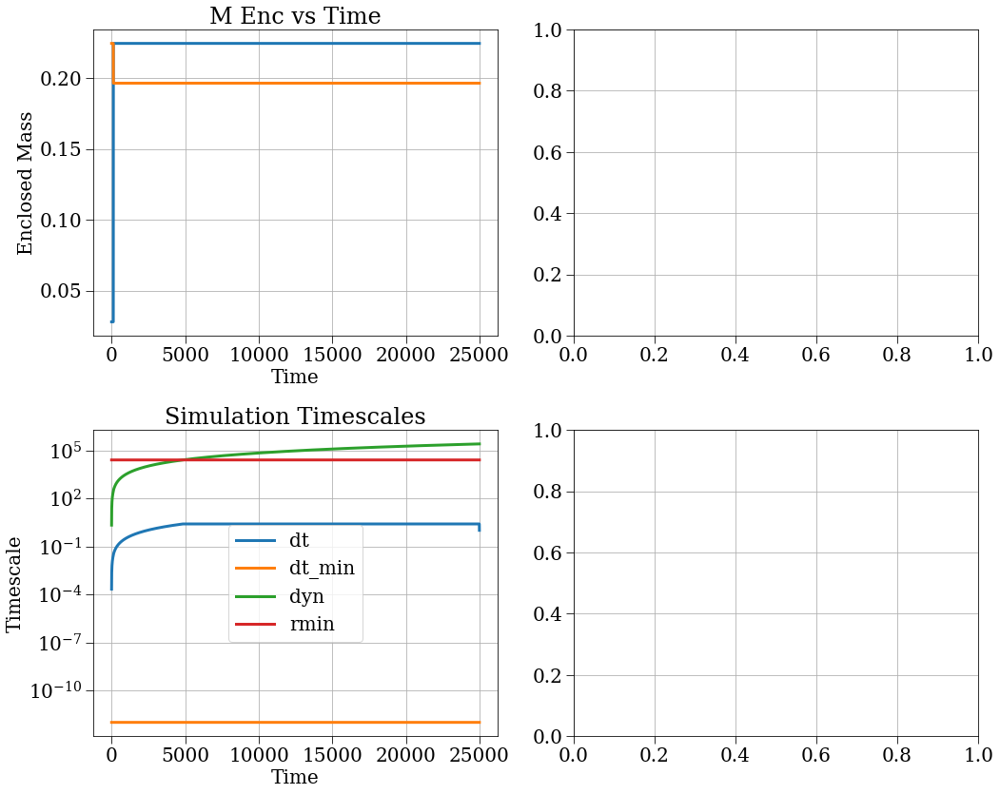

/home/jsipple/one_d_spherical_collapse/one-d-spherical-collapse-of-fuzzy-dark-matter/src/plotting.py:86: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  ax.set_yscale(config.yscale)


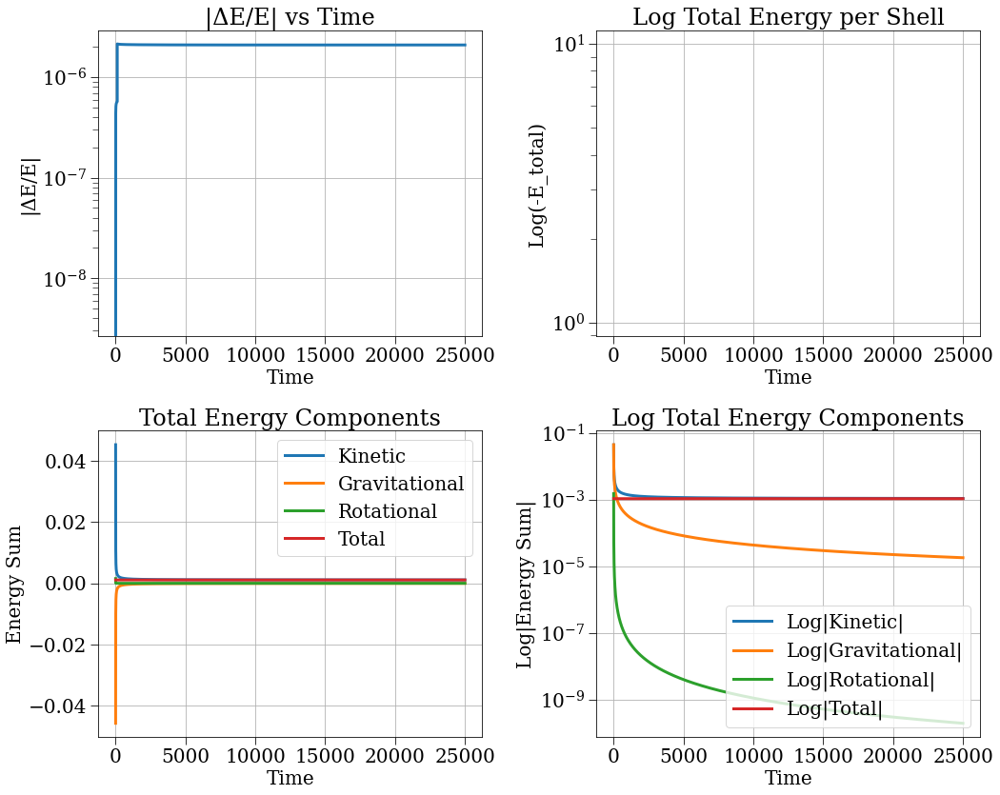

In [13]:
sc = SphericalCollapse(cycloid_j_config2_large)
results = sc.run()
plotter = SimulationPlotter(results, sc)

# Configuration 1: Radius analysis
plotter.plot_radius_analysis()

# Configuration 2: Velocity and acceleration analysis
plotter.plot_velocity_acceleration()

# Configuration 3: Mass, density, and timescales
plotter.plot_mass_density_timescales()

# Configuration 4: Energy analysis
plotter.plot_energy_analysis()

# Equal Mass

In [45]:
a = 4/3 * np.pi * (1**3 - 0.8**3)
b = 4/3 * np.pi * (0.8**3 - 0.5**3) 
print(a, b)

2.044129619935758 1.6210618092523337


In [2]:
sc = SphericalCollapse(equal_mass_config2)
results = sc.run()
plotter = SimulationPlotter(results, sc)

# Configuration 1: Radius analysis
plotter.plot_radius_analysis()

# Configuration 2: Velocity and acceleration analysis
plotter.plot_velocity_acceleration()

# Configuration 3: Mass, density, and timescales
plotter.plot_mass_density_timescales()
# Configuration 4: Energy analysis
plotter.plot_energy_analysis()

NameError: name 'SphericalCollapse' is not defined

In [64]:
print(results['r'][:, 0])
print(results['r'][:, 1])
print('M', results['m'][0, 0], results['m'][0, 1])
print(results['m_enc'][0, 0], results['m_enc'][0, 1])
print(sc.point_mass)
print(results['m'][0, 0] + sc.point_mass + results['m'][0, 1])

[0.82548181 0.83107574 0.83647198 ... 1.77693522 1.77476605 1.77247331]
[ 1.          1.00677657  1.01331365 ... 78.82945864 78.83238084
 78.835464  ]
M 0.09819444391449396 0.0981944449743949
0.1262499994700495 0.2244444444444444
0.028055555555555556
0.2244444444444444


2025-01-22 21:22:38,427 - collapse - INFO - Simulation setup complete


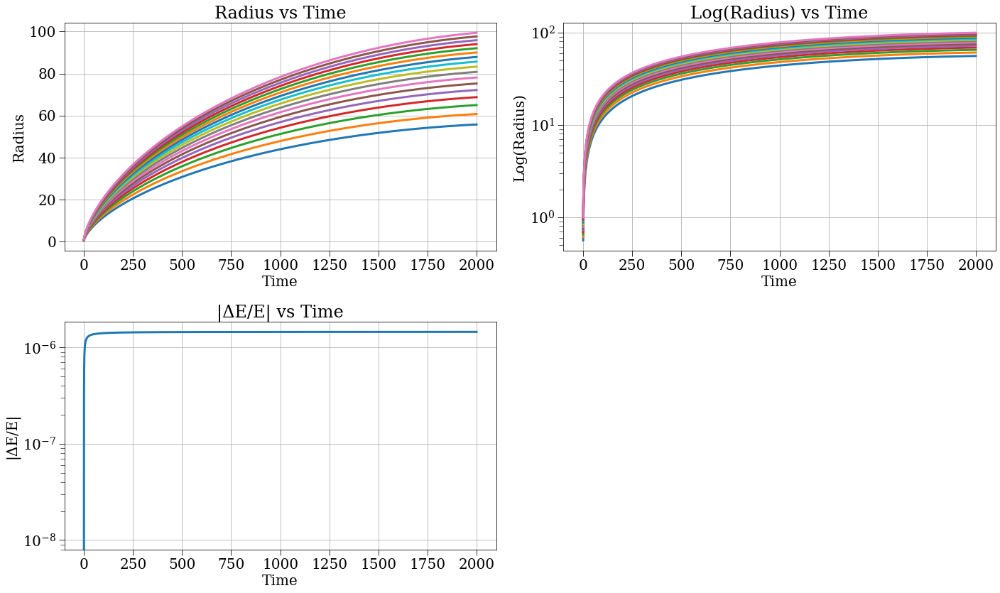

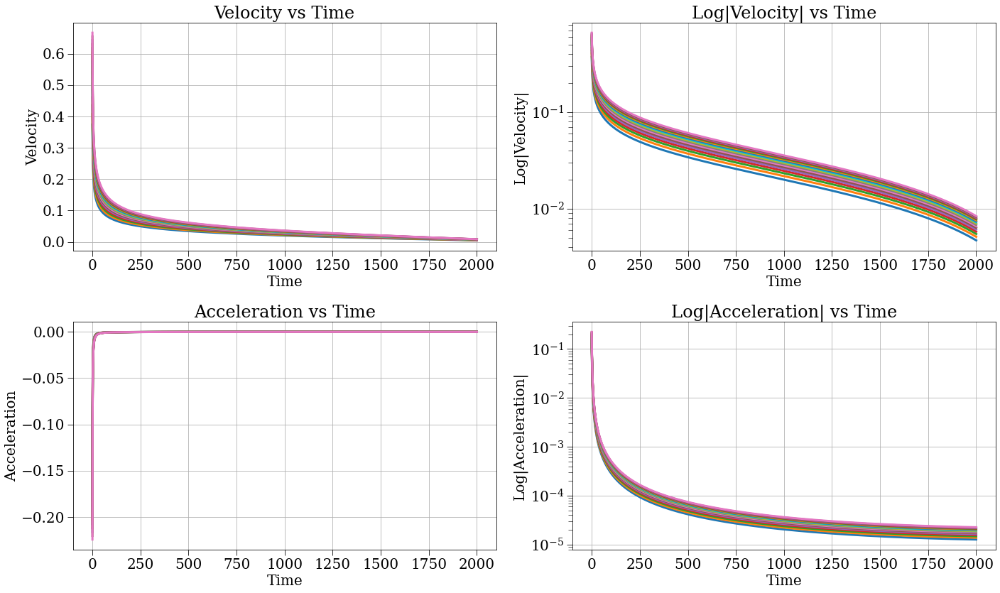

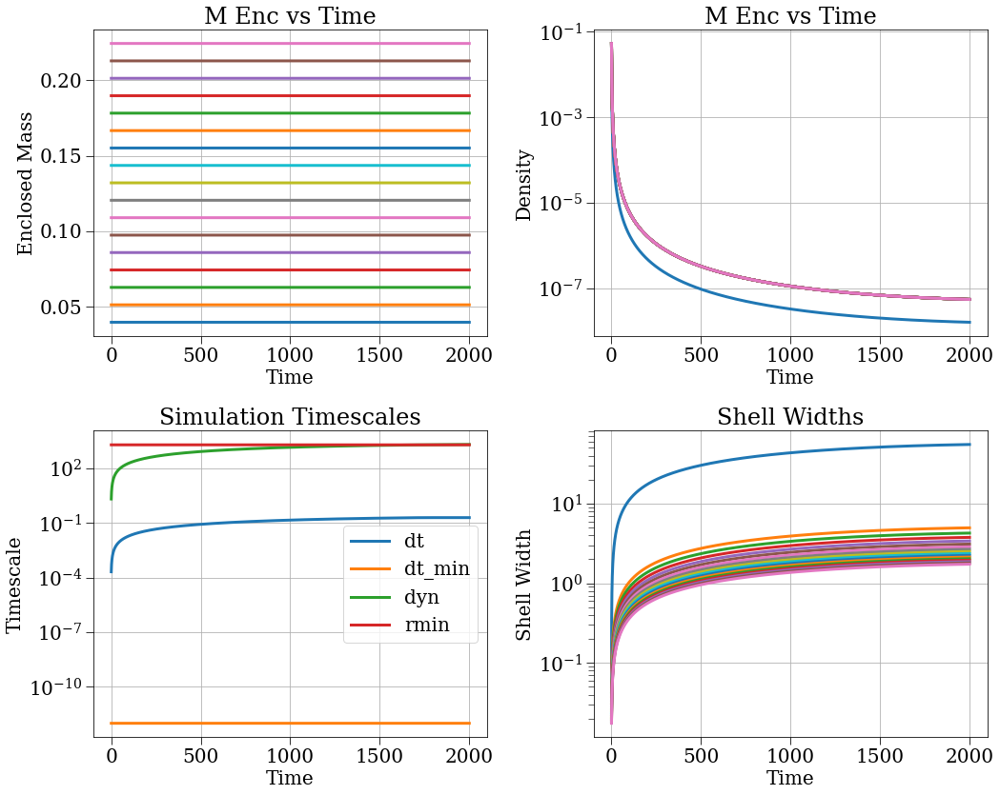

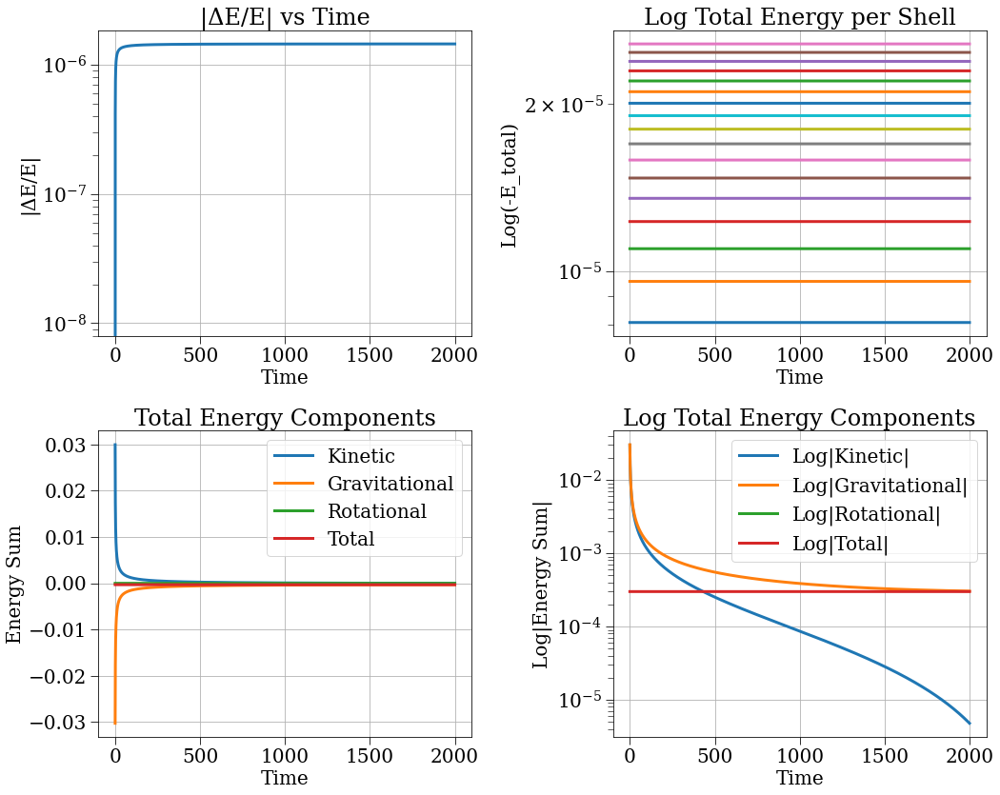

In [67]:
sc = SphericalCollapse(equal_mass_config17)
results = sc.run()
plotter = SimulationPlotter(results, sc)

# Configuration 1: Radius analysis
plotter.plot_radius_analysis()

# Configuration 2: Velocity and acceleration analysis
plotter.plot_velocity_acceleration()

# Configuration 3: Mass, density, and timescales
plotter.plot_mass_density_timescales()
# Configuration 4: Energy analysis
plotter.plot_energy_analysis()

In [69]:
print(results['r'][:, 0])
print(results['r'][:, 1])
print('M', results['m'][0, :])
print(results['m_enc'][0, 0], results['m_enc'][0, 1])
print(sc.point_mass)
print(results['m'][0, 0] + sc.point_mass + results['m'][0, 1])

[ 0.56090689  0.56470792  0.56837461 ... 55.76052115 55.76146627
 55.76241088]
[ 0.61085893  0.61499846  0.61899169 ... 60.72632155 60.72735083
 60.72837957]
M [0.01155229 0.01155229 0.01155229 0.01155229 0.01155229 0.01155229
 0.01155229 0.01155229 0.01155229 0.01155229 0.01155229 0.01155229
 0.01155229 0.01155229 0.01155229 0.01155229 0.01155229]
0.03960784313419703 0.05116013071390212
0.028055555555555556
0.05116013071390212


In [45]:
print('M', results['m'][0, :])
print(results['m_enc'][0, 0], results['m_enc'][0, 1], results['m_enc'][2, 0])
print(sc.point_mass)
print(results['m'][0, 0] + sc.point_mass + results['m'][0, 1])

M [0.09819444 0.09819444]
0.12624999894009903 0.22444444444444442 0.12679208192771513
0.028055555555555556
0.2244444444444444


In [50]:
sc = SphericalCollapse(neighbor2_config2)
results = sc.run()
plotter = SimulationPlotter(results, sc)

# Configuration 1: Radius analysis
plotter.plot_radius_analysis()

# Configuration 2: Velocity and acceleration analysis
plotter.plot_velocity_acceleration()

# Configuration 3: Mass, density, and timescales
plotter.plot_mass_density_timescales()
# Configuration 4: Energy analysis
plotter.plot_energy_analysis()

2025-01-27 19:33:16,633 - collapse - INFO - Simulation setup complete


KeyboardInterrupt: 

In [32]:
print(results['m_enc'][0, 0])
print(results['m_enc'][0, 1])
print(results['m'][0, 0], results['m'][0, 1], results['m'][0, 0] + results['m'][0, 1])
print(results['r'][0, 0], results['r'][0, 1])
print(4/3 * np.pi * (results['r'][0, 1]**3 - results['r'][0, 0]**3) * rho_H *(1+1e-2))
print(4/3 * np.pi * (results['r'][0, 0]**3) * rho_H *(1+1e-2))

0.1122222057258889
0.22444444444444445
0.11222221397405525 0.11222223047038918 0.22444444444444445
0.7937005065388286 1.0
0.11222223047038918
0.11222221397405525


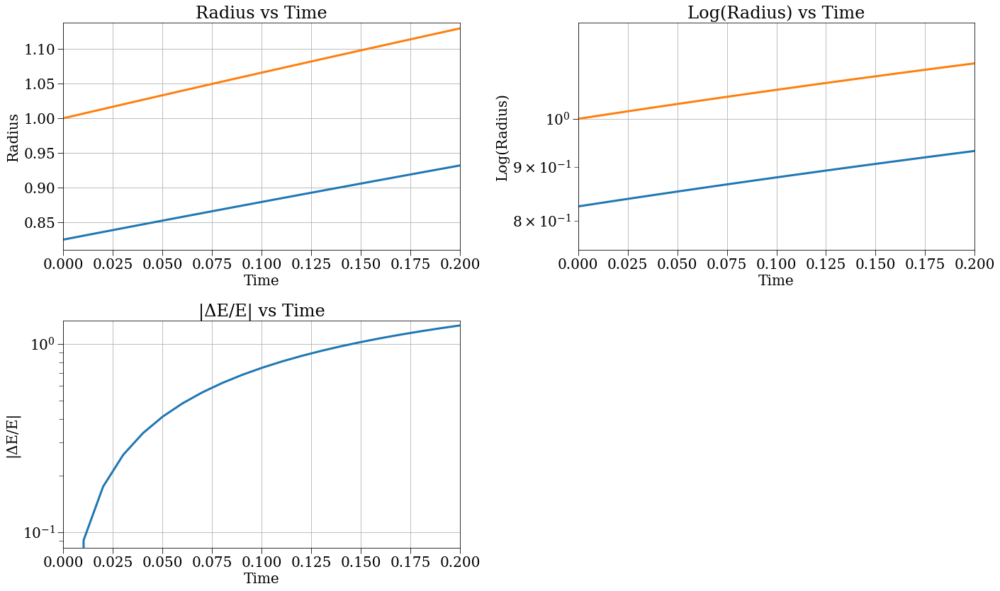

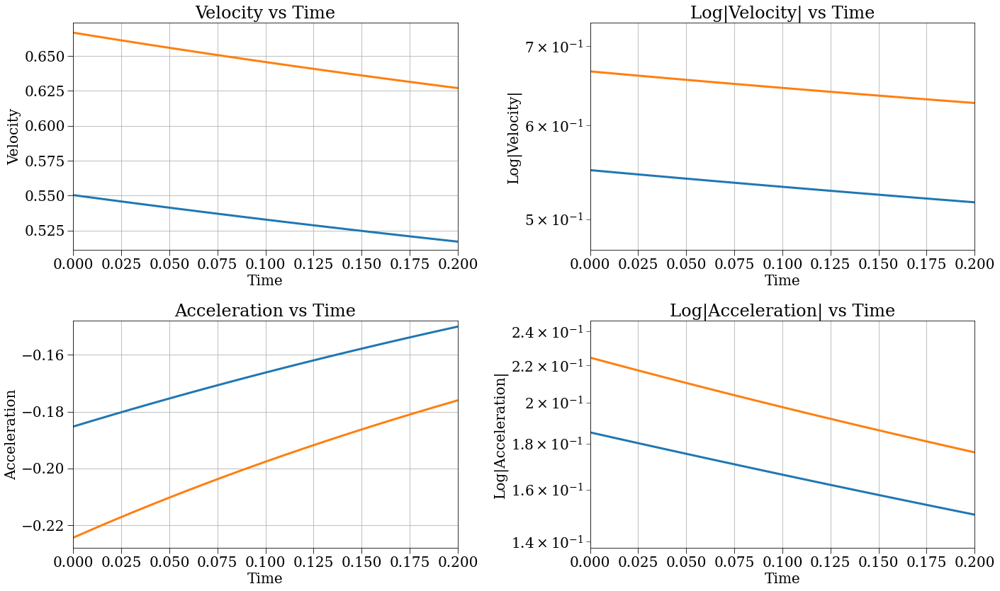

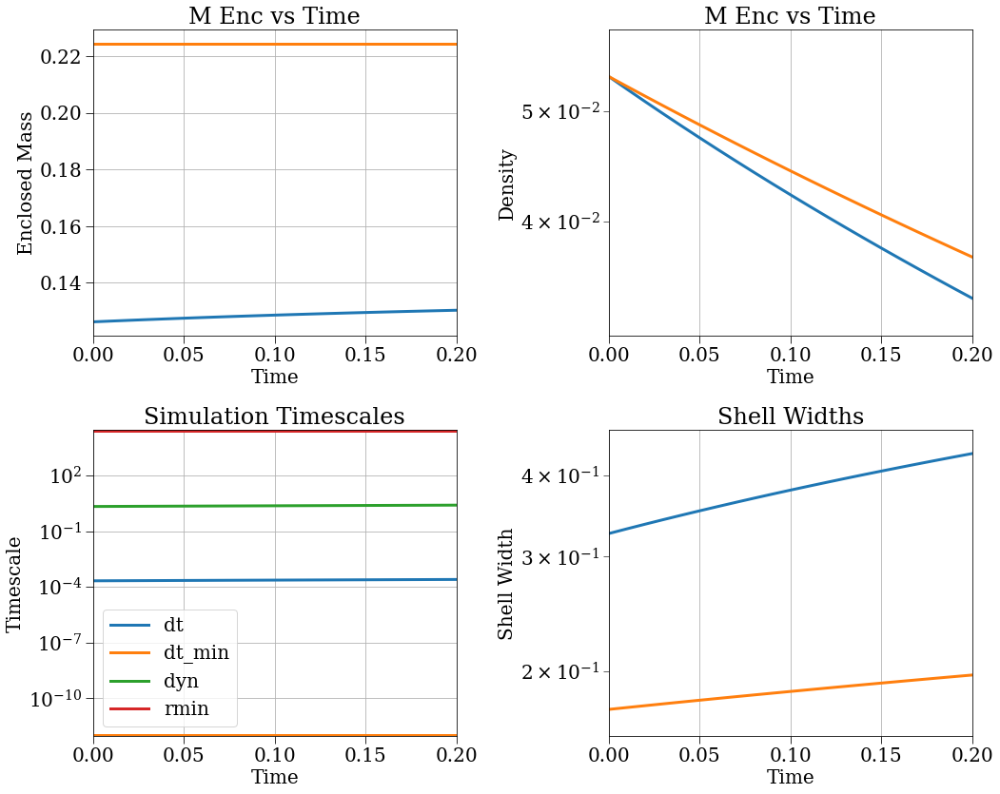

/home/jsipple/one_d_spherical_collapse/one-d-spherical-collapse-of-fuzzy-dark-matter/src/plotting.py:540: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
/home/jsipple/.conda/envs/jsipple/lib/python3.7/site-packages/IPython/core/pylabtools.py:128: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


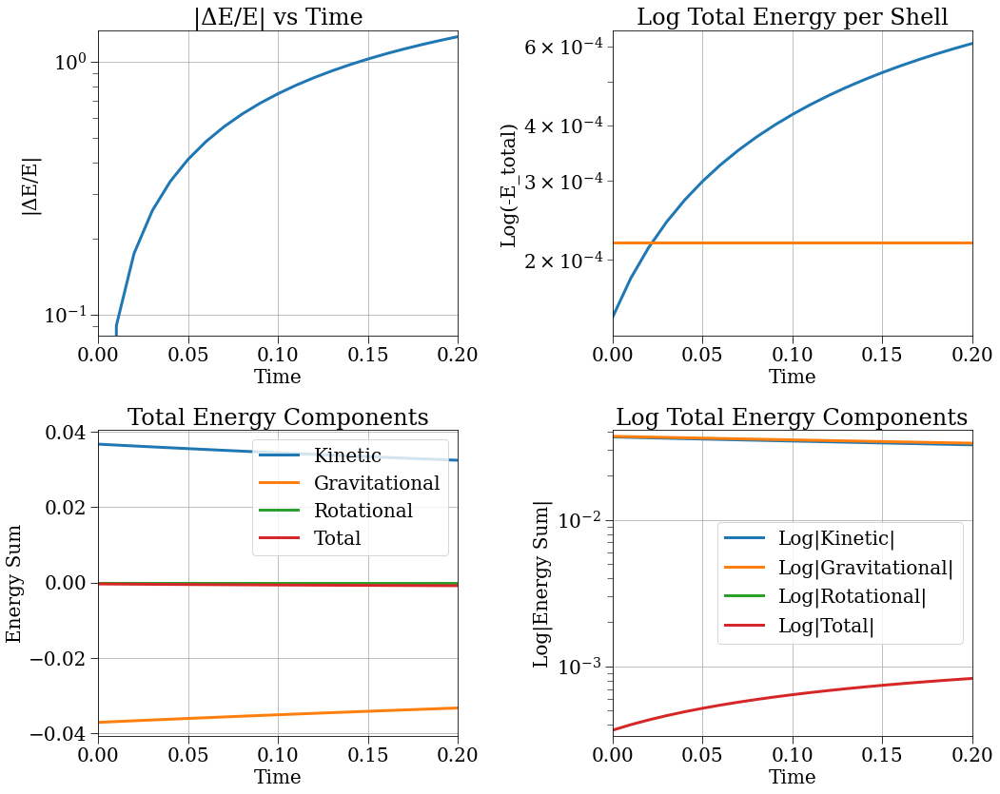

In [48]:
t_center = 0.1
window = 0.1  # Adjust this value to control zoom level
t_min = t_center - window
t_max = t_center + window

# Add time window to all plots using a custom shell configuration
shell_config = PlotConfig(
    property_name='',
    xlim=(t_min, t_max)
)

# Generate all plots with the time window
plotter.plot_radius_analysis(shell_config)
plotter.plot_velocity_acceleration(shell_config)
plotter.plot_mass_density_timescales(shell_config)
plotter.plot_energy_analysis(shell_config)

2025-01-23 10:02:31,998 - collapse - INFO - Simulation setup complete


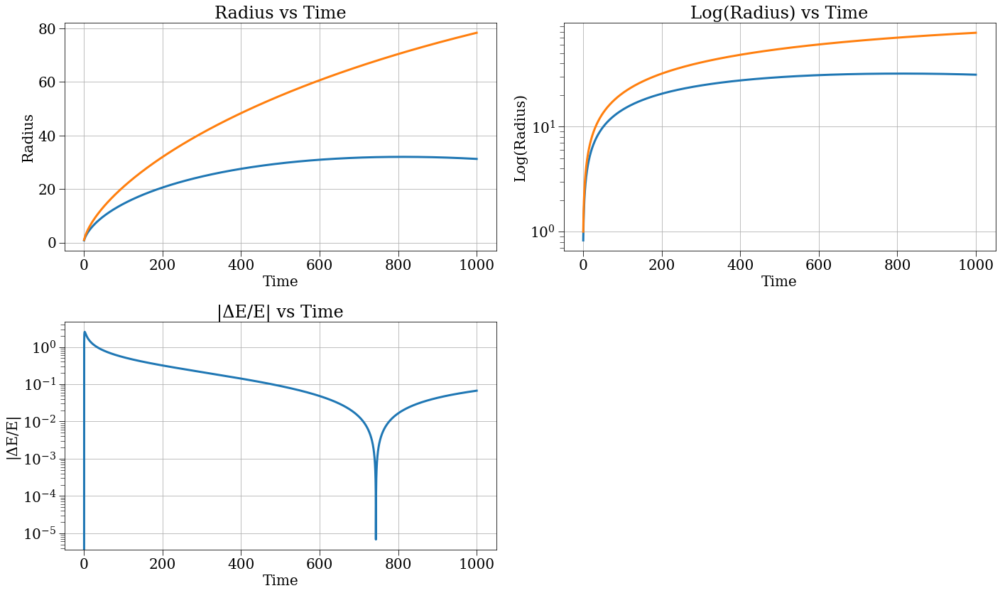

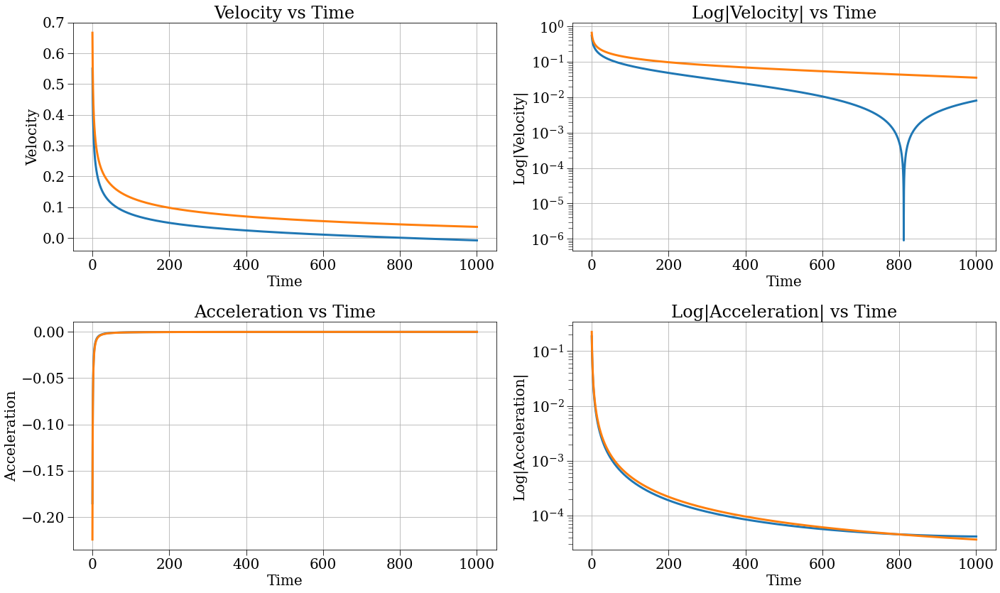

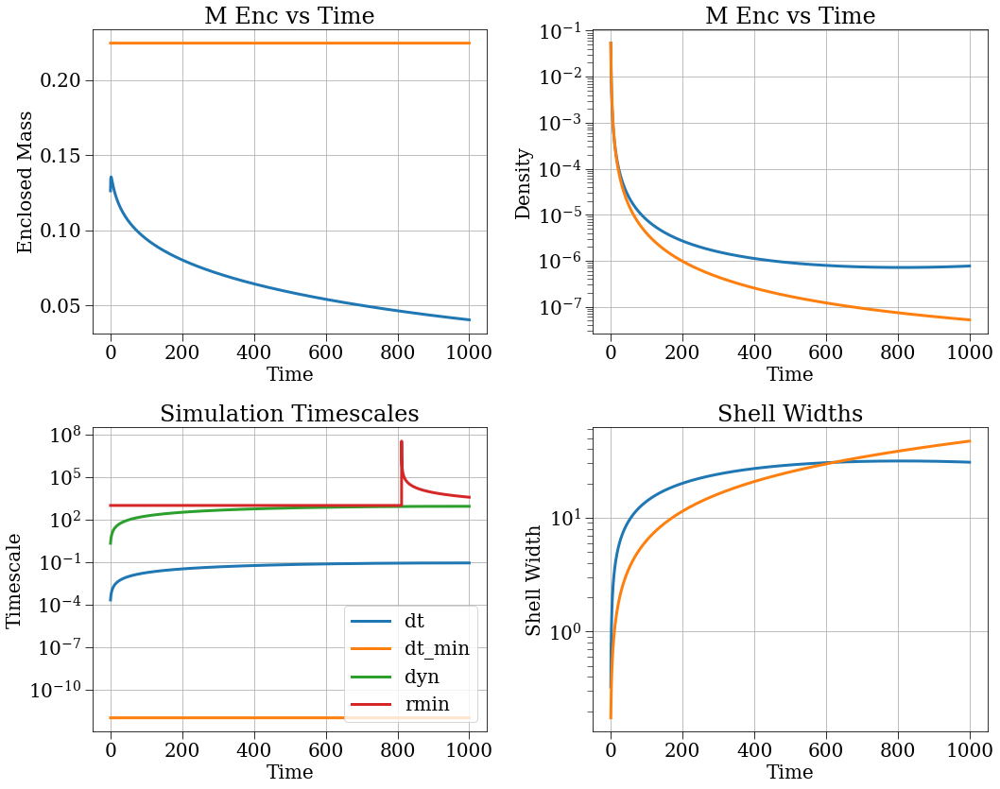

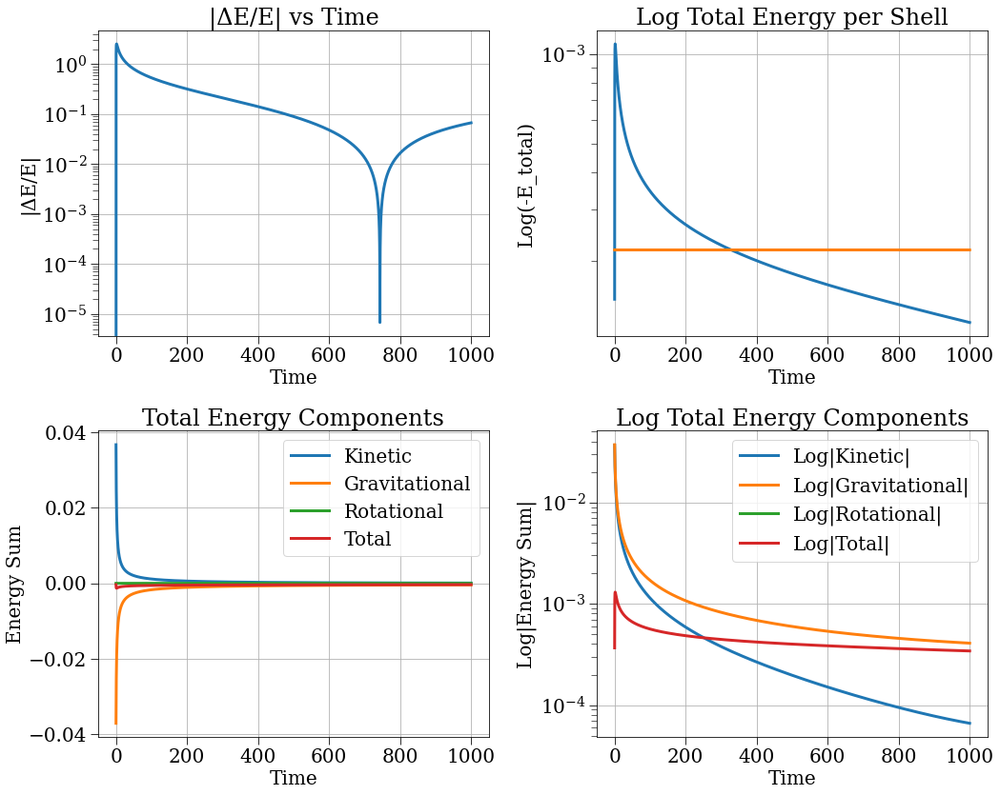

In [10]:
sc = SphericalCollapse(neighbor2_config2_save)
results = sc.run()
plotter = SimulationPlotter(results, sc)

# Configuration 1: Radius analysis
plotter.plot_radius_analysis()

# Configuration 2: Velocity and acceleration analysis
plotter.plot_velocity_acceleration()

# Configuration 3: Mass, density, and timescales
plotter.plot_mass_density_timescales()
# Configuration 4: Energy analysis
plotter.plot_energy_analysis()

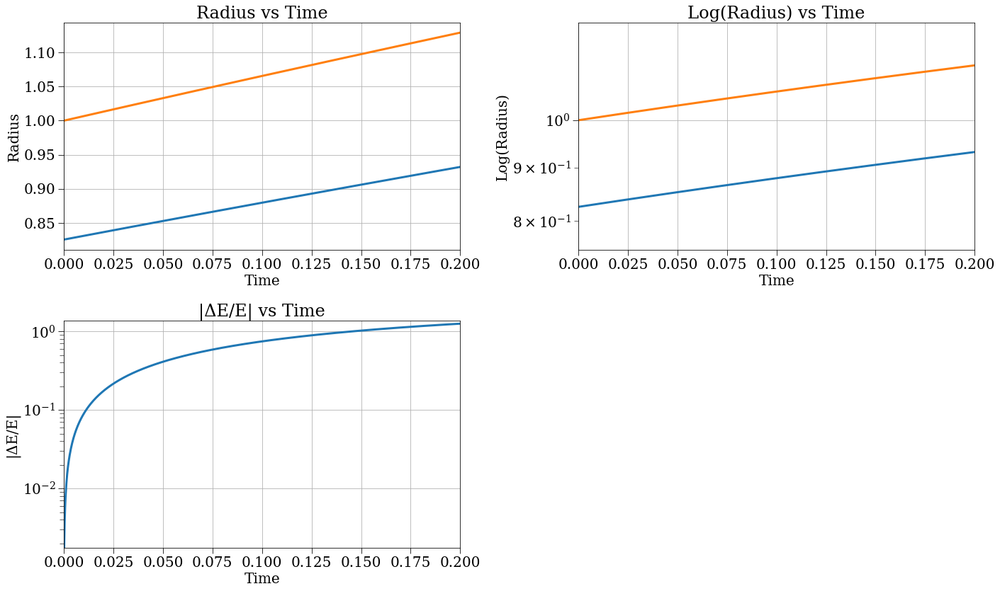

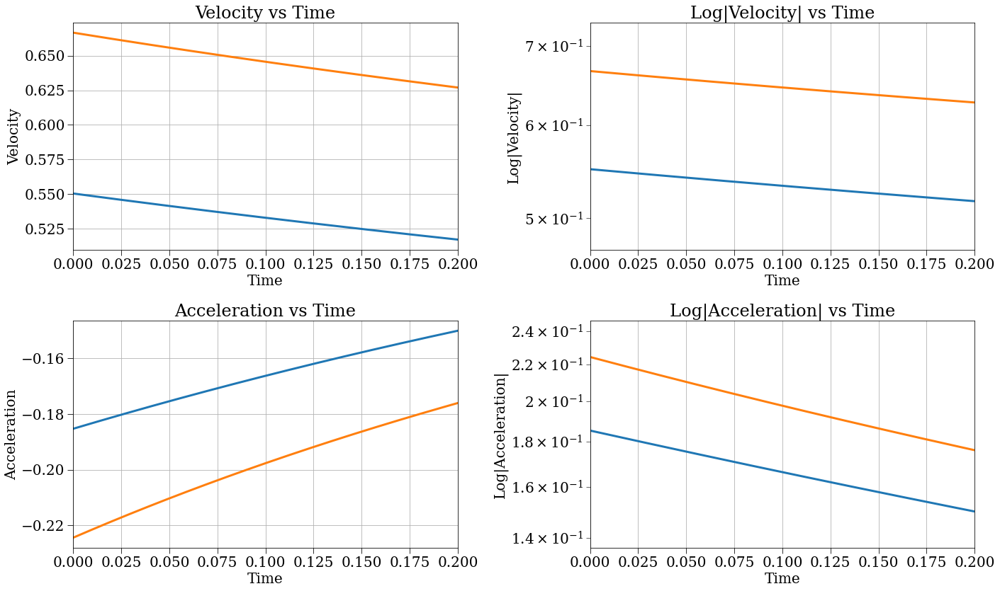

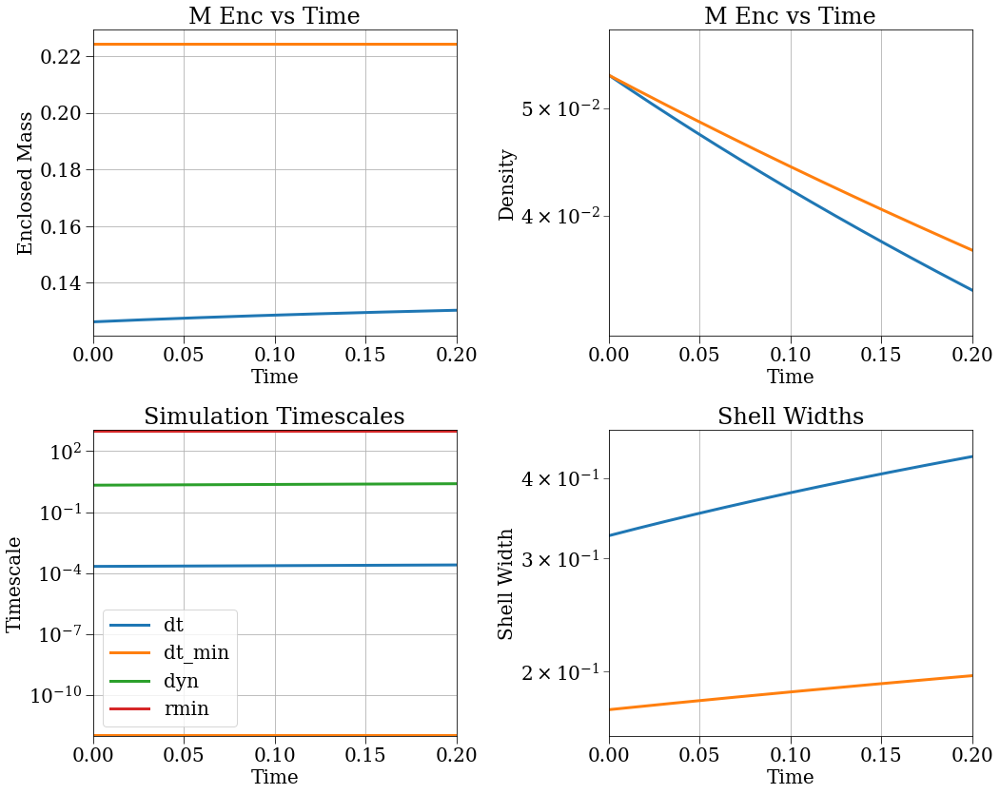

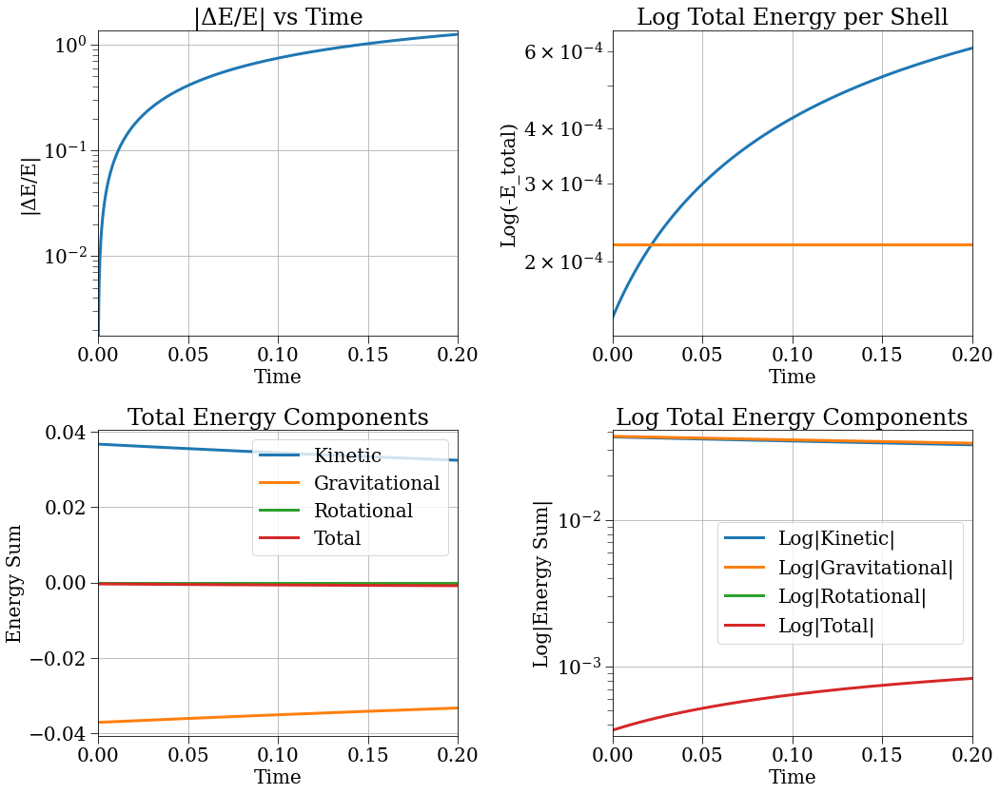

In [13]:
t_center = 0.1
window = 0.1  # Adjust this value to control zoom level
t_min = t_center - window
t_max = t_center + window

# Add time window to all plots using a custom shell configuration
shell_config = PlotConfig(
    property_name='',
    xlim=(t_min, t_max)
)

# Generate all plots with the time window
plotter.plot_radius_analysis(shell_config)
plotter.plot_velocity_acceleration(shell_config)
plotter.plot_mass_density_timescales(shell_config)
plotter.plot_energy_analysis(shell_config)

2025-01-22 23:54:59,933 - collapse - INFO - Simulation setup complete


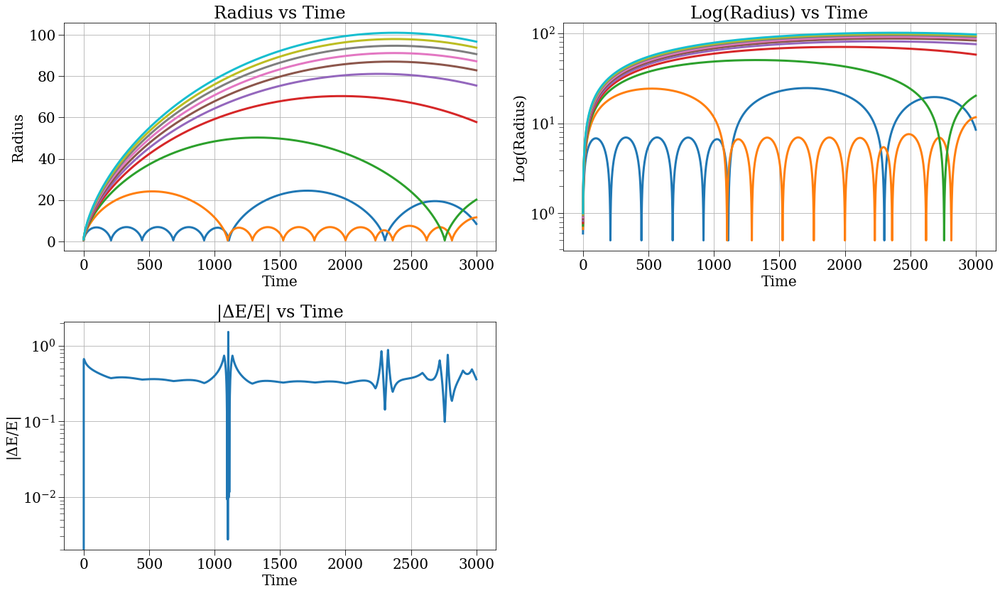

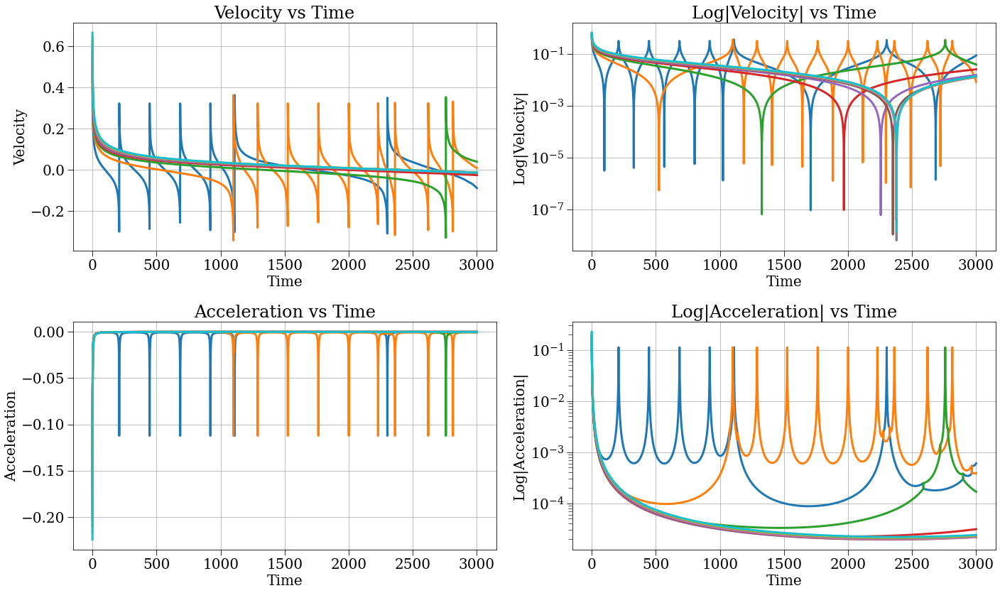

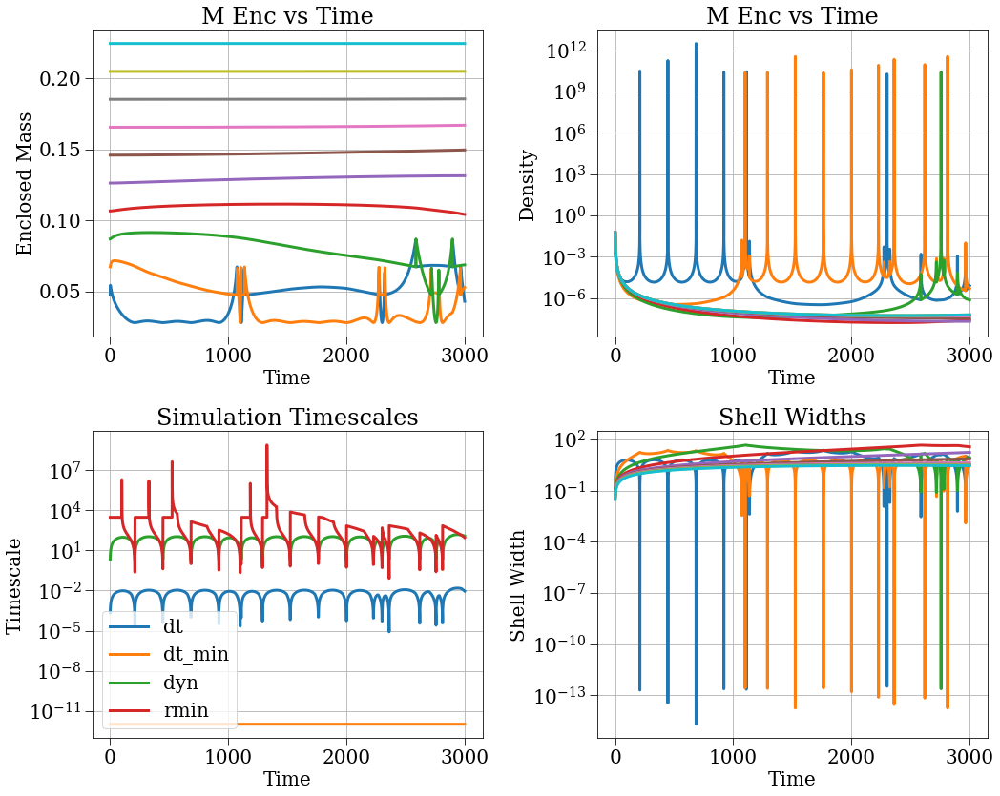

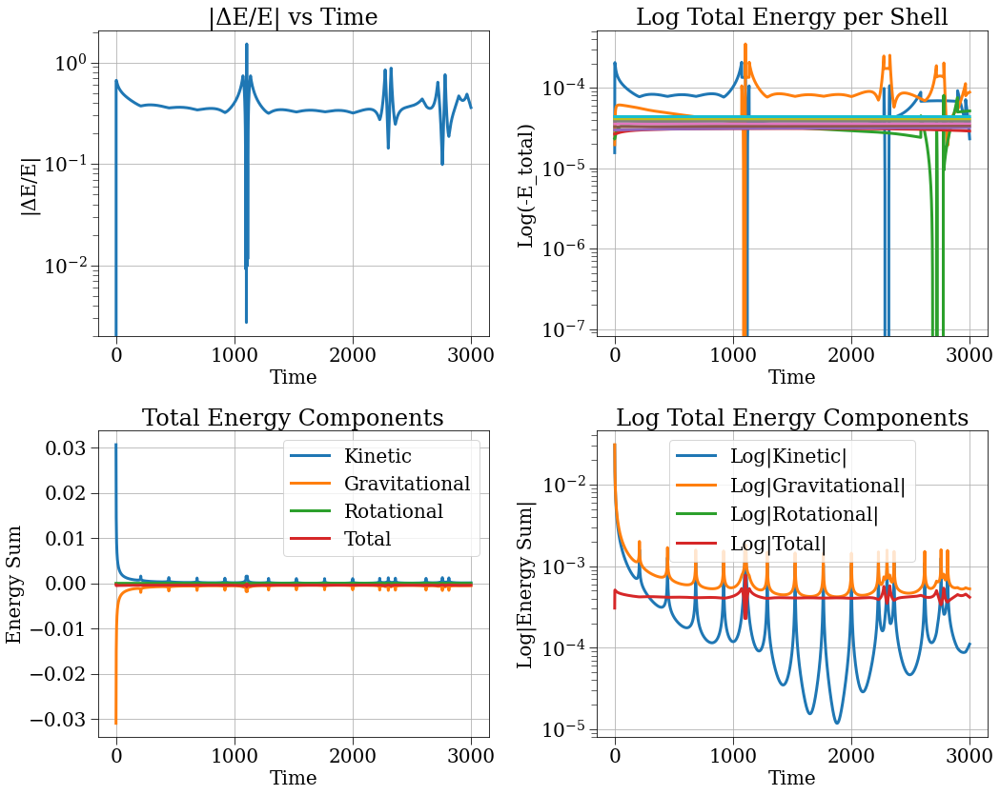

In [50]:
sc = SphericalCollapse(neighbor2_config10)
results = sc.run()
plotter = SimulationPlotter(results, sc)

# Configuration 1: Radius analysis
plotter.plot_radius_analysis()

# Configuration 2: Velocity and acceleration analysis
plotter.plot_velocity_acceleration()

# Configuration 3: Mass, density, and timescales
plotter.plot_mass_density_timescales()
# Configuration 4: Energy analysis
plotter.plot_energy_analysis()

2025-01-24 11:04:19,829 - collapse - INFO - Simulation setup complete


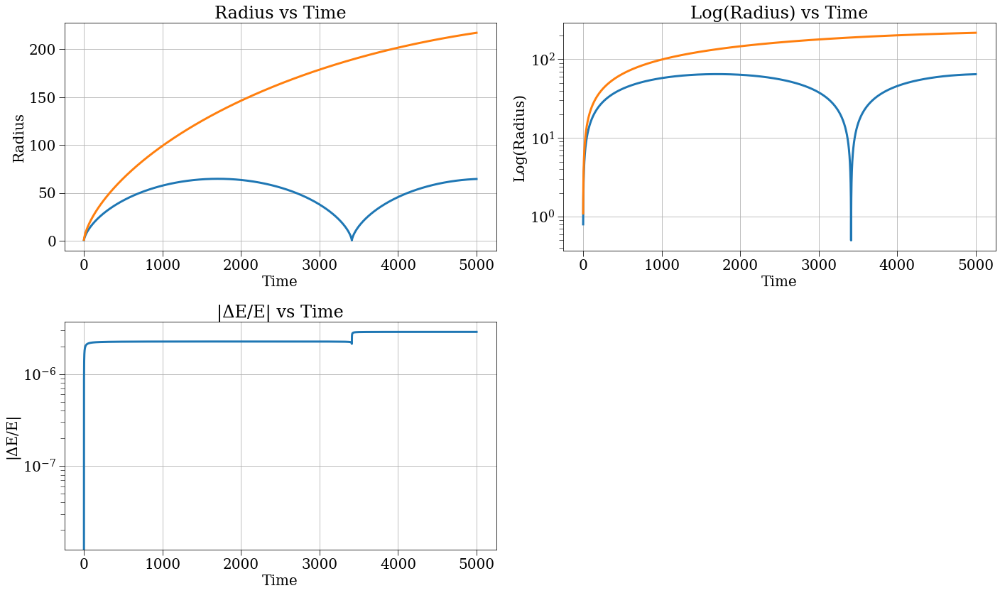

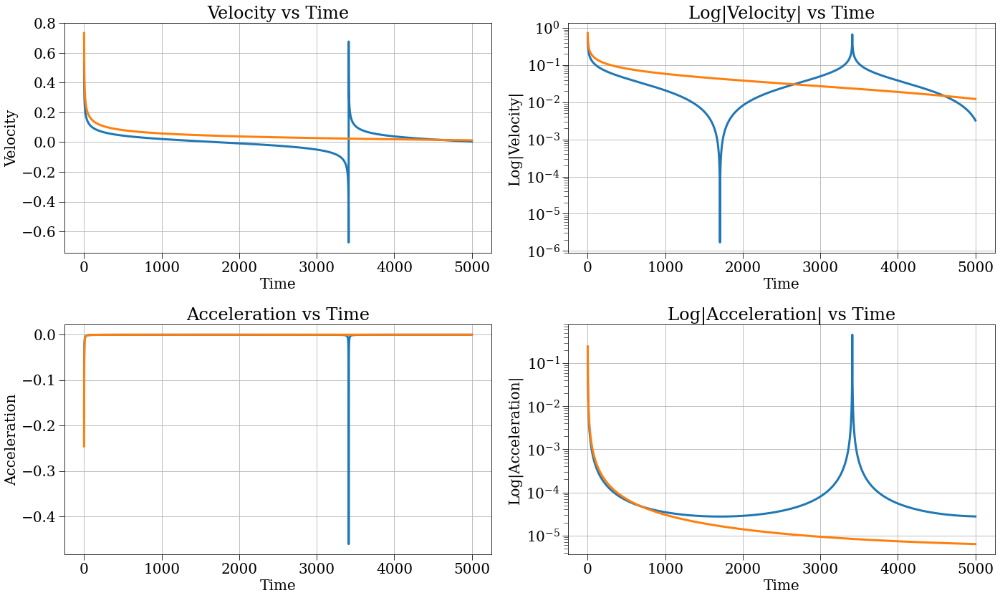

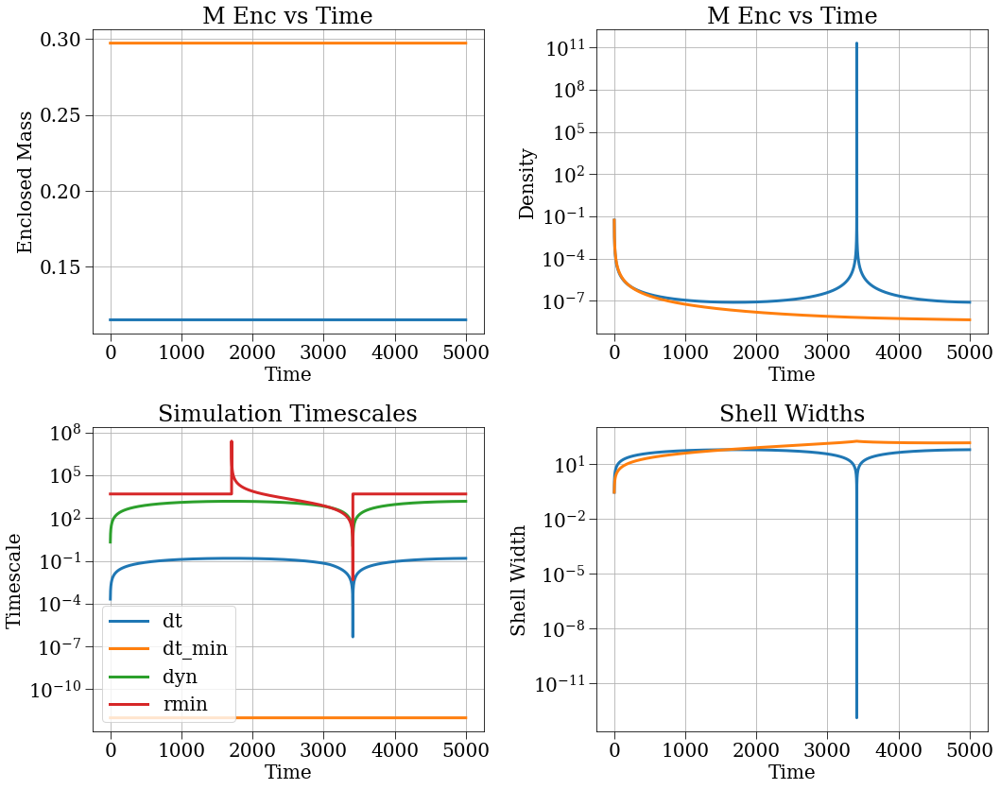

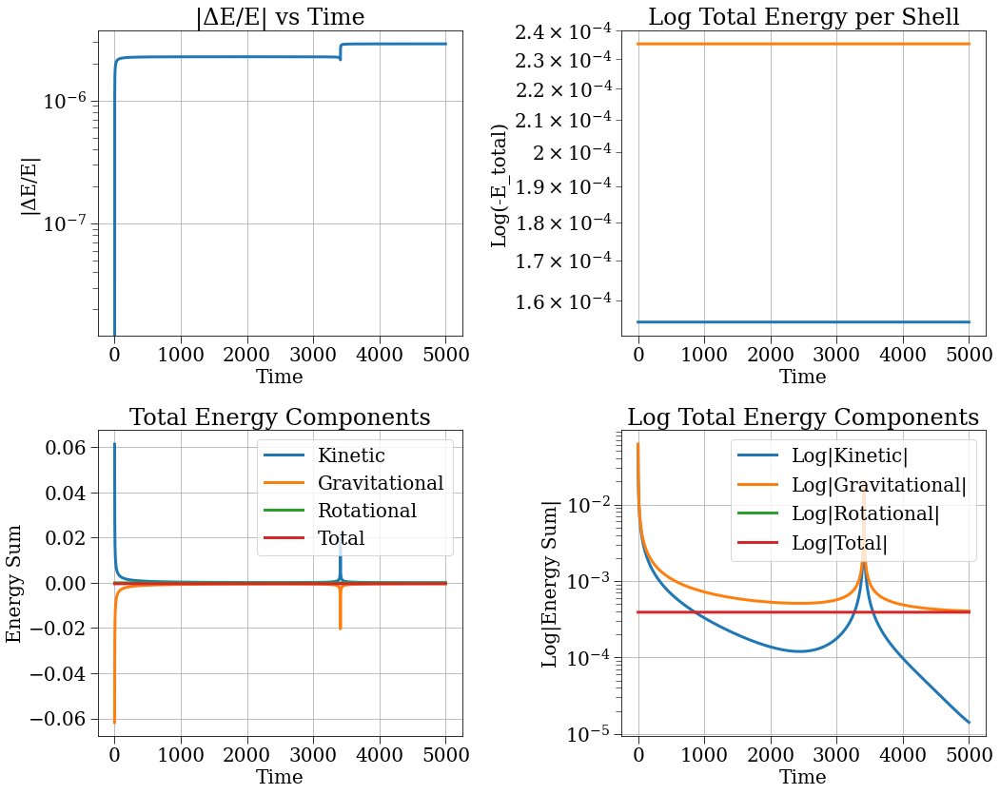

In [9]:
sc = SphericalCollapse(pressure_config2)
results = sc.run()
plotter = SimulationPlotter(results, sc)

# Configuration 1: Radius analysis
plotter.plot_radius_analysis()

# Configuration 2: Velocity and acceleration analysis
plotter.plot_velocity_acceleration()

# Configuration 3: Mass, density, and timescales
plotter.plot_mass_density_timescales()
# Configuration 4: Energy analysis
plotter.plot_energy_analysis()

2025-01-22 23:12:57,983 - collapse - INFO - Simulation setup complete


/home/jsipple/one_d_spherical_collapse/one-d-spherical-collapse-of-fuzzy-dark-matter/src/simulation_strategies.py:293: RuntimeWarning: divide by zero encountered in true_divide
  return sim.m / volumes


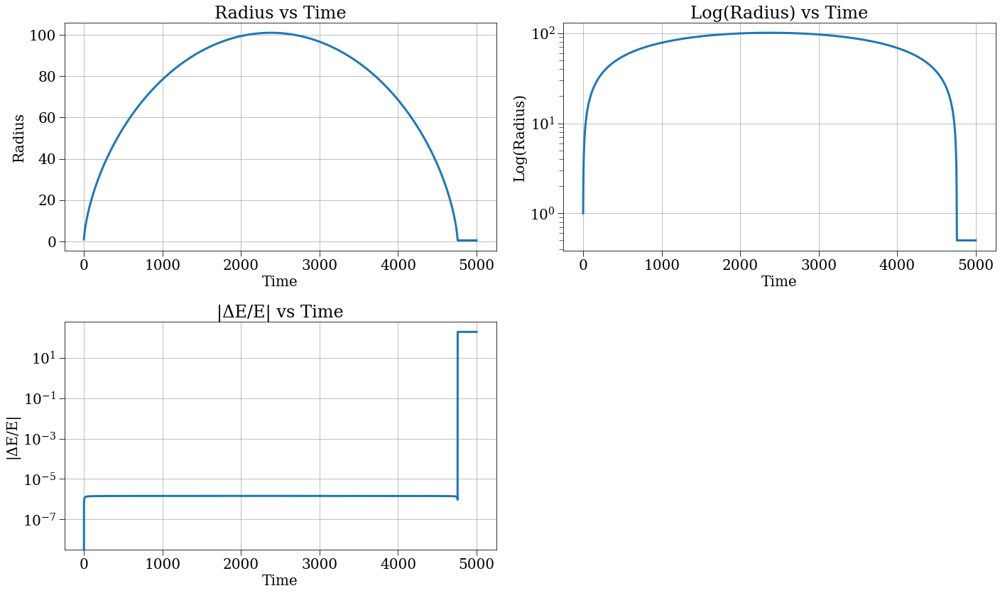

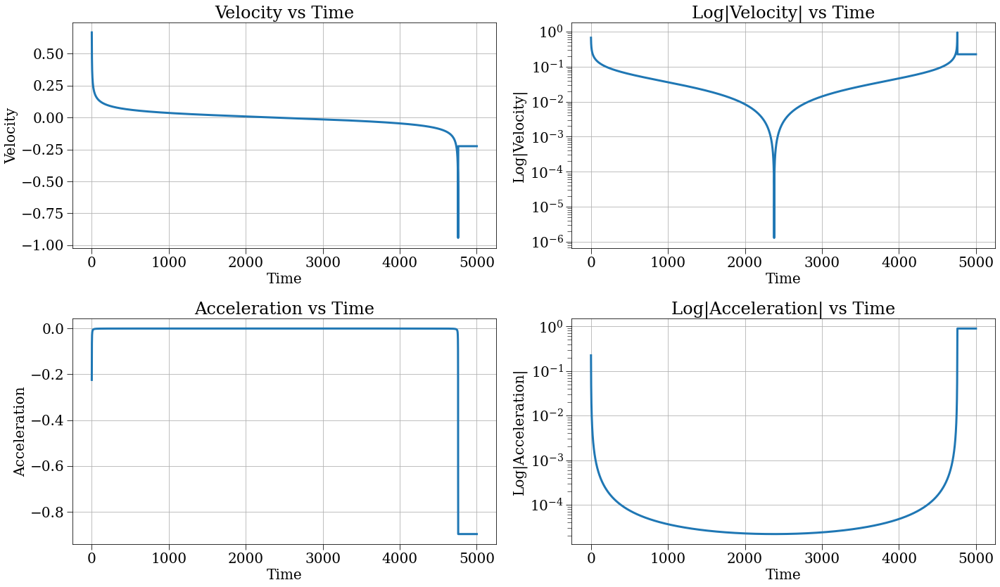

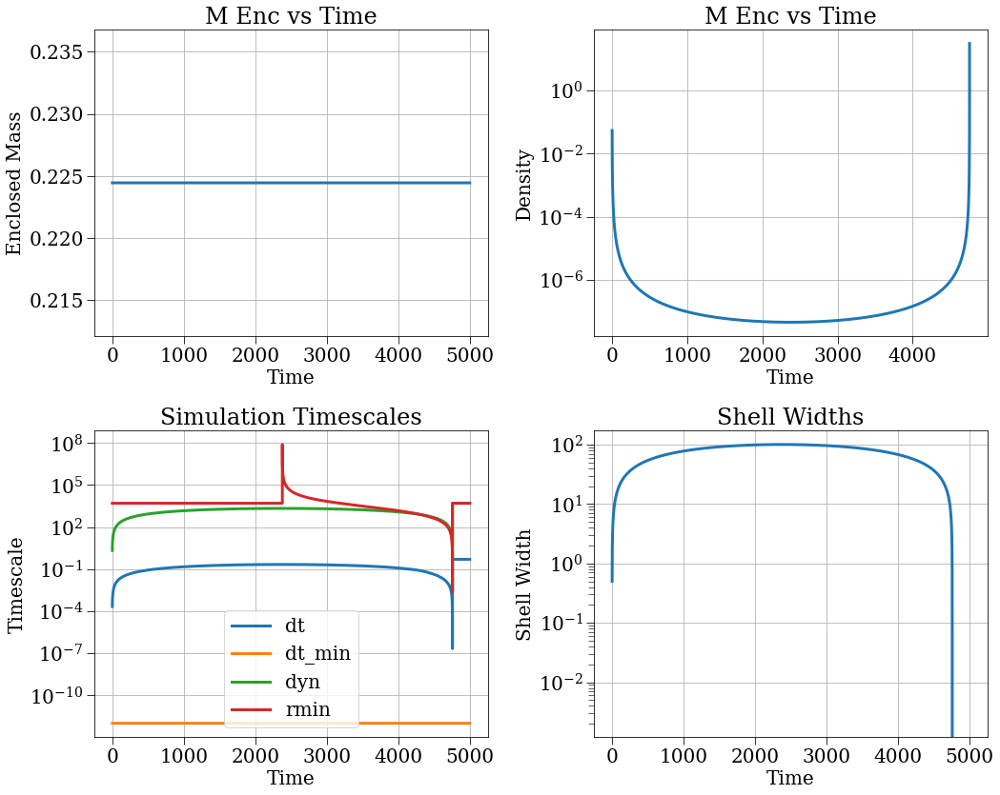

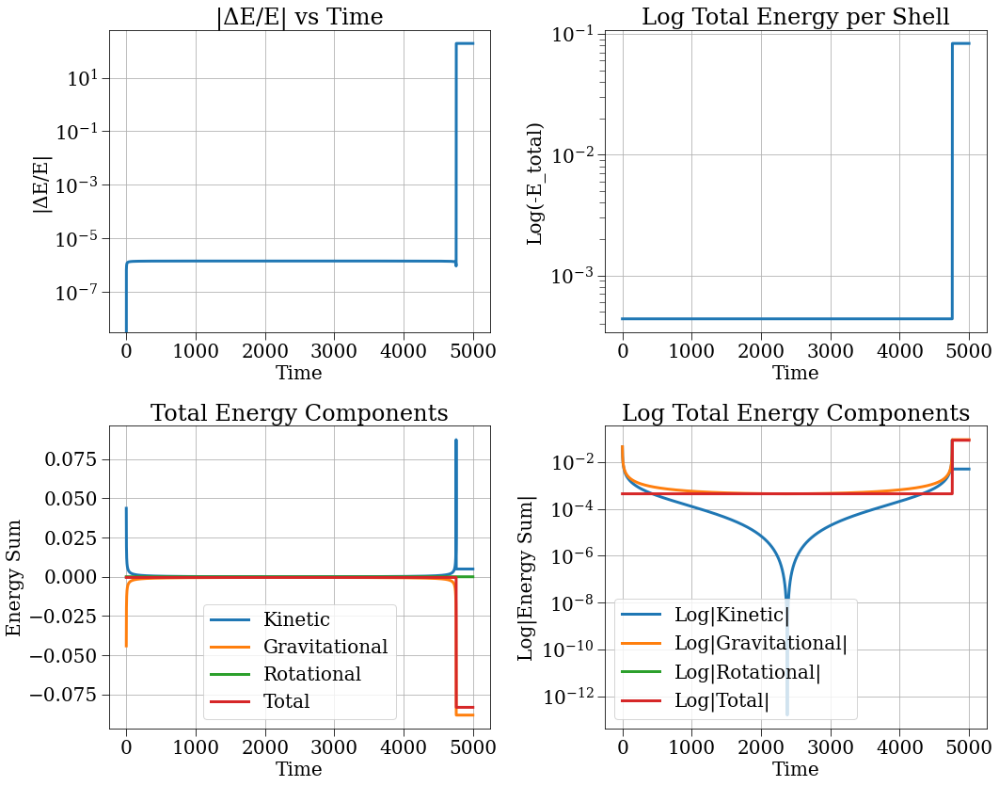

In [34]:
sc = SphericalCollapse(pressure_config)
results = sc.run()
plotter = SimulationPlotter(results, sc)

# Configuration 1: Radius analysis
plotter.plot_radius_analysis()

# Configuration 2: Velocity and acceleration analysis
plotter.plot_velocity_acceleration()

# Configuration 3: Mass, density, and timescales
plotter.plot_mass_density_timescales()
# Configuration 4: Energy analysis
plotter.plot_energy_analysis()

2025-01-24 11:16:19,642 - collapse - INFO - Simulation setup complete


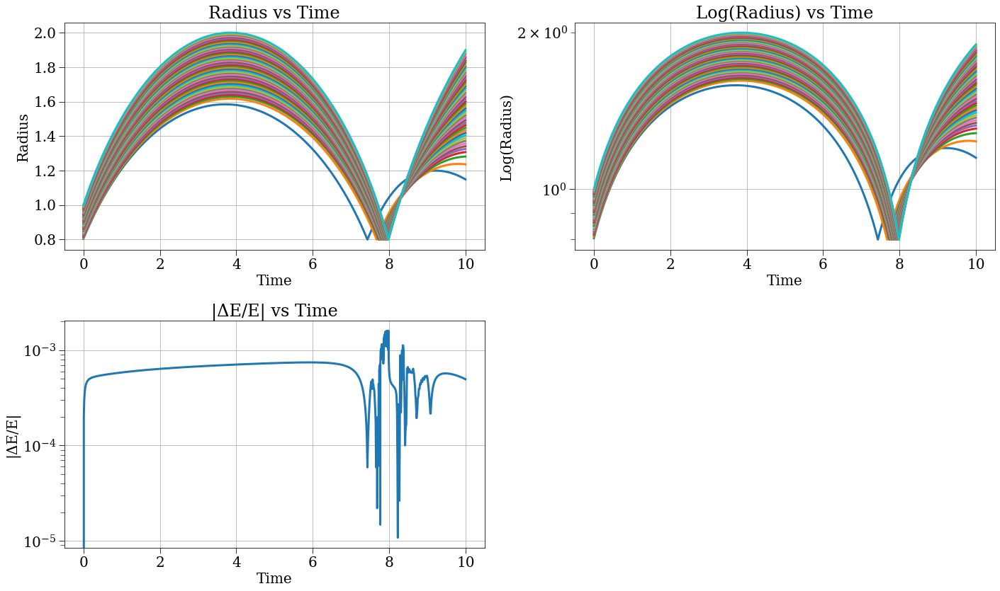

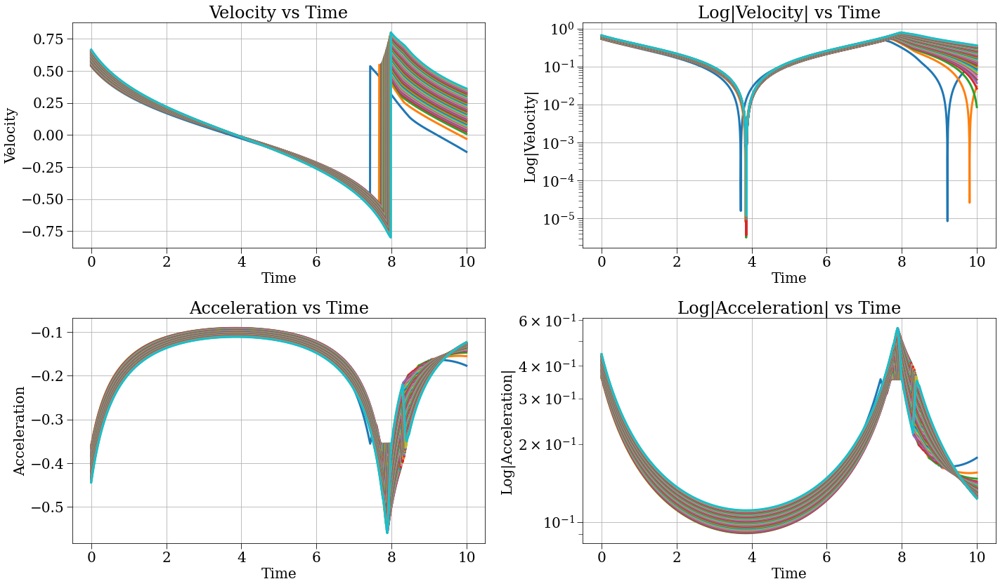

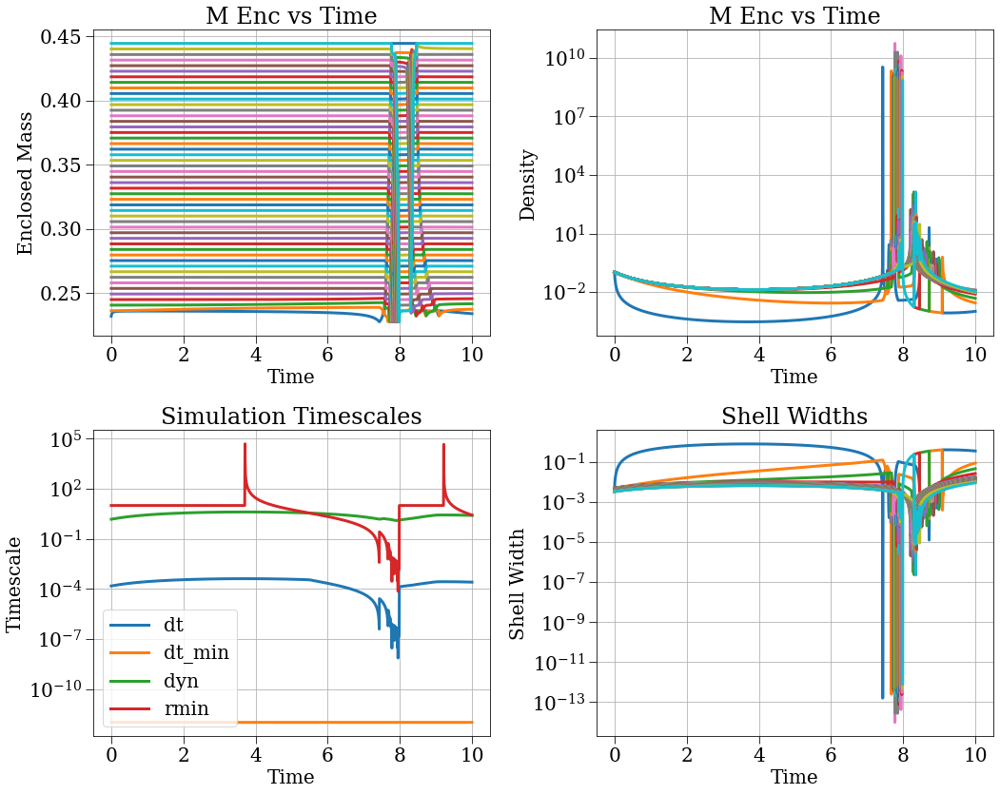

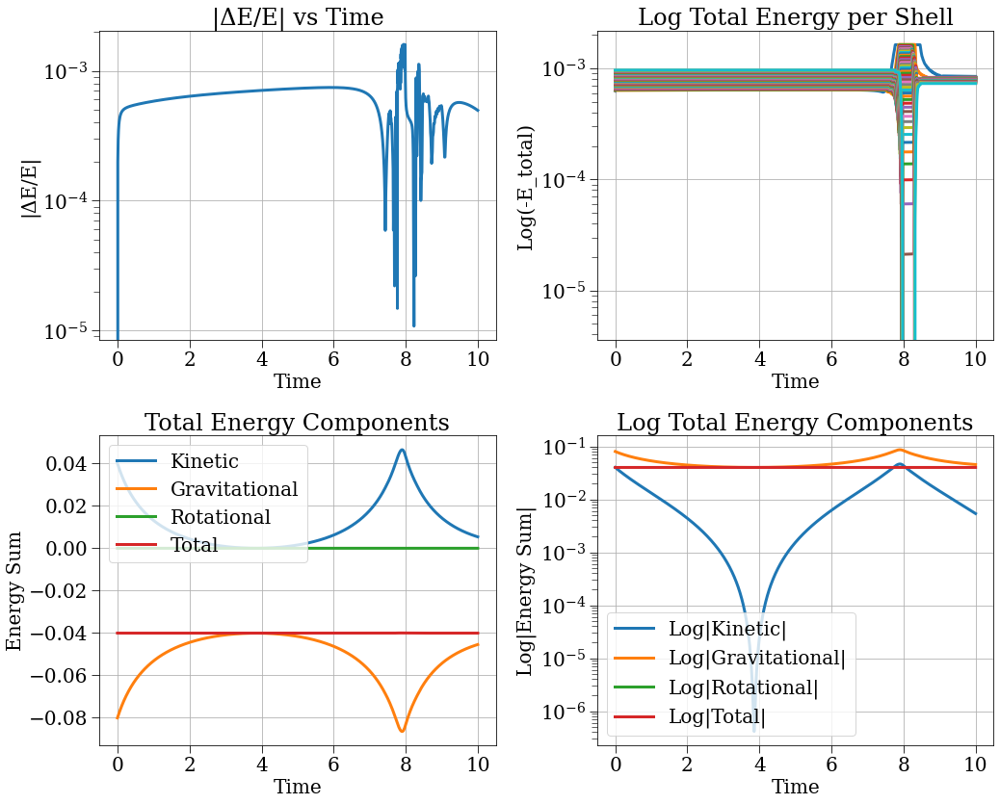

In [16]:
sc = SphericalCollapse(neighbor2_config50)
results = sc.run()
plotter = SimulationPlotter(results, sc)

# Configuration 1: Radius analysis
plotter.plot_radius_analysis()

# Configuration 2: Velocity and acceleration analysis
plotter.plot_velocity_acceleration()

# Configuration 3: Mass, density, and timescales
plotter.plot_mass_density_timescales()
# Configuration 4: Energy analysis
plotter.plot_energy_analysis()

2025-01-24 13:37:59,419 - collapse - INFO - Simulation setup complete


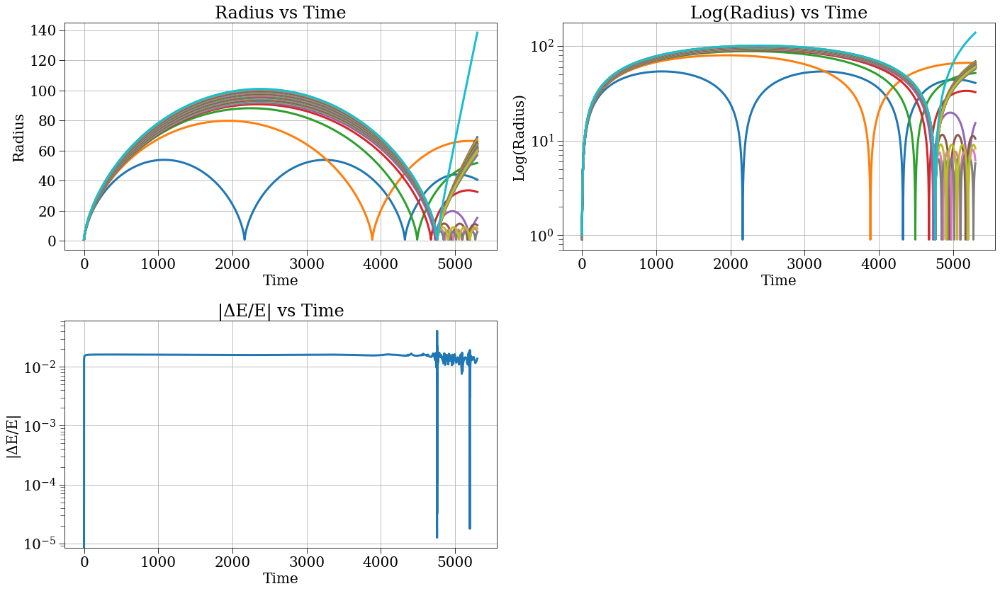

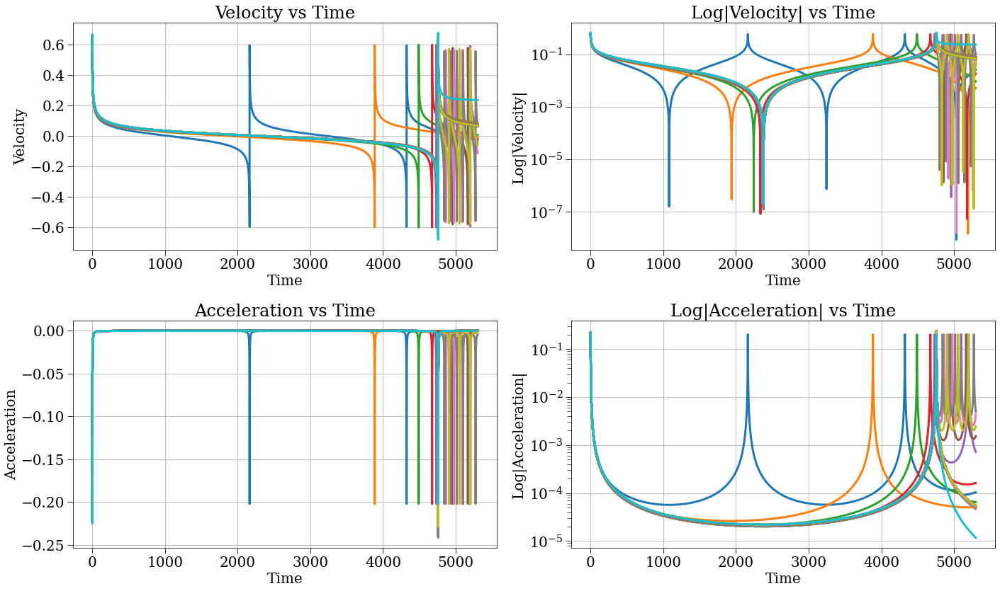

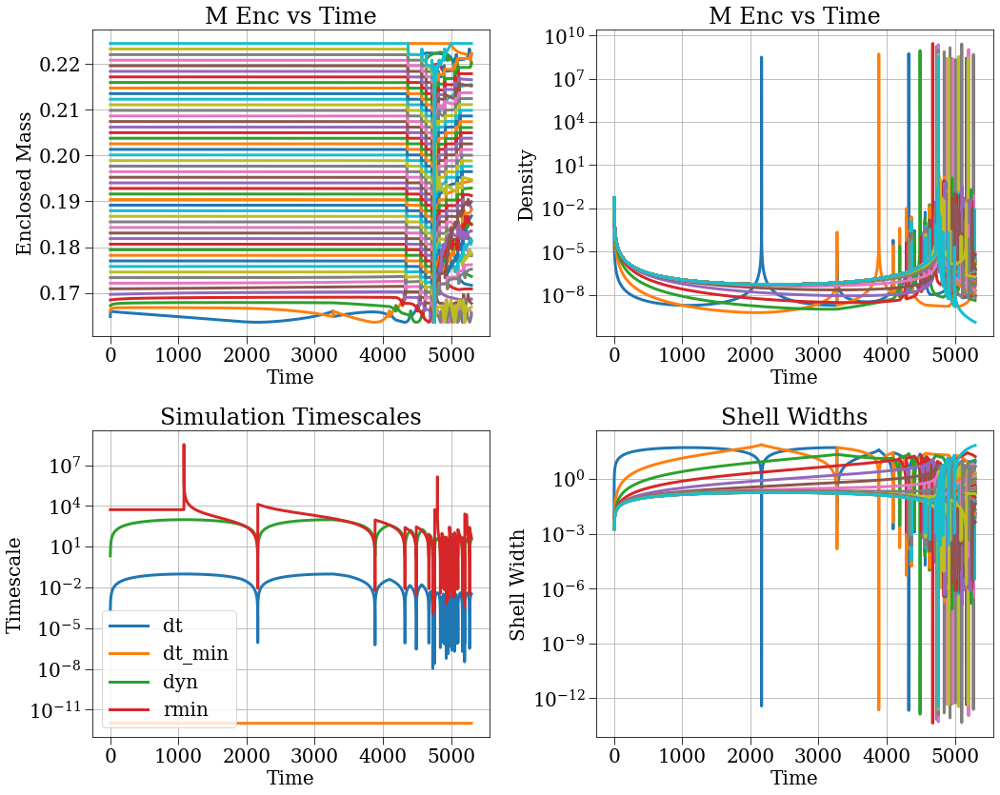

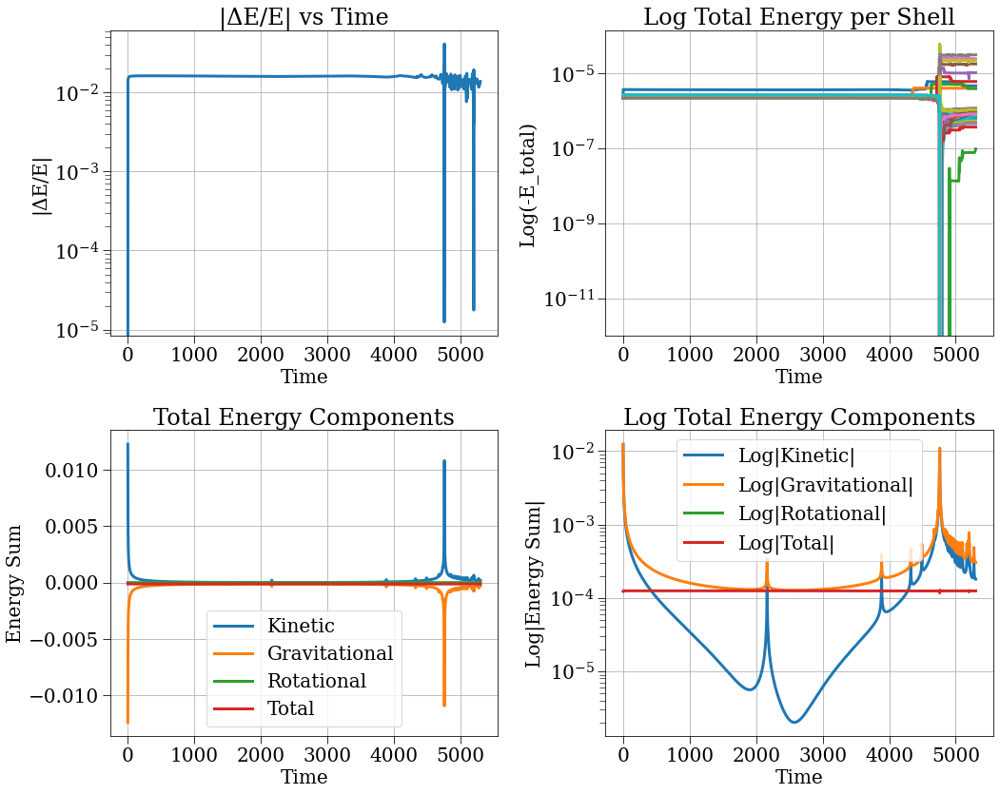

In [7]:
sc = SphericalCollapse(neighbor2_config50)
results = sc.run()
plotter = SimulationPlotter(results, sc)

# Configuration 1: Radius analysis
plotter.plot_radius_analysis()

# Configuration 2: Velocity and acceleration analysis
plotter.plot_velocity_acceleration()

# Configuration 3: Mass, density, and timescales
plotter.plot_mass_density_timescales()
# Configuration 4: Energy analysis
plotter.plot_energy_analysis()

2025-01-24 14:56:51,360 - collapse - INFO - Simulation setup complete


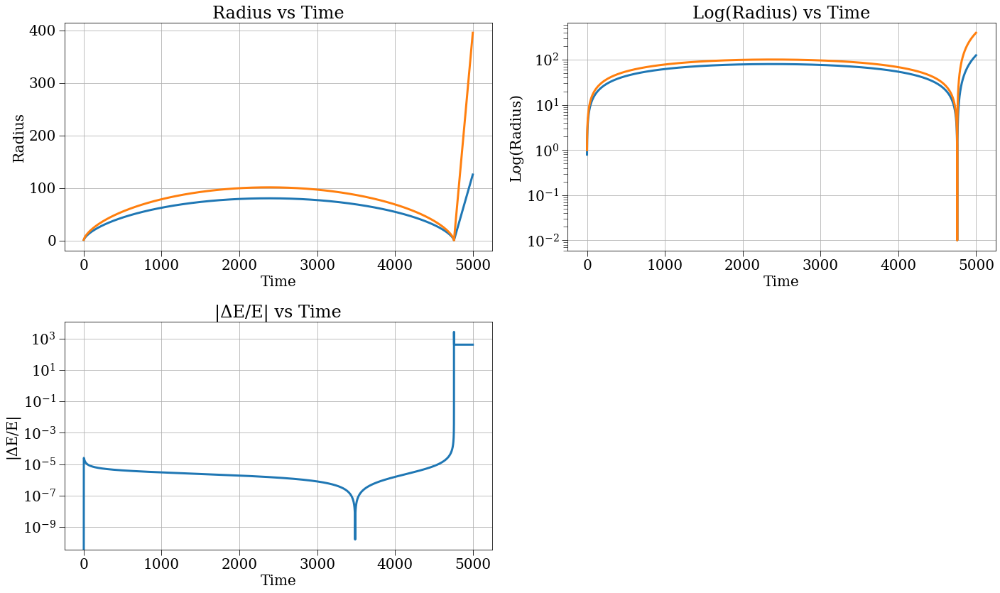

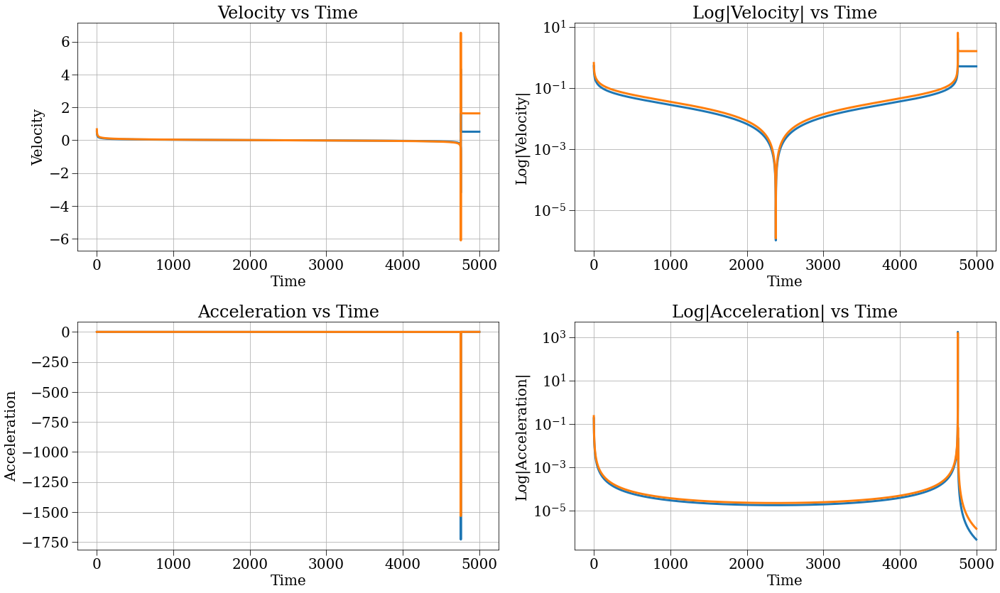

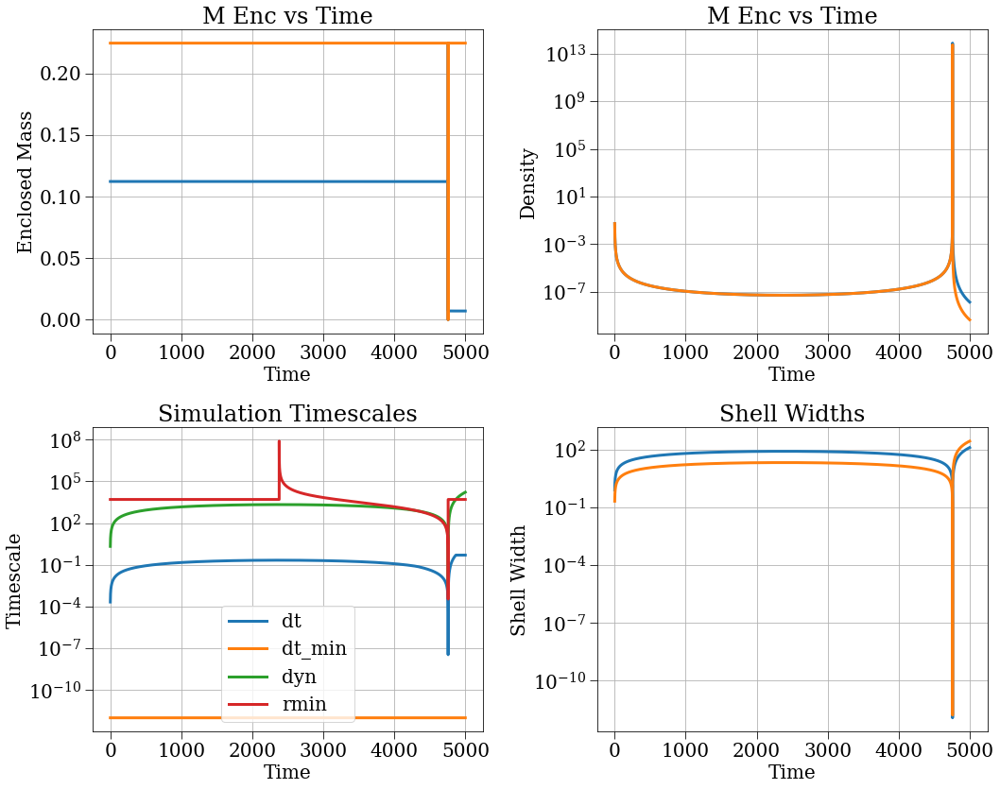

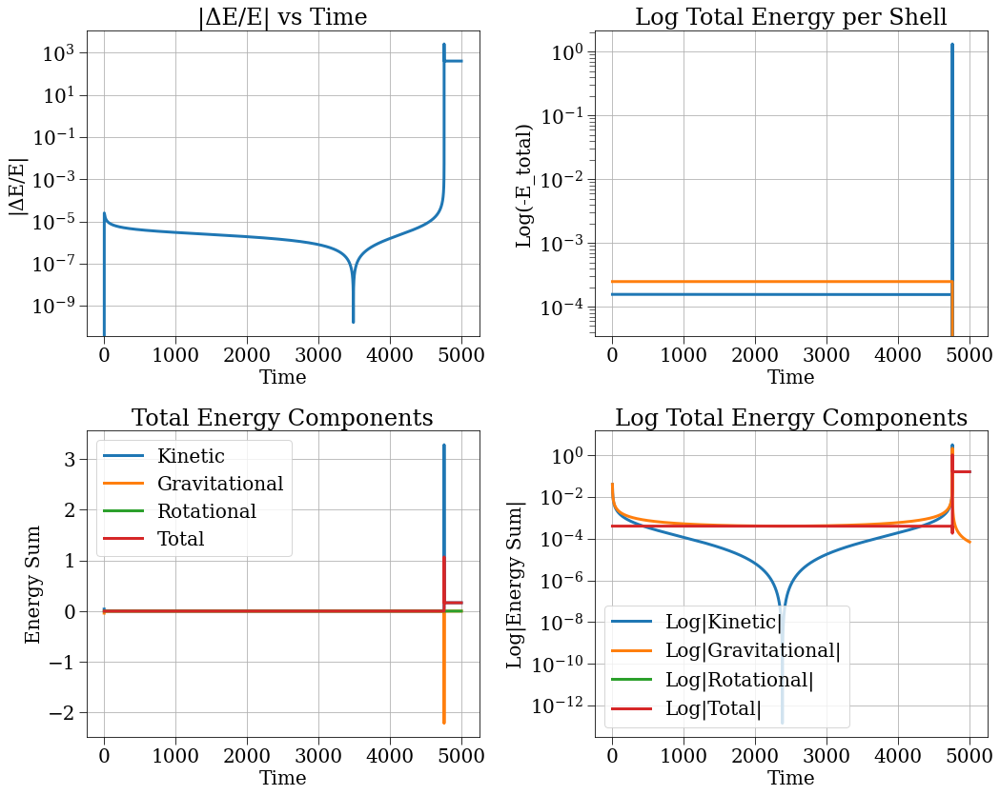

In [14]:
sc = SphericalCollapse(neighbor2_config2_small_min)
results = sc.run()
plotter = SimulationPlotter(results, sc)

# Configuration 1: Radius analysis
plotter.plot_radius_analysis()

# Configuration 2: Velocity and acceleration analysis
plotter.plot_velocity_acceleration()

# Configuration 3: Mass, density, and timescales
plotter.plot_mass_density_timescales()
# Configuration 4: Energy analysis
plotter.plot_energy_analysis()

2025-01-24 15:02:12,232 - collapse - INFO - Simulation setup complete


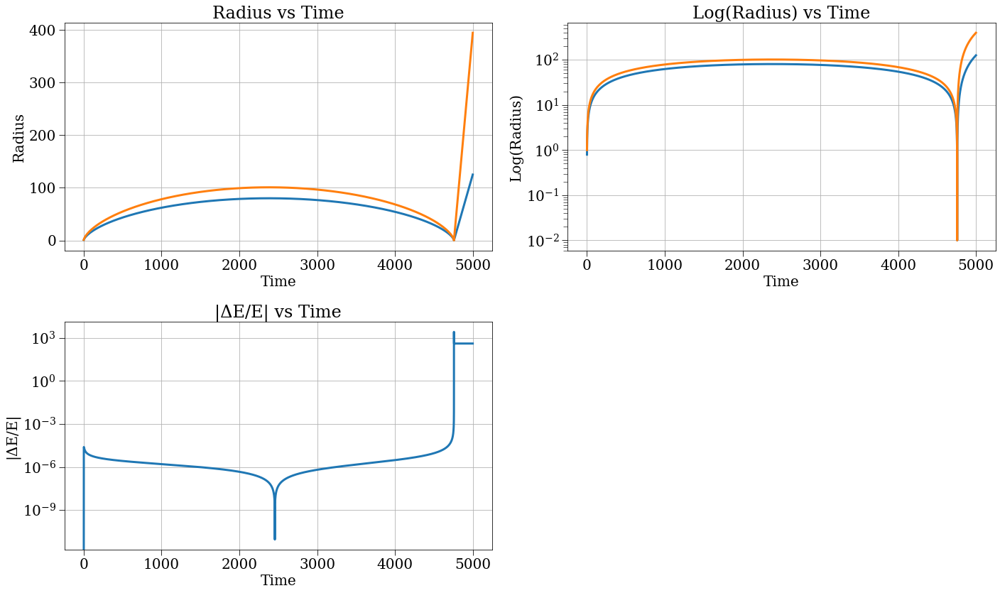

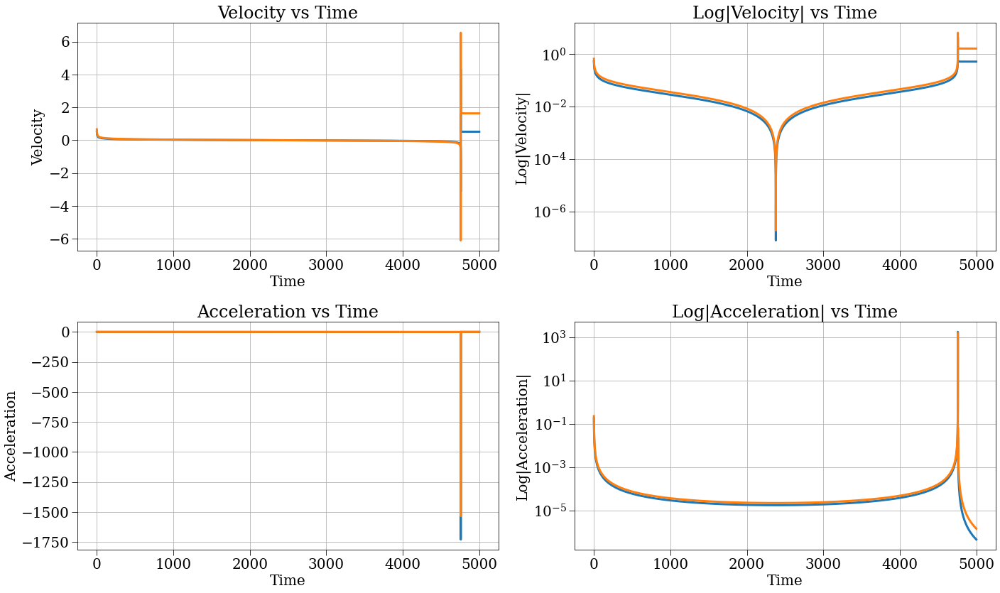

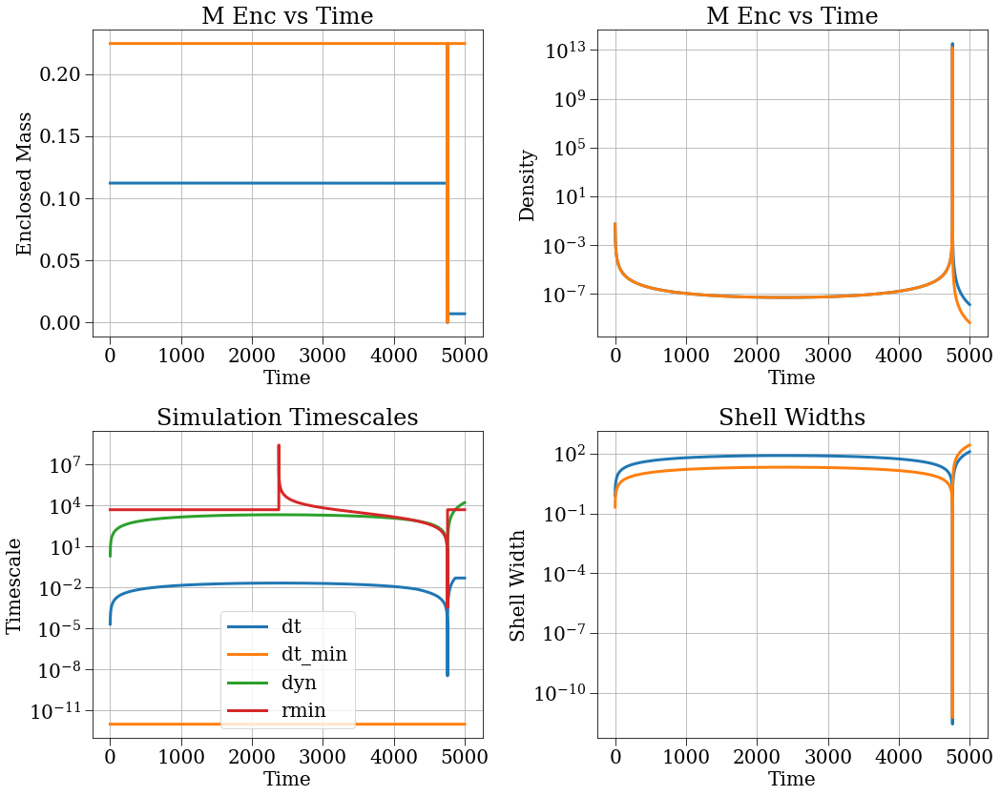

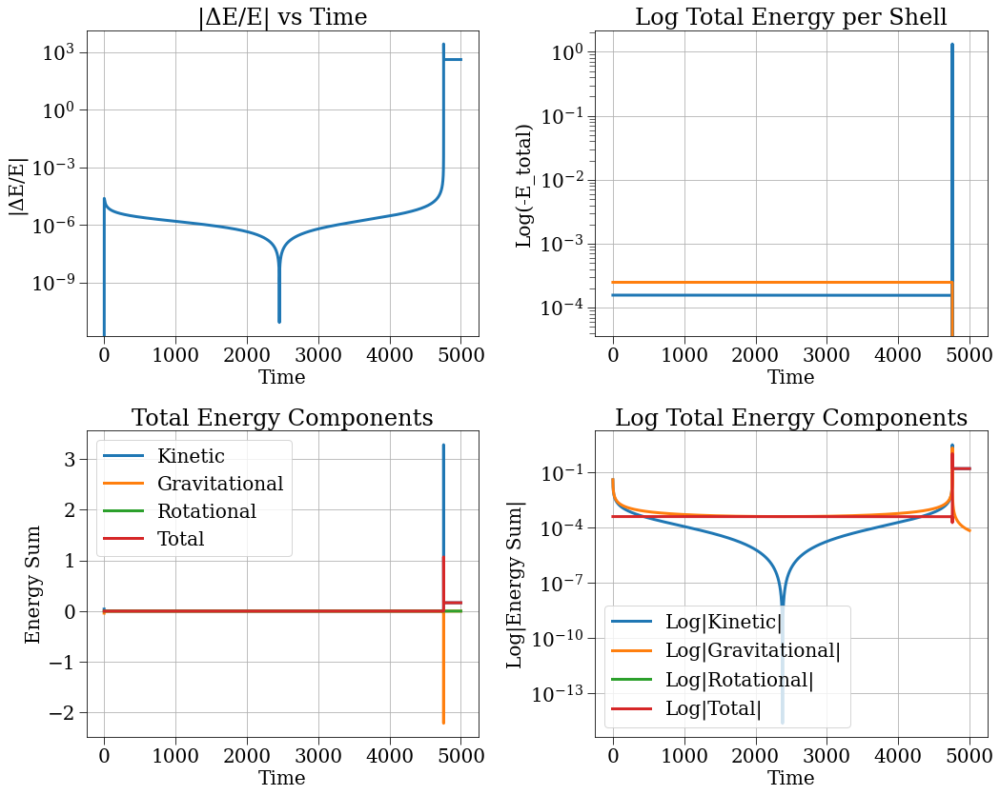

In [16]:
sc = SphericalCollapse(neighbor2_config2_small_min)
results = sc.run()
plotter = SimulationPlotter(results, sc)

# Configuration 1: Radius analysis
plotter.plot_radius_analysis()

# Configuration 2: Velocity and acceleration analysis
plotter.plot_velocity_acceleration()

# Configuration 3: Mass, density, and timescales
plotter.plot_mass_density_timescales()
# Configuration 4: Energy analysis
plotter.plot_energy_analysis()

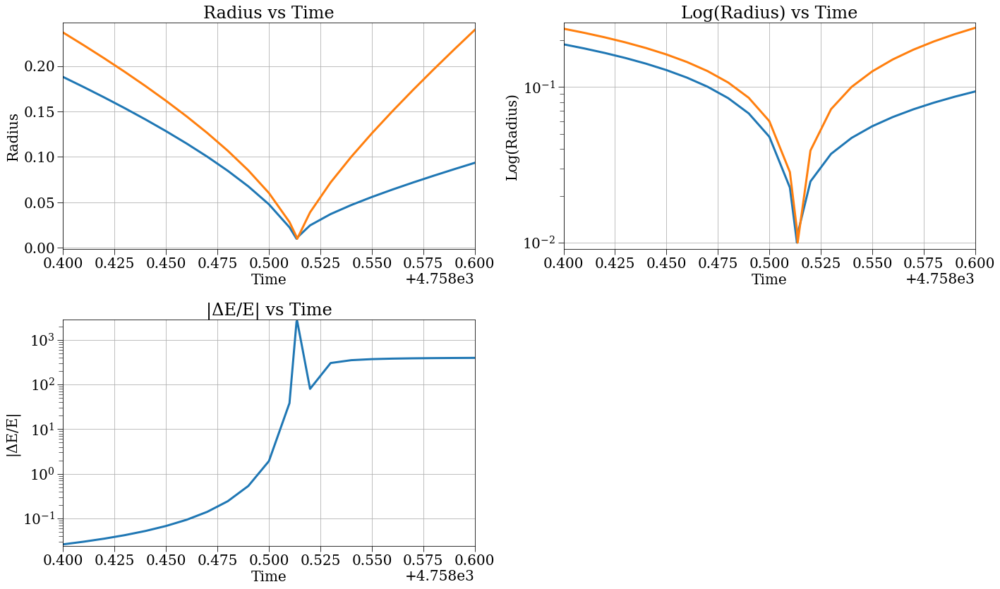

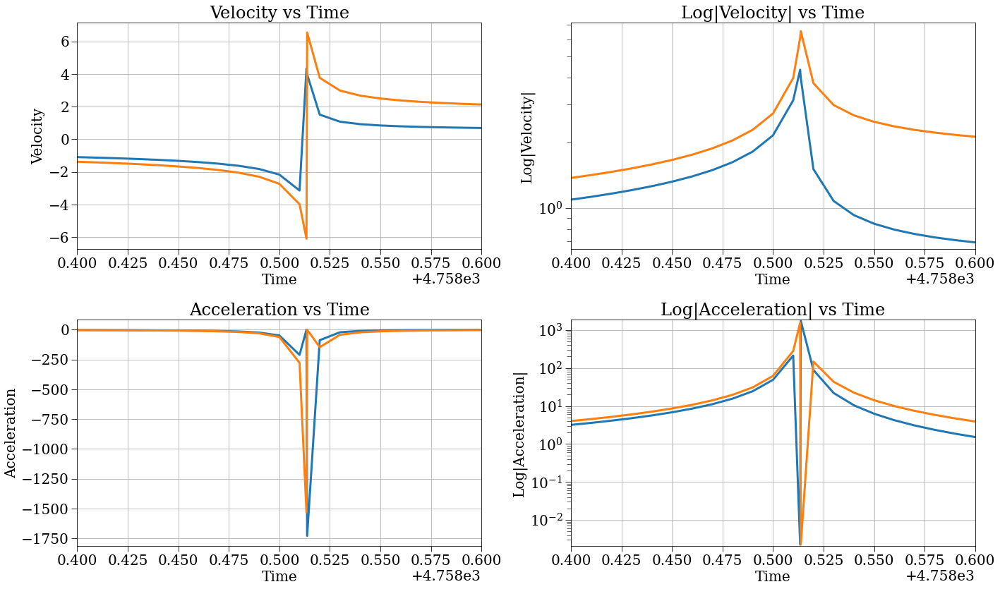

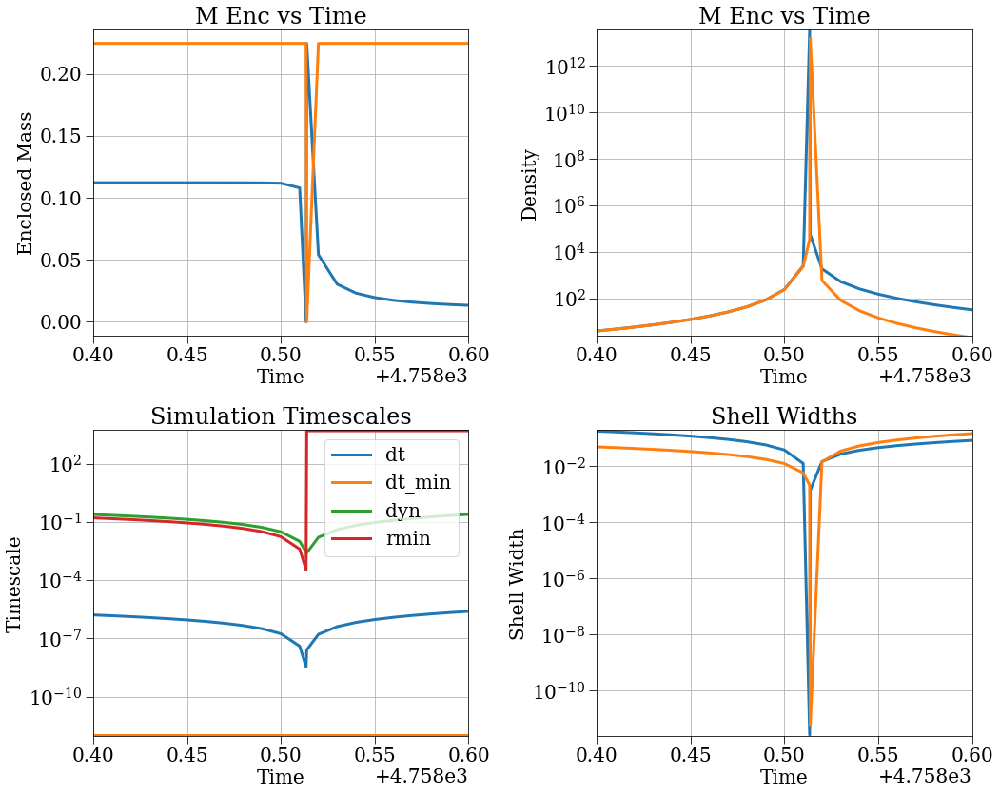

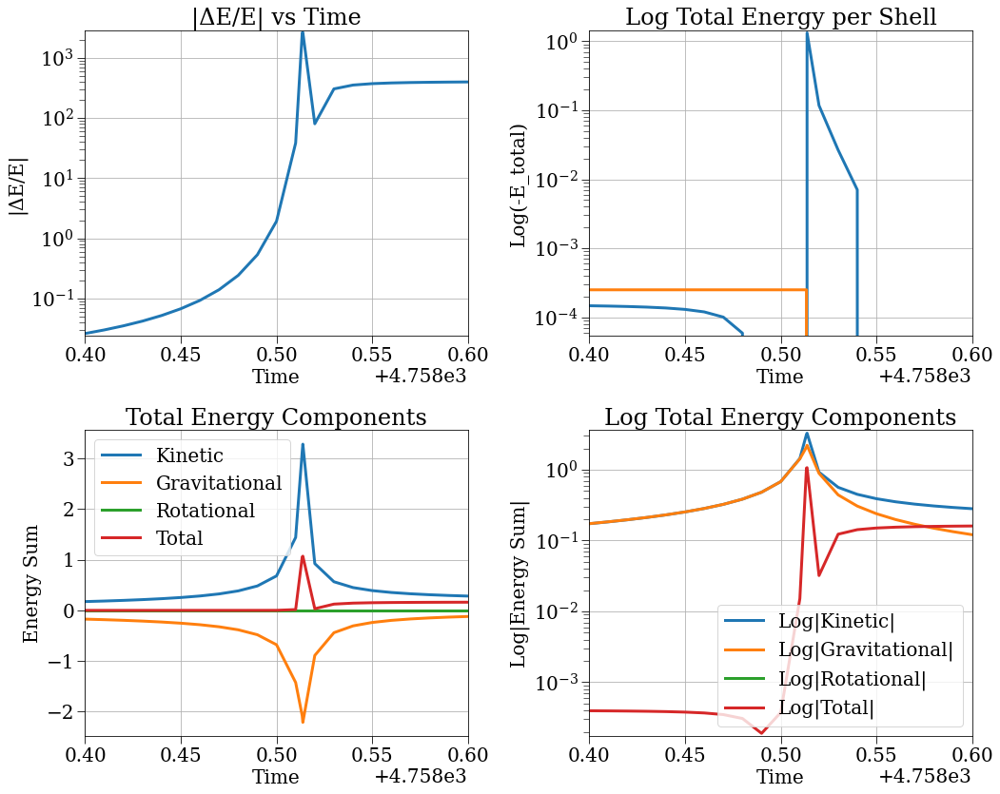

In [21]:
# Define the time window around t=4758
t_center = 4758.5
window = 0.1  # Adjust this value to control zoom level
t_min = t_center - window
t_max = t_center + window

# Add time window to all plots using a custom shell configuration
shell_config = PlotConfig(
    property_name='',
    xlim=(t_min, t_max)
)

# Generate all plots with the time window
plotter.plot_radius_analysis(shell_config)
plotter.plot_velocity_acceleration(shell_config)
plotter.plot_mass_density_timescales(shell_config)
plotter.plot_energy_analysis(shell_config)

In [10]:
sc = SphericalCollapse(neighbor2_config10_small_min)
results = sc.run()
plotter = SimulationPlotter(results, sc)

# Configuration 1: Radius analysis
plotter.plot_radius_analysis()

# Configuration 2: Velocity and acceleration analysis
plotter.plot_velocity_acceleration()

# Configuration 3: Mass, density, and timescales
plotter.plot_mass_density_timescales()
# Configuration 4: Energy analysis
plotter.plot_energy_analysis()

2025-01-27 17:04:57,071 - collapse - INFO - Simulation setup complete


KeyboardInterrupt: 

2025-01-27 19:53:43,054 - collapse - INFO - Simulation setup complete


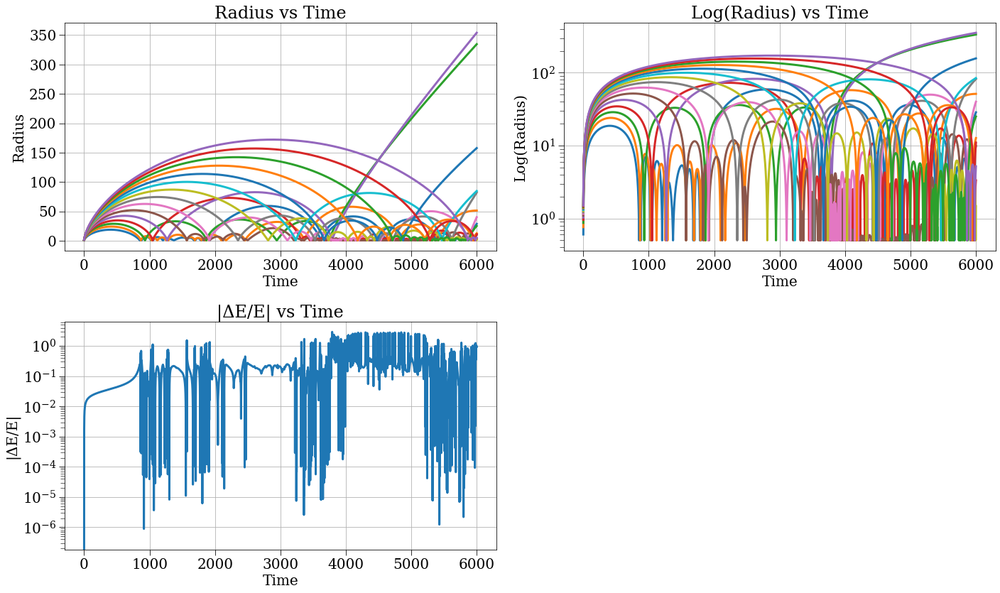

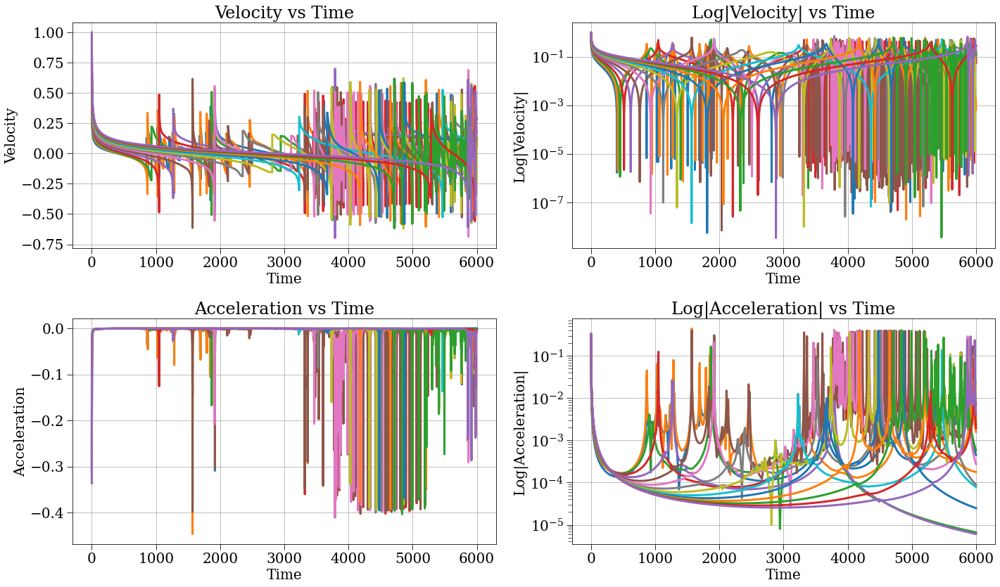

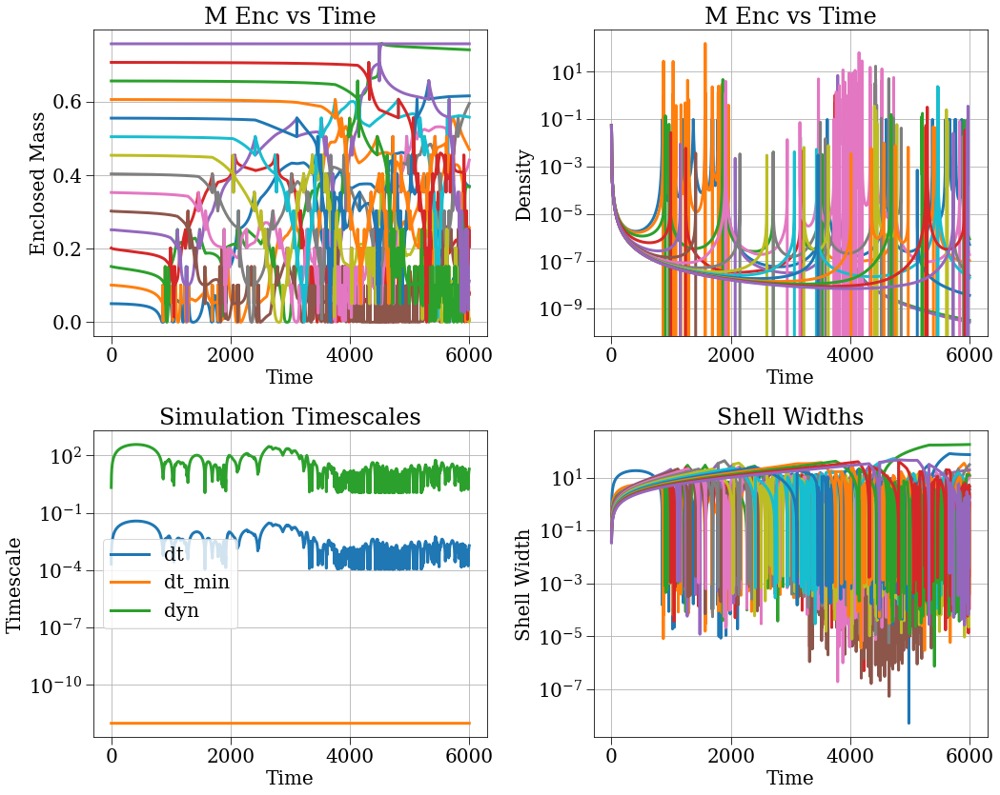

In [60]:
sc = SphericalCollapse(neighbor2_config3)
results = sc.run()
plotter = SimulationPlotter(results, sc)

# Configuration 1: Radius analysis
plotter.plot_radius_analysis()

# Configuration 2: Velocity and acceleration analysis
plotter.plot_velocity_acceleration()

# Configuration 3: Mass, density, and timescales
plotter.plot_mass_density_timescales()
# Configuration 4: Energy analysis

In [61]:
print(results['r'][0, :])

[0.60352629 0.76039548 0.87043553 0.95803827 1.0330612  1.09965526
 1.15903385 1.21288187 1.26233114 1.30818299 1.35102794 1.39131523
 1.42939544 1.46554809 1.5       ]


In [68]:
print(results['m_enc'][0, 0])
print(results['m_enc'][0, 1])
print(results['m'][0, 0], results['m'][0, 1], results['m'][0, 0] + results['m'][0, 1])
print(results['r'][0, 0], results['r'][0, 1])
print(4/3 * np.pi * (results['r'][0, 1]**3 - results['r'][0, 0]**3) * rho_H *(1+1e-2))
print(4/3 * np.pi * (results['r'][0, 0]**3) * rho_H *(1+1e-2))
r0, r1 = results['r'][0, 0], results['r'][0, 1]
print(2 * r0**3/r1**3 * results['m'][0, 0])
print(4/3 * np.pi * r0**3 * rho_H * (1+1e-2))

0.05050002416209784
0.10100004932350576
0.05050002441864978 0.05050002493175366 0.10100004935040344
0.6035262901573111 0.7603954784218195
0.04933980670478471
0.04933980620346919
0.05050002416209784
0.04933980620346919


In [77]:
sc = SphericalCollapse(neighbor2_config3)
results = sc.run()
plotter = SimulationPlotter(results, sc)

# Configuration 1: Radius analysis
plotter.plot_radius_analysis()

# Configuration 2: Velocity and acceleration analysis
plotter.plot_velocity_acceleration()

# Configuration 3: Mass, density, and timescales
plotter.plot_mass_density_timescales()
# Configuration 4: Energy analysis

2025-01-27 21:17:14,694 - collapse - INFO - Simulation setup complete


KeyboardInterrupt: 

In [ ]:
print(results['m_enc'][0, 0])
print(results['m_enc'][0, 1])
print(results['m'][0, 0], results['m'][0, 1], results['m'][0, 0] + results['m'][0, 1])
print(results['r'][0, 0], results['r'][0, 1])
print(4/3 * np.pi * (results['r'][0, 1]**3 - results['r'][0, 0]**3) * rho_H *(1+1e-2))
print(4/3 * np.pi * (results['r'][0, 0]**3) * rho_H *(1+1e-2))
r0, r1 = results['r'][0, 0], results['r'][0, 1]
print(2 * r0**3/r1**3 * results['m'][0, 0])
print(4/3 * np.pi * r0**3 * rho_H * (1+1e-2))

0.18689624487024836
0.37677224525316116
0.18937604579262934 0.18805461017448902 0.37743065596711833
0.937649828357774 1.1865667286117552
0.18993515627623392
0.18502520556281077
0.18689624487024836
0.18502520556281077


2025-01-27 21:54:05,984 - collapse - INFO - Simulation setup complete


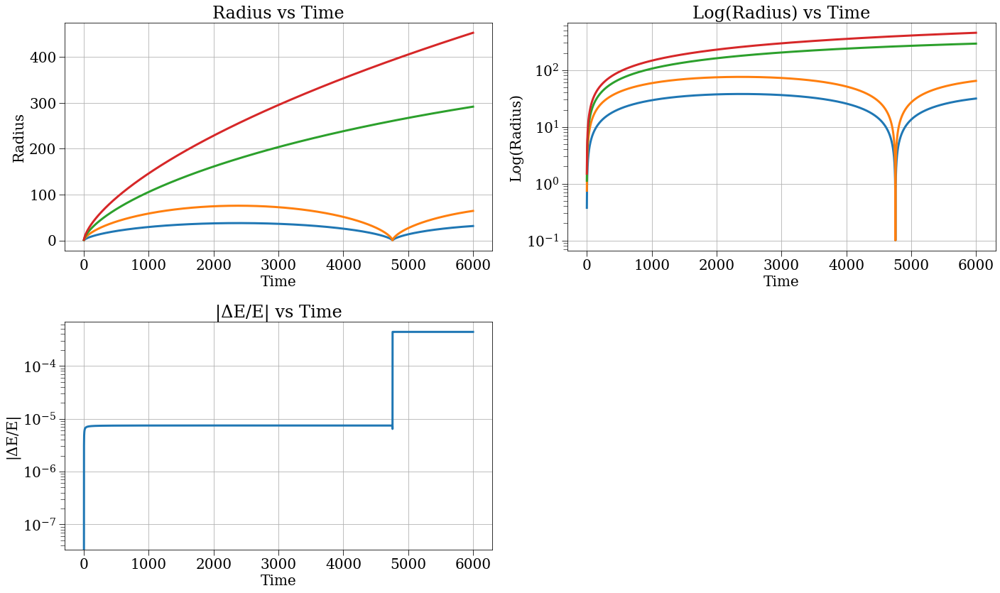

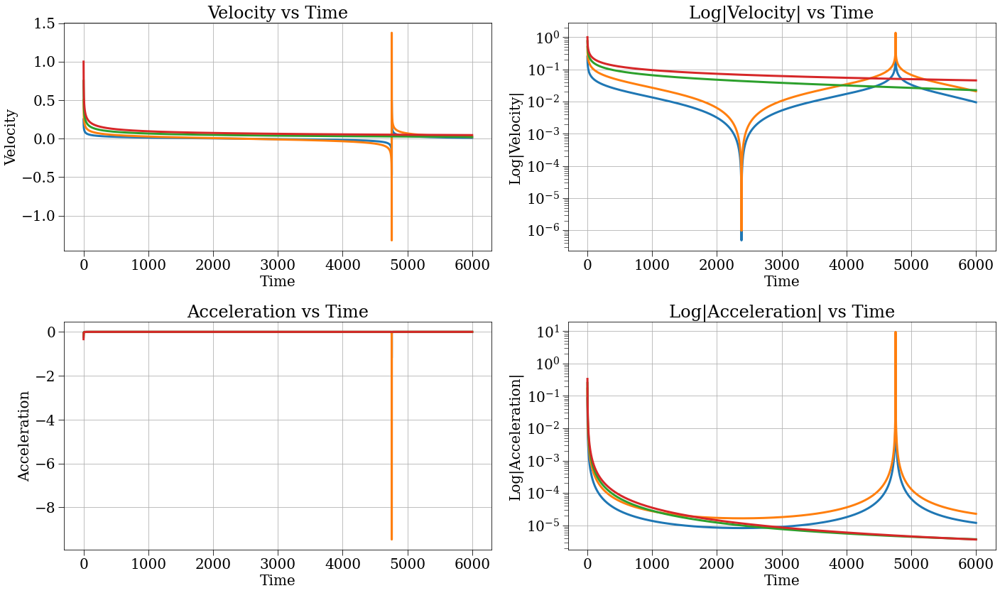

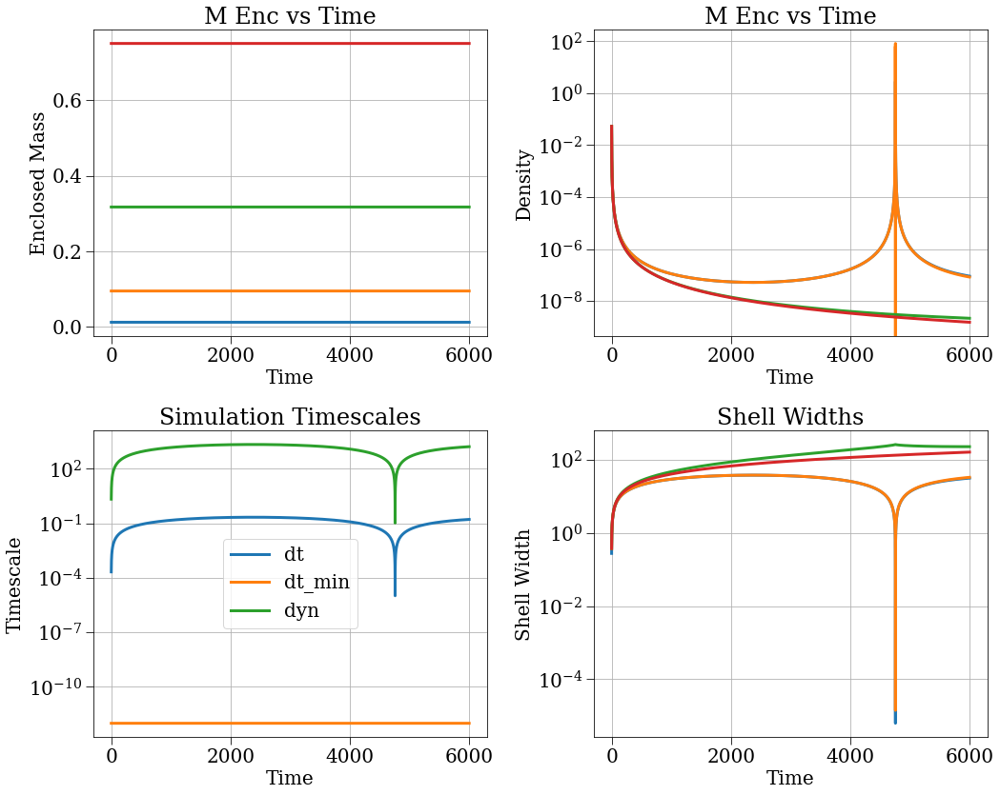

In [124]:
sc = SphericalCollapse(neighbor2_config3)
results = sc.run()
plotter = SimulationPlotter(results, sc)

# Configuration 1: Radius analysis
plotter.plot_radius_analysis()

# Configuration 2: Velocity and acceleration analysis
plotter.plot_velocity_acceleration()

# Configuration 3: Mass, density, and timescales
plotter.plot_mass_density_timescales()
# Configuration 4: Energy analysis

In [122]:
print(results['m_enc'][0, 0])
print(results['m_enc'][0, 1])
print(results['m'][0, 0], results['m'][0, 1], results['m'][0, 0] + results['m'][0, 1])
print(results['r'][0, 0], results['r'][0, 1])
print(4/3 * np.pi * (results['r'][0, 1]**3 - results['r'][0, 0]**3) * rho_H *(1+1e-2))
print(4/3 * np.pi * (results['r'][0, 0]**3) * rho_H *(1+1e-2))
r0, r1 = results['r'][0, 0], results['r'][0, 1]
print(2 * r0**3/r1**3 * results['m'][0, 0])
print(4/3 * np.pi * r0**3 * rho_H * (1+1e-2))

0.0118359375
0.0946875
0.0118359375 0.08285156249999999 0.0946875
0.375 0.75
0.0828515625
0.011835937499999998
0.002958984375
0.011835937499999998


In [113]:
print(rho_H)
print(rho_H * (1+1e-2))
a = sc.rho_func.density_at_r(sc, 0)
b = sc.rho_func.density_at_r(sc, 0.5)
c = sc.rho_func.density_at_r(sc, 1)
d = sc.rho_func.density_at_r(sc, 1.5)
print(a, b, c, d)
print(a/rho_H, b/rho_H, c/rho_H, d/rho_H)

0.05305164769729845
0.05358216417427143
0.05358216417427143 0.05358216417427143 0.05358216417427143 0.05305164769729845
1.01 1.01 1.01 1.0


In [126]:
np.cbrt(0.8**3 * (1+1e-2) + 1)

1.1490527801946766

In [99]:
from scipy import interpolate, integrate
n_points = sc.N * 10000
r_grid = np.linspace(0, sc.r_max, n_points)

# Calculate density on the grid
rho_grid = sc.rho_func.density_at_r(sc, r_grid)
print(rho_grid)
print(rho_H, rho_H * (1+1e-2))

# Calculate cumulative mass profile
# M(r) = ∫ 4πr²ρ(r)dr
mass_integrand = 4 * np.pi * r_grid**2 * rho_grid
cumulative_mass = integrate.cumulative_trapezoid(
    mass_integrand, 
    r_grid, 
    initial=0
)

# Total mass available for shells
M_total = cumulative_mass[-1]

# Target masses for each shell
target_masses = np.linspace(M_total/sc.N, M_total, sc.N)
print(target_masses)


# Interpolate to find radii that give these target masses
radius_from_mass = interpolate.interp1d(
    cumulative_mass, 
    r_grid,
    kind='cubic',
    bounds_error=True
)

radii = radius_from_mass(target_masses)
print(radii)
print(4/3 * np.pi * radii**3 * rho_H * (1+1e-2))

[0.05484214 0.05484214 0.05484214 ... 0.05305165 0.05305165 0.05305165]
0.05305164769729845 0.05358216417427143
[0.18937511 0.37875021 0.56812532 0.75750042]
[0.93764828 1.18656876 1.36132441 1.5       ]
[0.18502429 0.37496229 0.56623114 0.7575    ]


0.18937606

maybe for long-running tasks I can even submit the batch job from the notebook? That does help keep everything in one place.